# Анализ базы вакансий аналитиков данных и специалистов Data Science сайта hh.ru

# Описание исследования

В нашем распоряжении  данные о вакансиях аналитиков данных и специалистов Data Science с сайта hh.ru.

<a href='https://drive.google.com/file/d/1YsyY4OgxdvSp5HEYk1z4YaSwnsZczJrT/view'>Ссылка на презентацию</a>

# Цель исследования

Выявить различия в предлагаемых вакансиях для аналитиков данных и специалистов по Data Science.

# Задачи исследования

1. Оценить представленные данные.
2. Выполнить предобработку данных.
3. Провести исследовательский анализ данных.
4. Подготовить презентацию.

# Исходные данные

В нашем распоряжении два датасета. Файл vacancies_da.xlsx хранит информацию о вакансиях аналитиков данных. Файл vacancies_ds.xlsx - хранит информацию о вакансиях специалистов Data Science.

Структура файла vacancies_da.xlsx:

    id - идентификатор вакансии;
    name - название вакансии;
    published_at - дата публикации вакансии;
    alternate_url - ссылка на ваканасию на сайте hh.ru;
    type - тип вакансии;
    Если в поле указано значение "Открытая", значит вакансия активная.
    Если "Закрытая", то в вакансия находится в архвие и поиск кандидатов по ней уже не ведется.
    employer - название компании;
    department - отдел компании, где требуется кандидат;
    area - регион или город вакансии;
    experience - опыт работы;
    key_skills - ключевые навыки;
    schedule - график работы;
    employment - тип занятости;
    description - описание вакансии;
    description_lemmatized - лемматизированое описание вакансии;
    salary_from - нижняя граница желаемой заработной платы;
    salary_to - верхняя граница желаемой заработной платы;
    salary_bin - категория зарплат;
    key_skills_from_key_skills_field - ключевые навыки из поля key_skills;
    hard_skills_from_description - хард скиллы из описания вакансии;
    soft_skills_from_description - софт скиллы из описания вакансии.

Структура файла vacancies_ds.xlsx:

    id - идентификатор вакансии;
    name - название вакансии;
    published_at - дата публикации вакансии;
    alternate_url - ссылка на ваканасию на сайте hh.ru;
    type - тип вакансии;
    Если в поле указано значение "Открытая", значит вакансия активная.
    Если "Закрытая", то в вакансия находится в архвие и поиск кандидатов по ней уже не ведется.
    employer - название компании;
    department - отдел компании, где требуется кандидат;
    area - регион или город вакансии;
    experience - опыт работы;
    key_skills - ключевые навыки;
    schedule - график работы;
    employment - тип занятости;
    description - описание вакансии;
    description_lemmatized - лемматизированое описание вакансии;
    salary_from - нижняя граница желаемой заработной платы;
    salary_to - верхняя граница желаемой заработной платы;
    salary_bin - категория зарплат;
    key_skills_from_key_skills_field - ключевые навыки из поля key_skills;
    hard_skills_from_description - хард скиллы из описания вакансии;
    soft_skills_from_description - софт скиллы из описания вакансии.

# Данное исследование разделим на несколько частей

## Загрузка данных и подготовка их к анализу

### Импортируем необходимые библиотеки

In [1]:
import pandas as pd
import numpy as np
import collections
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
from IPython.display import Image
import warnings
import re

#### Установим библиотеку xlrd

In [2]:
pip install xlrd

Note: you may need to restart the kernel to use updated packages.


#### Установим библиотеку openpyxl

In [3]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


#### Установим библиотеку kaleido версии 0.1.0post1

In [4]:
pip install kaleido==0.1.0post1

Note: you may need to restart the kernel to use updated packages.


### Cчитаем данные из файлов excel в датафрейм и сохраним в переменные vacancies_da и vacancies_ds

In [5]:
vacancies_da = pd.read_excel(r'C:\Users\Равиль\Проекты для портфолио\3. Анализ вакансий hh.ru\vacancies_da.xlsx',\
                             engine='openpyxl')
vacancies_ds = pd.read_excel(r'C:\Users\Равиль\Проекты для портфолио\3. Анализ вакансий hh.ru\vacancies_ds.xlsx',\
                             engine='openpyxl')

### Изучим общую информацию о датафрейме vacancies_da

In [6]:
vacancies_da.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


### Изучим общую информацию о датафрейме vacancies_ds

In [7]:
vacancies_ds.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


### Выведем основную информацию о датафреймах vacancies_da и vacancies_ds

In [8]:
vacancies_da.info()
print()
vacancies_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 310 entries, 0 to 309
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                310 non-null    int64         
 1   name                              310 non-null    object        
 2   published_at                      310 non-null    datetime64[ns]
 3   alternate_url                     310 non-null    object        
 4   type                              310 non-null    object        
 5   employer                          310 non-null    object        
 6   department                        92 non-null     object        
 7   area                              310 non-null    object        
 8   experience                        310 non-null    object        
 9   key_skills                        310 non-null    object        
 10  schedule                          310 non-null    

### Выведем общее количество строк в датафреймах vacancies_da и vacancies_ds

In [9]:
count_rows_da = len(vacancies_da)
count_rows_ds = len(vacancies_ds)

print(count_rows_da)
print()
print(count_rows_ds)

310

662


### Выводы по 1 разделу

Таблицы vacancies_da и vacancies_ds содержат по 20 одинаковых столбцов в которых имеются целые, вещественные числа, дата и время и строки.
1. Типом данных в столбце id являются целые числа.
2. Типом данных в столбцах name, alternate_url, type, employer, department, area, experience, key_skills, schedule, employment, description, description_lemmatized, salary_bin, key_skills_from_key_skills_field, hard_skills_from_description, soft_skills_from_description являются строки.
3. Типом данных в столбце published_at является дата и время.
4. Типом данных в столбцах salary_from, salary_to являются вещественные числа.

Учитывая типы данных в столбцах для последующего анализа потребуется преобразование в некоторых из них.
В датафремйе vacancies_da представлено 310 вакансий, в датафрейме vacancies_ds предствлено 662 вакансии. Количество значений в каждом столбце не однинаковое. Значит имеются пропуски. Будем их обрабатывать.

## Предобработка данных

### Изучение и обработка пропусков

#### Опеределим сколько всего есть пропущенных значений в каждом столбце в датафреймах vacancies_da и vacancies_ds

In [10]:
print(vacancies_da.isna().sum().sort_values(ascending=False))
print()
print(vacancies_ds.isna().sum().sort_values(ascending=False))

salary_to                           285
salary_from                         282
soft_skills_from_description        224
department                          218
hard_skills_from_description        198
key_skills_from_key_skills_field    123
employment                            0
salary_bin                            0
description_lemmatized                0
description                           0
id                                    0
name                                  0
key_skills                            0
experience                            0
area                                  0
employer                              0
type                                  0
alternate_url                         0
published_at                          0
schedule                              0
dtype: int64

salary_from                         609
salary_to                           606
soft_skills_from_description        468
department                          392
hard_skills_from_descripti

#### Оценим сколько пропущено значений в каждом столбце в датафреймах vacancies_da и vacancies_ds в процентах от общего количества

In [11]:
print(round(vacancies_da.isna().mean().sort_values(ascending=False) * 100, 2))
print()
print(round(vacancies_ds.isna().mean().sort_values(ascending=False) * 100, 2))

salary_to                           91.94
salary_from                         90.97
soft_skills_from_description        72.26
department                          70.32
hard_skills_from_description        63.87
key_skills_from_key_skills_field    39.68
employment                           0.00
salary_bin                           0.00
description_lemmatized               0.00
description                          0.00
id                                   0.00
name                                 0.00
key_skills                           0.00
experience                           0.00
area                                 0.00
employer                             0.00
type                                 0.00
alternate_url                        0.00
published_at                         0.00
schedule                             0.00
dtype: float64

salary_from                         91.99
salary_to                           91.54
soft_skills_from_description        70.69
department        

#### Оценим в каких строках есть пропущенные значения в столбце salary_from в датафрейме vacancies_da

In [12]:
vacancies_da.loc[vacancies_da['salary_from'].isna()].head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


#### Оценим в каких строках есть пропущенные значения в столбце salary_to в датафрейме vacancies_da

In [13]:
vacancies_da.loc[vacancies_da['salary_to'].isna()].head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


#### Оценим в каких строках есть пропущенные значения в столбце soft_skills_from_description в датафрейме vacancies_da

In [14]:
vacancies_da.loc[vacancies_da['soft_skills_from_description'].isna()].head().T

,0,3,4,5,6
id,82978778,86081569,87407185,88605313,89163933
name,Data analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth""",Data Analyst,Data Analyst WMS
published_at,2024-04-09 10:29:02,2024-04-27 23:34:50,2024-04-02 17:03:10,2024-03-12 21:40:27,2024-04-02 17:52:09
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89163933
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,IQnergy,Okko,Бланк – банк для бизнеса,«UZUM TECHNOLOGIES».
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...",[]


#### Оценим в каких строках есть пропущенные значения в столбце hard_skills_from_description в датафрейме vacancies_da

In [15]:
vacancies_da.loc[vacancies_da['hard_skills_from_description'].isna()].head().T

,1,2,5,6,7
id,85053195,85053196,88605313,89163933,89426458
name,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data Analyst,Data Analyst WMS,Ведущий дата аналитик
published_at,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-03-12 21:40:27,2024-04-02 17:52:09,2024-04-22 14:12:37
alternate_url,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/89426458
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Axenix (ранее Accenture),Axenix (ранее Accenture),Бланк – банк для бизнеса,«UZUM TECHNOLOGIES».,RUTUBE
department,NaN,NaN,NaN,NaN,NaN
area,Краснодар,Ростов-на-Дону,Москва,Москва,Москва
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Junior+ (1-3 years)
key_skills,"['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...",[],"['Google Analytics', 'Анализ данных', 'Tableau..."


#### Оценим в каких строках есть пропущенные значения в столбце department в датафрейме vacancies_da

In [16]:
vacancies_da.loc[vacancies_da['department'].isna()].head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


#### Оценим в каких строках есть пропущенные значения в столбце key_skills_from_key_skills_field в датафрейме vacancies_da

In [17]:
vacancies_da.loc[vacancies_da['key_skills_from_key_skills_field'].isna()].head().T

,6,12,17,18,24
id,89163933,90430340,91765959,91765960,92070271
name,Data Analyst WMS,Senior Data analyst,Дата аналитик (Data Scientist),Дата аналитик (Data Scientist),Младший аналитик данных (Junior Data Analyst)
published_at,2024-04-02 17:52:09,2024-04-30 10:50:09,2024-04-04 10:10:44,2024-03-28 06:25:29,2024-03-18 22:41:00
alternate_url,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/90430340,https://hh.ru/vacancy/91765959,https://hh.ru/vacancy/91765960,https://hh.ru/vacancy/92070271
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,«UZUM TECHNOLOGIES».,Ок Софт,Центр финансовых технологий,Центр финансовых технологий,СБЕР
department,NaN,NaN,NaN,NaN,Сбер для экспертов
area,Москва,Москва,Санкт-Петербург,Новосибирск,Москва
experience,Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior (no experince)
key_skills,[],"['Решение проблем', 'Юнит-экономика', 'Приняти...",['Pandas'],['Pandas'],[]


#### Оценим в каких строках есть пропущенные значения в столбце salary_from в датафрейме vacancies_ds

In [18]:
vacancies_ds.loc[vacancies_ds['salary_from'].isna()].head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


#### Оценим в каких строках есть пропущенные значения в столбце salary_to в датафрейме vacancies_ds

In [19]:
vacancies_ds.loc[vacancies_ds['salary_to'].isna()].head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


#### Оценим в каких строках есть пропущенные значения в столбце soft_skills_from_description в датафрейме vacancies_ds

In [20]:
vacancies_ds.loc[vacancies_ds['soft_skills_from_description'].isna()].head().T

,0,1,2,5,9
id,67411146,78465611,81857265,83575438,87400111
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data Scientist
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Профи (profi.ru),Совкомбанк
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Казань
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


#### Оценим в каких строках есть пропущенные значения в столбце hard_skills_from_description в датафрейме vacancies_ds

In [21]:
vacancies_ds.loc[vacancies_ds['hard_skills_from_description'].isna()].head().T

,0,1,5,6,7
id,67411146,78465611,83575438,86018279,86879304
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Senior Data Scientist в команду «Матчинг»,Middle \ Senior Data Scientist в команду модел...,Data scientist (команда Collection)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-25 14:18:46,2024-04-23 17:15:40,2024-04-23 17:15:53
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/86018279,https://hh.ru/vacancy/86879304
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Профи (profi.ru),Банк ВТБ (ПАО),Банк ВТБ (ПАО)
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,"ПАО ВТБ, Технологический блок","ПАО ВТБ, Технологический блок"
area,Москва,Москва,Москва,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Middle (3-6 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Документация', 'R', 'Python', 'Креативность'...","['Документация', 'Python', 'Big Data', 'ML', '..."


#### Оценим в каких строках есть пропущенные значения в столбце department в датафрейме vacancies_ds

In [22]:
vacancies_ds.loc[vacancies_ds['department'].isna()].head().T

,2,3,4,5,9
id,81857265,81857296,81857358,83575438,87400111
name,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data Scientist
published_at,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,Университет Иннополис,Университет Иннополис,Профи (profi.ru),Совкомбанк
department,NaN,NaN,NaN,NaN,NaN
area,Санкт-Петербург,Москва,Санкт-Петербург,Москва,Казань
experience,Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Junior+ (1-3 years)
key_skills,"['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


#### Оценим в каких строках есть пропущенные значения в столбце key_skills_from_key_skills_field в датафрейме vacancies_ds

In [23]:
vacancies_ds.loc[vacancies_ds['key_skills_from_key_skills_field'].isna()].head().T

,10,14,19,28,30
id,87899403,88986598,89761049,90735443,90830592
name,Lead data scientist (Анализ цены и Trade in),Middle+/Senior Data Scientist (модели кредитно...,Data Scientist / CV Researcher (Middle+/Senior),Data Scientist,Computer Vision Engineer \ Data Scientist в ко...
published_at,2024-04-15 10:20:28,2024-04-25 11:23:10,2024-04-20 08:49:05,2024-03-04 17:17:17,2024-04-04 11:16:13
alternate_url,https://hh.ru/vacancy/87899403,https://hh.ru/vacancy/88986598,https://hh.ru/vacancy/89761049,https://hh.ru/vacancy/90735443,https://hh.ru/vacancy/90830592
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Домклик,Альфа-Банк,Филиал в г. Санкт-Петербург АО Концерн Радиост...,Faberlic,СБЕР
department,NaN,Альфа-Банк. Центральный офис,NaN,NaN,Сбер. IT
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Middle (3-6 years)
key_skills,['Pandas'],['Pandas'],[],[],[]


### Изучение дубликатов в датафрейме

#### Проверим есть ли явные дубликаты в датафреймах vacancies_da и vacancies_ds

In [24]:
print(vacancies_da.duplicated().sum())
print()
print(vacancies_ds.duplicated().sum())

0

0


#### Оценим есть ли дубликаты в идентификаторах вакансий в датафреймах vacancies_da и vacancies_ds

In [25]:
print(vacancies_da['id'].duplicated().sum())
print()
print(vacancies_ds['id'].duplicated().sum())

0

0


#### Оценим есть ли явные дубликаты, сравнивая два датафрейма vacancies_da и vacancies_ds между собой

##### Объединим датафреймы vacancies_da и vacancies_ds в один датафрейм merged_vacancies

In [26]:
merged_vacancies = pd.concat([vacancies_da, vacancies_ds])

##### Оценим есть ли явные дубликаты в объединенном датафрейме merged_vacancies

In [27]:
merged_vacancies_count = merged_vacancies['id'].duplicated().sum()
merged_vacancies_count

17

##### Проверим какие дубликаты есть в объединенном датафрейме merged_vacancies

In [28]:
duplicate_vacancies = merged_vacancies[merged_vacancies.duplicated(subset='id', keep=False)]
sorted_duplicate_vacancies = duplicate_vacancies.sort_values(by='id')
sorted_duplicate_vacancies.head().T

,17,61,18,62,109
id,91765959,91765959,91765960,91765960,93551149
name,Дата аналитик (Data Scientist),Дата аналитик (Data Scientist),Дата аналитик (Data Scientist),Дата аналитик (Data Scientist),Дата аналитик (Data Scientist)
published_at,2024-04-04 10:10:44,2024-04-04 10:10:44,2024-03-28 06:25:29,2024-03-28 06:25:29,2024-03-19 05:41:39
alternate_url,https://hh.ru/vacancy/91765959,https://hh.ru/vacancy/91765959,https://hh.ru/vacancy/91765960,https://hh.ru/vacancy/91765960,https://hh.ru/vacancy/93551149
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Центр финансовых технологий,Центр финансовых технологий,Центр финансовых технологий,Центр финансовых технологий,Центр финансовых технологий
department,NaN,NaN,NaN,NaN,NaN
area,Санкт-Петербург,Санкт-Петербург,Новосибирск,Новосибирск,Казань
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,['Pandas'],['Pandas'],['Pandas'],['Pandas'],['Pandas']


В объединенном датафрейме merged_vacancies есть 17 полных дубликатов вакансий. Наиболее вероятно полные дубликаты возникли из-за того, что в названиях вакансий есть однорвеменно и аналитик данных и специалист по Data Science.

#### Удалим из датафреймов vacancies_da и vacancies_ds дубликаты, которые содержаться в объединенном датафрейме merged_vacancies

In [29]:
vacancies_da = vacancies_da[~vacancies_da['id'].isin(sorted_duplicate_vacancies['id'])].reset_index(drop=True)
vacancies_ds = vacancies_ds[~vacancies_ds['id'].isin(sorted_duplicate_vacancies['id'])].reset_index(drop=True)

#### Проверим общую информацию по датафреймам vacancies_da и vacancies_ds после удаления

In [30]:
vacancies_da.info()
print()
vacancies_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 293 entries, 0 to 292
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                293 non-null    int64         
 1   name                              293 non-null    object        
 2   published_at                      293 non-null    datetime64[ns]
 3   alternate_url                     293 non-null    object        
 4   type                              293 non-null    object        
 5   employer                          293 non-null    object        
 6   department                        89 non-null     object        
 7   area                              293 non-null    object        
 8   experience                        293 non-null    object        
 9   key_skills                        293 non-null    object        
 10  schedule                          293 non-null    

#### Оценим процент удаленных данных в датафреймах vacancies_da и vacancies_ds

In [31]:
percent_del_data_da = round(((count_rows_da - len(vacancies_da))/count_rows_da)*100, 2)
percent_del_data_ds = round(((count_rows_ds - len(vacancies_ds))/count_rows_ds)*100, 2)

print(f'Процент удаленных данных в датафрйеме vacancies_da: {percent_del_data_da} %')
print(f'Процент удаленных данных в датафрйеме vacancies_da: {percent_del_data_ds} %')

Процент удаленных данных в датафрйеме vacancies_da: 5.48 %
Процент удаленных данных в датафрйеме vacancies_da: 2.57 %


### Изучение категориальных переменных

#### Оценим какие уникальные значения названий вакансий аналитиков данных и специалистов Data Science представлены по столбцу name

In [32]:
display(sorted(list(vacancies_da['name'].unique()))[:10])
print()
display(sorted(list(vacancies_ds['name'].unique()))[:10])

['Antifraud / data analyst',
 'BI-analyst \\ Data analyst \\ Аналитик данных (Senior)',
 'BI-аналитик / Data Analyst / Аналитик данных',
 'Data Analyst',
 'Data Analyst "Growth"',
 'Data Analyst (Analytical Support Team) (Ru + En) JEDai',
 'Data Analyst (Big Data)',
 'Data Analyst (C&B отдел)',
 'Data Analyst (Customer Communication)',
 'Data Analyst (Finance)']

['Assistant Professor - Data Science&AI (english)',
 'Associate Professor - Data Science&AI (english)',
 'Computer Vision Engineer \\ Data Scientist в команду Layer, SberDevices.',
 'Cпециалист по работе с данными (Data Scientist)',
 'Data Engineer / Data scientist Middle',
 'Data Science',
 'Data Science (Компьютерное зрение)',
 'Data Science (подразделение комплаенс)',
 'Data Science / ML инженер',
 'Data Science Lead / Руководитель группы специалистов по машинному обучению и аналитике данных']

#### Напишем функцию display_unique_values, которая будет выводить отсортированные уникальные значения категориальным переменных столбцов датафрейма для аналитиков данных и специалистов Data Science

In [33]:
def display_unique_values(column_name, n):
    unique_values_da = sorted(list(vacancies_da[column_name].unique())[:n])
    unique_values_ds = sorted(list(vacancies_ds[column_name].unique())[:n])

    for value in unique_values_da:
        print(value)
    print()

    for value in unique_values_ds:
        print(value)

#### Оценим какие уникальные значения типов вакансий представлены по столбцу type, используя функцию display_unique_values

In [34]:
display_unique_values('type', 10)

Открытая

Открытая


#### Оценим какие уникальные значения названий компаний представлены по столбцу employer, используя функцию display_unique_values

In [35]:
display_unique_values('employer', 10)

Axenix (ранее Accenture)
Evercode Lab
IQnergy
Okko
RUTUBE
«UZUM TECHNOLOGIES».
Бланк – банк для бизнеса
ПСБ (ПАО «Промсвязьбанк»)
Судоходная компания Волжское пароходство
Телеком биржа

Ozon
Альфа-Банк
Банк ВТБ (ПАО)
Вкусно — и точка
Газпром нефть
Домклик
Профи (profi.ru)
Совкомбанк
Специальный Технологический Центр (ООО СТЦ)
Университет Иннополис


#### В датафрейме vacancies_ds в столбце employer заменим название компании билайн на Билайн и оценим результат замены

In [36]:
vacancies_ds['employer'] = vacancies_ds['employer'].replace({'билайн': 'Билайн'})
display_unique_values('employer', 10)

Axenix (ранее Accenture)
Evercode Lab
IQnergy
Okko
RUTUBE
«UZUM TECHNOLOGIES».
Бланк – банк для бизнеса
ПСБ (ПАО «Промсвязьбанк»)
Судоходная компания Волжское пароходство
Телеком биржа

Ozon
Альфа-Банк
Банк ВТБ (ПАО)
Вкусно — и точка
Газпром нефть
Домклик
Профи (profi.ru)
Совкомбанк
Специальный Технологический Центр (ООО СТЦ)
Университет Иннополис


#### Оценим какие уникальные значения отделов компаний представлены по столбцу department для аналитиков данных и специалистов по Data Science

In [37]:
display(vacancies_da['department'].value_counts().head(10))
print()
display(vacancies_ds['department'].value_counts().head(10))

Сбер для экспертов                              49
Сбер. Data Science                              11
«МТС», Digital                                   7
ПАО «Промсвязьбанк», Бизнес и инфраструктура     5
Сбер. IT                                         4
МегаФон, IT                                      2
РЕСО-Гарантия, САО, IT                           2
Лента, федеральная розничная сеть, IT            2
Компания «СПОРТМАСТЕР», Sportmaster Lab          1
Леруа Мерлен. Центральный офис                   1
Name: department, dtype: int64

Сбер для экспертов                93
Сбер. Data Science                22
Ozon Информационные технологии    20
Газпромбанк                       17
Сбер. IT                          14
ПАО ВТБ, Технологический блок     11
МегаФон, IT                        6
ГК Иннотех | Большие данные        6
билайн: ИТ, Data, Digital          6
ДОМ.РФ ИТ                          6
Name: department, dtype: int64

#### В датафреймах vacancies_da и  vacancies_ds в столбце department заменим названия отделов с билайн: ИТ, Data, Digital на Билайн: ИТ, Data, Digital, билайн на Билайн, удалим лишний проблел в начале у значения отдела Альфа-Банк и оценим результат замены

In [38]:
vacancies_da['department'] = vacancies_da['department'].replace({' Альфа-Банк': 'Альфа-Банк'})
vacancies_ds['department'] = vacancies_ds['department'].replace({'билайн: ИТ, Data, Digital': 'Билайн: ИТ, Data, Digital',\
                                                                 'билайн': 'Билайн'})
display(vacancies_da['department'].value_counts().head(10))
print()
display(vacancies_ds['department'].value_counts().head(10))

Сбер для экспертов                              49
Сбер. Data Science                              11
«МТС», Digital                                   7
ПАО «Промсвязьбанк», Бизнес и инфраструктура     5
Сбер. IT                                         4
МегаФон, IT                                      2
РЕСО-Гарантия, САО, IT                           2
Лента, федеральная розничная сеть, IT            2
Компания «СПОРТМАСТЕР», Sportmaster Lab          1
Леруа Мерлен. Центральный офис                   1
Name: department, dtype: int64

Сбер для экспертов                93
Сбер. Data Science                22
Ozon Информационные технологии    20
Газпромбанк                       17
Сбер. IT                          14
ПАО ВТБ, Технологический блок     11
МегаФон, IT                        6
Билайн: ИТ, Data, Digital          6
ДОМ.РФ ИТ                          6
ГК Иннотех | Большие данные        6
Name: department, dtype: int64

#### Оценим какие уникальные значения регионов или городов вакансий представлены по столбцу area, используя функцию display_unique_values

In [39]:
display_unique_values('area', 10)

Владивосток
Казань
Краснодар
Москва
Нижний Новгород
Новосибирск
Ростов-на-Дону
Самара
Санкт-Петербург
Ступино

Воронеж
Екатеринбург
Казань
Москва
Нижний Новгород
Новосибирск
Пермь
Санкт-Петербург
Таганрог
Челябинск


#### Оценим какие уникальные значения опыта работы представлены по столбцу experience, используя функцию display_unique_values

In [40]:
display_unique_values('experience', 10)

Junior (no experince)
Junior+ (1-3 years)
Middle (3-6 years)
Senior (6+ years)

Junior (no experince)
Junior+ (1-3 years)
Middle (3-6 years)
Senior (6+ years)


#### Оценим какие уникальные значения графика работы представлены по столбцу schedule, используя функцию display_unique_values

In [41]:
display_unique_values('schedule', 10)

Гибкий график
Полный день
Сменный график
Удаленная работа

Гибкий график
Полный день
Сменный график
Удаленная работа


#### Оценим какие уникальные значения типов занятости представлены по столбцу employment, используя функцию display_unique_values

In [42]:
display_unique_values('employment', 10)

Полная занятость
Частичная занятость

Полная занятость
Проектная работа
Стажировка
Частичная занятость


#### Оценим какие уникальные значения категорий зарплат представлены по столбцу salary_bin, используя функцию display_unique_values

In [43]:
display_unique_values('salary_bin', 10)

Больше 300 тысяч
ЗП не указана
Меньше 100 тысяч
От 100 тысяч до 200 тысяч
От 200 тысяч до 300 тысяч

Больше 300 тысяч
ЗП не указана
Меньше 100 тысяч
От 100 тысяч до 200 тысяч
От 200 тысяч до 300 тысяч


### Выводы по 2 разделу

#### Причины появления пропусков данных

В исходных датафреймах пропущенные значения могут быть вызваны различными причинами:

1. Пропуски в столбцах salary_from и salary_to могуты быть связаны с тем, что немногие работодатели указаывают зарпалтную вилку в своих вакансиях. Вероятно в большинстве случаев зарплата обсуждается по итогам собеседования и сильно зависит от опыта и знаний кандидата.
2. Пропуски в столбце department могут быть связаны с тем, что не все работодатели указывают отдел компании в котором ведется поиск кандидатов.
3. Пропуски в столбцах soft_skills_from_description, hard_skills_from_description могут быть связаны с тем, что невезде в описании вакансии можно выделить отдельно soft, hard скиллы.
4. Пропуски в стобце key_skills_from_key_skills_field могут быть связаны с тем, что есть неочевидные пропуски в столбце key_skills, а в тех строках где поле key_skills заполнено, а в поле key_skills_from_key_skills_field имеется пропуск, данные значения из key_skills занесены либо в поле hard_skills_from_description либо в soft_skills_from_description.
Чтобы точно определить причины пропусков в данных, необходимо провести более детальный анализ данных и обратиться к источнику данных.

#### Решение по заполнению пропусков

Учитывая название и содержание столбцов с пропущенными значениями, логичной замены пропусков здесь предположить невозможно, так как какой-либо очевидной связи между столбцами нет. А где связь есть, например между столбцами key_skills_from_key_skills_field и key_skills существуют неочевидные пропуски.

#### Выводы по изучению дубликатов

Сравнивая датасеты vacancies_da и vacancies_ds, были найдены 17 полных дубликатов вакансий, которые присутствовали в обох датафреймах. Данный дубликаты были удалены. Процент удаленных данных в датафрйеме vacancies_da составил 5.48 %. Процент удаленных данных в датафрйеме vacancies_da составил 2.57 %.

#### Выводы по изучению категориальных переменных

Серьезных проблем в категориальных переменных не обнаружено. В датафреймах vacancies_da и vacancies_ds в столбце с названиями компаний и отделами компаний было заменено несколько значений.

## Исследовательский анализ данных

### Определение доли грейдов Junior, Junior+, Middle, Senior среди вакансий аналитик данных и специалист по Data Science

#### Построим сводную таблицу для датафрейма vacancies_da методом pivot_table() со следующими столбцами:
    experience - грейд (опыт работы);
    experience_count - количество вакансий с данным грейдом (опытом работы);
    experience_count_percent - количество вакансий с данным грейдом (опытом работы) в процентах от общего.

In [44]:
data_pivot_grade_da = vacancies_da.pivot_table(index='experience', values='id', aggfunc=['count']).reset_index()
data_pivot_grade_da.columns = ['experience', 'experience_count']
data_pivot_grade_da['experience_count_percent'] = round((data_pivot_grade_da['experience_count'] / \
                                                      vacancies_da['id'].count()) * 100, 2)
data_pivot_grade_sorted_da = data_pivot_grade_da.sort_values(by='experience_count_percent', ascending = \
                                                             False).reset_index(drop=True)
data_pivot_grade_sorted_da

,experience,experience_count,experience_count_percent
0,Junior+ (1-3 years),165,56.31
1,Middle (3-6 years),116,39.59
2,Junior (no experince),9,3.07
3,Senior (6+ years),3,1.02


#### Построим сводную таблицу для датафрейма vacancies_ds методом pivot_table() со следующими столбцами:
    experience - грейд (опыт работы);
    experience_count - количество вакансий с данным грейдом (опытом работы);
    experience_count_percent - количество вакансий с данным грейдом (опытом работы) в процентах от общего.

In [45]:
data_pivot_grade_ds = vacancies_ds.pivot_table(index='experience', values='id', aggfunc=['count']).reset_index()
data_pivot_grade_ds.columns = ['experience', 'experience_count']
data_pivot_grade_ds['experience_count_percent'] = round((data_pivot_grade_ds['experience_count'] / \
                                                      vacancies_ds['id'].count()) * 100, 2)
data_pivot_grade_sorted_ds = data_pivot_grade_ds.sort_values(by='experience_count_percent', ascending = \
                                                             False).reset_index(drop=True)
data_pivot_grade_ds

,experience,experience_count,experience_count_percent
0,Junior (no experince),26,4.03
1,Junior+ (1-3 years),276,42.79
2,Middle (3-6 years),320,49.61
3,Senior (6+ years),23,3.57


#### Определим общее количество вакансий аналитиков данных и специалистов по Data Science

In [46]:
display(data_pivot_grade_sorted_da['experience_count'].sum())
print()
display(data_pivot_grade_sorted_ds['experience_count'].sum())

293

645

#### Построим столбчатую диаграмму доли грейдов Junior, Junior+, Middle, Senior среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц data_pivot_grade_da и data_pivot_grade_ds

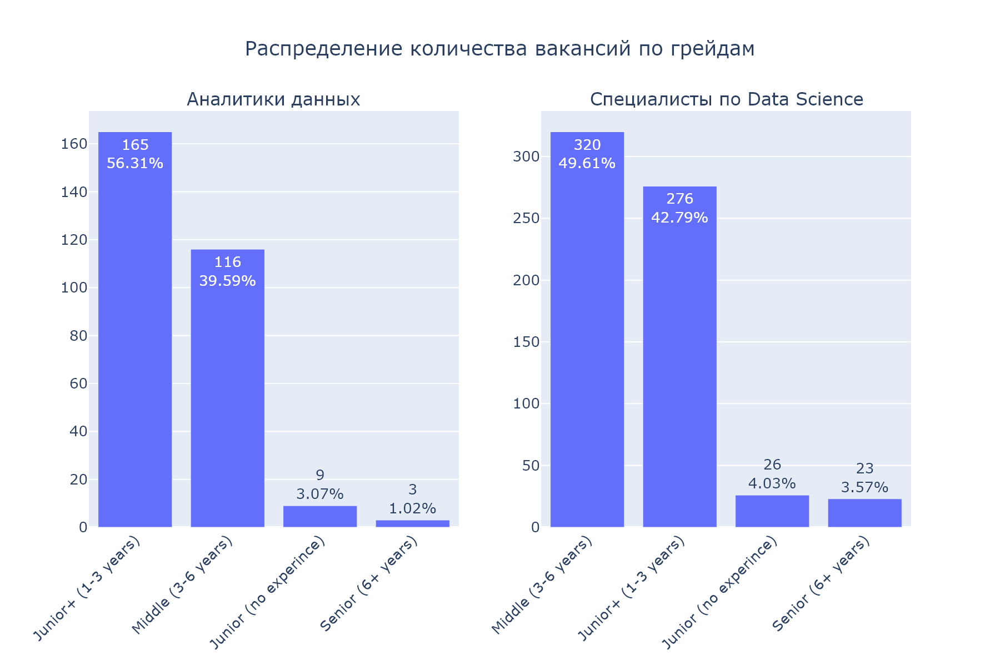

In [47]:
data_pivot_grade_sorted_da['text'] = data_pivot_grade_sorted_da.apply(lambda x: \
                                               f'{x["experience_count"]:.0f}<br>{x["experience_count_percent"]:.2f}%',\
                                                                      axis=1)
fig1 = px.bar(data_pivot_grade_sorted_da,
             x='experience',
             y='experience_count',
             text='text')
fig1.update_layout(title='Распределение количества вакансий по грейдам', title_x=0.5,
                  xaxis_title='Опыт работы (грейд)',
                  yaxis_title='Количество вакансий',
                  font_size=13)

data_pivot_grade_sorted_ds['text'] = data_pivot_grade_sorted_ds.apply(lambda x: \
                                               f'{x["experience_count"]:.0f}<br>{x["experience_count_percent"]:.2f}%',\
                                                                      axis=1)
fig2 = px.bar(data_pivot_grade_sorted_ds,
             x='experience',
             y='experience_count',
             text='text')
fig2.update_layout(title='Распределение количества вакансий по грейдам', title_x=0.5,
                  xaxis_title='Опыт работы (грейд)',
                  yaxis_title='Количество вакансий',
                  font_size=13)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(
    width=990,
    height=600,
    title_text="Распределение количества вакансий по грейдам",
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
)
pio.write_image(fig, 'Распределение количества вакансий по грейдам.png', width=900, height=600, scale=2)
Image('Распределение количества вакансий по грейдам.png')

#### Выводы по пункту 3.1

1. Всего представлено 293 вакансии аналитиков данных и 645 вакансий специалистов по Data Science.
2. Вакансии разделены на грейды "Junior (no experince)", "Junior+ (1-3 years)", "Middle (3-6 years)" и "Senior (6+ years)".
3. Для аналитиков данных больше всего вакансий имеется для грейда "Junior+ (1-3 years)" - 165 вакансий или 56,31%, второй по количеству грейд - "Middle (3-6 years)" - 116 вакансий или 39,59%. Доля остальных грейдов не превышает 5%.
4. Для специалистов по Data Science больше всего вакансий имеется для грейда "Middle (3-6 years)" - 320 вакансий или 49,61%, второй по количеству грейд - "Junior+ (1-3 years)" - 276 вакансий или 42,79%. Доля остальных грейдов не превышает 5%.

### Определение наиболее желаемых кандидатов на вакансии Аналитик данных

#### Определение хард скиллов на вакансии Аналитик данных для грейдов Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

##### Оценим в каком виде представлены скиллы в столбце key_skills_from_key_skills_field датафрейма vacancies_da

In [48]:
vacancies_da['key_skills_from_key_skills_field'].head(10)

0    SQL, Математическая статистика, Linux, Clickho...
1    SQL, DWH, Teradata, Hadoop, Airflow, Greenplum...
2    SQL, DWH, Teradata, Hadoop, Airflow, Greenplum...
3                                        Анализ данных
4                               Python, SQL, A/B тесты
5    SQL, Python, Power BI, PowerBI, DAX, MS Power ...
6                                                  NaN
7    SQL, Аналитика, Python, Анализ данных, Работа ...
8    SQL, MS SQL, Анализ рисков, Риск-менеджмент, О...
9    MS Excel, Финансовый анализ, SQL, Работа в ком...
Name: key_skills_from_key_skills_field, dtype: object

##### Преобразуем значения столбца key_skills_from_key_skills_field датафрейма vacancies_da так, чтобы отдельный скилл являлся отдельной строкой, используя в качестве разделителя запятую, создав отдельный объект Series hard_skills_da_series

In [49]:
hard_skills_da_series = vacancies_da['key_skills_from_key_skills_field'].str.split(', ', expand=True).stack().\
reset_index(drop=True)
hard_skills_da_series.head(10)

0                          SQL
1    Математическая статистика
2                        Linux
3                   Clickhouse
4                           BI
5                         HTTP
6                          Git
7                       Python
8               Поиск аномалий
9       Анализ временных рядов
dtype: object

##### Оценим какие уникальные значения представлены в объекте Series hard_skills_da_series

In [50]:
sorted(list(hard_skills_da_series.unique()))[:10]

['A/B тестирование',
 'A/B тесты',
 'A/B/n',
 'AB-test',
 'AWS Redshift',
 'Ad Hoc Analysis',
 'Airflow',
 'Amplitude',
 'Analysis',
 'Analytical skills']

##### Сопоставляя уникальные значения объекта Series hard_skills_da_series, выполним замену однотипных скиллов на одно выбраннное значение

In [51]:
hard_skills_da_series = hard_skills_da_series.replace({
    'A/B тесты': 'A/B тестирование',
    'AB-test': 'A/B тестирование',
    'A/B/n': 'A/B тестирование',
    'AWS Redshift': 'AWS',
    'Ad Hoc Analysis': 'Ad Hoc Analysis',
    'Airflow': 'Apache Airflow',
    'Amplitude': 'Amplitude',
    'Analysis': 'Анализ данных',
    'Analytical skills': 'Аналитические навыки',
    'Anti-fraud': 'Антифрод',
    'Apache Airflow': 'Apache Airflow',
    'Apache Spark': 'Apache Spark',
    'Apache Superset': 'Apache Superset',
    'AppMetrica': 'AppMetrica',
    'Appmetrika': 'AppMetrica',
    'Appsflyer': 'Appsflyer',
    'Atlassian Confluence': 'Atlassian Confluence',
    'BI': 'BI',
    'BI Apache SuperSet': 'BI Apache SuperSet',
    'BPMN': 'BPMN',
    'Big Data': 'Big Data',
    'BigData': 'Big Data',
    'BigQuery': 'Big Query',
    'Black box testing': 'Black box testing',
    'Bokeh': 'Bokeh',
    'Business Analysis': 'Бизнес-анализ',
    'CDM': 'CDM',
    'ClickHouse': 'SQL',
    'Clickhouse': 'SQL',
    'Crypto': 'Crypto',
    'Cистемы управления базами данных': 'SQL',
    'DAX': 'DAX',
    'DBT': 'DBT',
    'DDS': 'DDS',
    'DWH': 'Data Warehousing',
    'Data': 'Data',
    'Data Analysis': 'Анализ данных',
    'Data Analyst': 'Аналитик данных',
    'Data Mining': 'Data Mining',
    'Data Science': 'Data Science',
    'Data Warehousing': 'Data Warehousing',
    'Data engineer': 'Data Engineer',
    'Datalens': 'Datalens',
    'Debezium': 'Debezium',
    'DevOps': 'DevOps',
    'Django Framework': 'Django Framework',
    'EDA': 'EDA',
    'ETL': 'ETL',
    'Exasol': 'Exasol',
    'Excel': 'MS Excel',
    'FineBI': 'FineBI',
    'Firebase': 'Firebase',
    'GA4': 'GA4',
    'GExcel': 'GExcel',
    'GTM': 'GTM',
    'Git': 'Git',
    'Google Analytics': 'Google Analytics',
    'Google Big Query': 'Google Big Query',
    'Google Cloud Platform': 'Google Cloud Platform',
    'Google Data Studio': 'Google Data Studio',
    'Google Docs': 'Google Docs',
    'Google Tag Manager': 'Google Tag Manager',
    'Google таблицы': 'Google таблицы',
    'Grafana': 'Grafana',
    'Greenplum': 'SQL',
    'HTTP': 'HTTP',
    'Hadoop': 'Hadoop',
    'Hive': 'Hive',
    'IPC': 'IPC',
    'Improvado': 'Improvado',
    'Informatica': 'Informatica',
    'Internet': 'Internet',
    'Java': 'Java',
    'JavaScript': 'JavaScript',
    'Jetstat': 'Jetstat',
    'Jupyter Notebook': 'Jupyter Notebook',
    'Linux': 'Linux',
    'Luxms': 'Luxms',
    'ML': 'Машинное обучение',
    'ML-прогнозирование': 'Машинное обучение',
    'MS Excel': 'MS Excel',
    'MS Olap': 'MS Olap',
    'MS Power BI': 'Power BI',
    'MS PowerPoint': 'MS Power Point',
    'MS SQL': 'SQL',
    'MS SQL Server': 'SQL',
    'Machine Learning': 'Машинное обучение',
    'Matomo': 'Matomo',
    'Matplotlib': 'Python (Matplotlib)',
    'Metabase': 'Metabase',
    'Miner': 'Miner',
    'Mixpanel': 'Mixpanel',
    'MongoDB': 'MongoDB',
    'MySQL': 'SQL',
    'NoSQL': 'SQL',
    'Numpy': 'Python',
    'ODS': 'ODS',
    'ORACLE': 'ORACLE',
    'Olap (online analytical processing)': 'Olap',
    'Oracle BI': 'Oracle BI',
    'Oracle DB': 'Oracle DB',
    'Oracle Exadata': 'Oracle Exadata',
    'Pandas': 'Python (Pandas)',
    'Plotly': 'Python (Plotly)',
    'Polars': 'Polars',
    'PostgreSQL': 'SQL',
    'Postgres': 'SQL',
    'Power BI': 'Power BI',
    'Power Pivot': 'Power Pivot',
    'Power Query': 'Power Query',
    'PowerBI': 'Power BI',
    'Product Analytics': 'Product Analytics',
    'Programmatic': 'Программирование',
    'PySpark': 'PySpark',
    'Pyspark': 'PySpark',
    'Python': 'Python',
    'Qlik': 'Qlik Sense',
    'Qlik Sense': 'Qlik Sense',
    'R': 'R',
    'ROAS': 'ROAS',
    'ROI': 'ROI',
    'RTB': 'RTB',
    'Redash': 'Redash',
    'SAS Guide': 'SAS Guide',
    'SQL': 'SQL',
    'Sas': 'Sas',
    'Scipy': 'Python (Scipy)',
    'Seaborn': 'Python (Seaborn)',
    'Spark': 'Apache Spark',
    'StreamLit': 'StreamLit',
    'Superset': 'Apache Superset',
    'Supply Chain Management': 'Управление цепочкой поставок',
    'Tableau': 'Tableau',
    'Task Mining': 'Task Mining',
    'Teradata': 'Teradata',
    'UML': 'UML',
    'VBA': 'VBA',
    'WEB аналитика': 'Веб-аналитика',
    'Warehouse Management': 'Управление складом',
    'Yandex Data Lens': 'Yandex Data Lens',
    'airflow': 'Apache Airflow',
    'analyst': 'Аналитик',
    'apache airflow': 'Apache Airflow',
    'data analyst': 'Аналитик данных',
    'hadoop': 'Hadoop',
    'hive': 'Hive',
    'junior': 'Junior',
    'matplotlib': 'Python (Matplotlib)',
    'numpy': 'Python (Numpy)',
    'pandas': 'Python (Pandas)',
    'plotly': 'Python (Plotly)',
    'power bi': 'Power BI',
    'scipy': 'Python (Scipy)',
    'seaborn': 'Python (Seaborn)',
    'sklearn': 'Scikit-learn',
    'superset': 'Apache Superset',
    'Автоматизация процессов': 'Автоматизация',
    'Анализ ассортиментной линейки': 'Анализ ассортимента',
    'Анализ бизнес показателей': 'Анализ бизнеса',
    'Анализ временных рядов': 'Анализ временных рядов',
    'Анализ данных': 'Анализ данных',
    'Анализ конкурентной среды': 'Анализ конкурентов',
    'Анализ продаж': 'Анализ продаж',
    'Анализ рисков': 'Анализ рисков',
    'Анализ рынка': 'Анализ рынка',
    'Анализ текущих финансовых показателей': 'Анализ финансов',
    'Анализ ценообразования': 'Анализ цен',
    'Аналитик': 'Аналитик',
    'Аналитик BI': 'Аналитик BI',
    'Аналитика': 'Анализ данных',
    'Аналитика продаж': 'Аналитика продаж',
    'Аналитические исследования': 'Аналитические исследования',
    'Аналитический склад ума': 'Аналитическое мышление',
    'Аналитическое мышление': 'Аналитическое мышление',
    'Английский язык': 'Английский язык',
    'Анти фрод': 'Антифрод',
    'Антифрод': 'Антифрод',
    'Ассортиментная матрица': 'Ассортиментная матрица',
    'Базы данных': 'SQL',
    'Бизнес-анализ': 'Бизнес-анализ',
    'ВПР': 'ВПР',
    'Веб-аналитика': 'Веб-аналитика',
    'Визуализация данных': 'Визуализация данных',
    'Витрины': 'Витрины данных',
    'Витрины данных': 'Витрины данных',
    'Грамотная речь и письмо': 'Грамотная речь и письмо',
    'Данных': 'Данные',
    'Деловая коммуникация': 'Деловая коммуникация',
    'Исследования рынка': 'Исследования рынка',
    'Конкурентная аналитика': 'Конкурентная аналитика',
    'Контроль и анализ ценообразования': 'Контроль цен',
    'Корпоративная этика': 'Корпоративная этика',
    'Лидерство': 'Лидерство',
    'Маркетинговая аналитика': 'Маркетинговая аналитика',
    'Маркетинговые исследования': 'Маркетинговые исследования',
    'Маркетинговый анализ': 'Маркетинговый анализ',
    'Математическая статистика': 'Мат статистика',
    'Математический анализ': 'Мат анализ',
    'Математическое моделирование': 'Мат моделирование',
    'Машинное обучение': 'Машинное обучение',
    'Моделирование бизнес процессов': 'Моделирование бизнес процессов',
    'Мониторинг цен': 'Мониторинг цен',
    'Навыки презентации': 'Навыки презентации',
    'Обучение и развитие': 'Обучение и развитие',
    'Оптимизация бизнес-процессов': 'Оптимизация бизнес-процессов',
    'Организаторские навыки': 'Организаторские навыки',
    'Оценка рисков': 'Оценка рисков',
    'Планирование': 'Планирование',
    'Подготовка отчетов': 'Подготовка отчетов',
    'Подготовка презентаций': 'Подготовка презентаций',
    'Поиск аномалий': 'Поиск аномалий',
    'Портфельные риски': 'Портфельные риски',
    'Проведение презентаций': 'Проведение презентаций',
    'Прогнозирование': 'Прогнозирование',
    'Продвинутый пользователь ПК': 'Продвинутый пользователь ПК',
    'Продуктовая аналитика': 'Продуктовая аналитика',
    'Работа в команде': 'Работа в команде',
    'Работа в условиях многозадачности': 'Работа в условиях многозадачности',
    'Работа с базами данных': 'SQL',
    'Работа с большим объемом информации': 'Big Data',
    'Работа с системами аналитики': 'Работа с системами аналитики',
    'Работа со СМИ': 'Работа со СМИ',
    'Расстановка приоритетов': 'Расстановка приоритетов',
    'Риск-менеджмент': 'Риск-менеджмент',
    'Сбор и анализ информации': 'Сбор и анализ информации',
    'Сводные таблицы': 'Сводные таблицы',
    'Системный подход': 'Системный подход',
    'Статистика': 'Статистика',
    'Статистический анализ': 'Статистический анализ',
    'Стратегическое мышление': 'Стратегическое мышление',
    'Структуры данных': 'Структуры данных',
    'Умение принимать решения': 'Умение принимать решения',
    'Управление командой': 'Управление командой',
    'Управление проектами': 'Управление проектами',
    'Управленческая отчетность': 'Управленческая отчетность',
    'Финансовая аналитика': 'Финансовая аналитика',
    'Финансовое моделирование': 'Финансовое моделирование',
    'Финансовый анализ': 'Финансовый анализ',
    'Яндекс.Метрика': 'Яндекс Метрика',
    'кредитные риски': 'Кредитные риски',
    'модели атрибуции': 'Модели атрибуции',
    'построение дашбордов': 'Построение дашбордов',
    'формирование отчетов': 'Формирование отчетов'
})

##### Оценим какие уникальные значения представлены в объекте Series hard_skills_da_series после замены

In [52]:
sorted(list(hard_skills_da_series.unique()))[:10]

['A/B тестирование',
 'AWS',
 'Ad Hoc Analysis',
 'Amplitude',
 'Apache Airflow',
 'Apache Spark',
 'Apache Superset',
 'AppMetrica',
 'Appsflyer',
 'Atlassian Confluence']

##### Удалим из объекта Series hard_skills_da_series значения, которые явно не оносятся с скиллам или относятся к софт скиллам

In [53]:
hard_skills_da_series = hard_skills_da_series[~hard_skills_da_series.isin(['Аналитик', 'Аналитик BI', 'Аналитик данных', \
                                                            'Анализ данных', 'Машинное обучение','Данные', 'Data Engineer',
                                                            'Data Science', 'Junior', 'Аналитическое мышление', \
                                                            'Грамотная речь и письмо','Деловая коммуникация', \
                                                            'Корпоративная этика', 'Лидерство', 'Навыки презентации', \
                                                            'Обучение и развитие', 'Планирование',\
                                                            'Организаторские навыки', 'Работа в условиях многозадачности',\
                                                            'Работа в команде', 'Расстановка приоритетов',\
                                                            'Системный подход','Стратегическое мышление',\
                                                            'Умение принимать решения',\
                                                            'Управление командой'])].reset_index(drop=True)

##### Оценим количеcтво значений каждого скилла в объекте hard_skills_da_series

In [54]:
hard_skills_da_series.value_counts().head(10)

SQL                 245
Python              128
Power BI             55
Big Data             40
A/B тестирование     26
Tableau              22
MS Excel             19
Мат статистика       19
Apache Airflow       14
Python (Pandas)      14
dtype: int64

##### Создадим функцию, которая будет выводить список хард скиллов для указанного датфрейма для вакансий Аналитик данных

In [55]:
def display_hard_skills_da(dataset):
    hard_skills_da_series = dataset['key_skills_from_key_skills_field'].str.split(', ', expand=True).stack().\
                                                                                  reset_index(drop=True)
    hard_skills_da_series = hard_skills_da_series.replace({
    'A/B тесты': 'A/B тестирование',
    'AB-test': 'A/B тестирование',
    'A/B/n': 'A/B тестирование',
    'AWS Redshift': 'AWS',
    'Ad Hoc Analysis': 'Ad Hoc Analysis',
    'Airflow': 'Apache Airflow',
    'Amplitude': 'Amplitude',
    'Analysis': 'Анализ данных',
    'Analytical skills': 'Аналитические навыки',
    'Anti-fraud': 'Антифрод',
    'Apache Airflow': 'Apache Airflow',
    'Apache Spark': 'Apache Spark',
    'Apache Superset': 'Apache Superset',
    'AppMetrica': 'AppMetrica',
    'Appmetrika': 'AppMetrica',
    'Appsflyer': 'Appsflyer',
    'Atlassian Confluence': 'Atlassian Confluence',
    'BI': 'BI',
    'BI Apache SuperSet': 'BI Apache SuperSet',
    'BPMN': 'BPMN',
    'Big Data': 'Big Data',
    'BigData': 'Big Data',
    'BigQuery': 'Big Query',
    'Black box testing': 'Black box testing',
    'Bokeh': 'Bokeh',
    'Business Analysis': 'Бизнес-анализ',
    'CDM': 'CDM',
    'ClickHouse': 'SQL',
    'Clickhouse': 'SQL',
    'Crypto': 'Crypto',
    'Cистемы управления базами данных': 'SQL',
    'DAX': 'DAX',
    'DBT': 'DBT',
    'DDS': 'DDS',
    'DWH': 'Data Warehousing',
    'Data': 'Data',
    'Data Analysis': 'Анализ данных',
    'Data Analyst': 'Аналитик данных',
    'Data Mining': 'Data Mining',
    'Data Science': 'Data Science',
    'Data Warehousing': 'Data Warehousing',
    'Data engineer': 'Data Engineer',
    'Datalens': 'Datalens',
    'Debezium': 'Debezium',
    'DevOps': 'DevOps',
    'Django Framework': 'Django Framework',
    'EDA': 'EDA',
    'ETL': 'ETL',
    'Exasol': 'Exasol',
    'Excel': 'MS Excel',
    'FineBI': 'FineBI',
    'Firebase': 'Firebase',
    'GA4': 'GA4',
    'GExcel': 'GExcel',
    'GTM': 'GTM',
    'Git': 'Git',
    'Google Analytics': 'Google Analytics',
    'Google Big Query': 'Google Big Query',
    'Google Cloud Platform': 'Google Cloud Platform',
    'Google Data Studio': 'Google Data Studio',
    'Google Docs': 'Google Docs',
    'Google Tag Manager': 'Google Tag Manager',
    'Google таблицы': 'Google таблицы',
    'Grafana': 'Grafana',
    'Greenplum': 'SQL',
    'HTTP': 'HTTP',
    'Hadoop': 'Hadoop',
    'Hive': 'Hive',
    'IPC': 'IPC',
    'Improvado': 'Improvado',
    'Informatica': 'Informatica',
    'Internet': 'Internet',
    'Java': 'Java',
    'JavaScript': 'JavaScript',
    'Jetstat': 'Jetstat',
    'Jupyter Notebook': 'Jupyter Notebook',
    'Linux': 'Linux',
    'Luxms': 'Luxms',
    'ML': 'Машинное обучение',
    'ML-прогнозирование': 'Машинное обучение',
    'MS Excel': 'MS Excel',
    'MS Olap': 'MS Olap',
    'MS Power BI': 'Power BI',
    'MS PowerPoint': 'MS Power Point',
    'MS SQL': 'SQL',
    'MS SQL Server': 'SQL',
    'Machine Learning': 'Машинное обучение',
    'Matomo': 'Matomo',
    'Matplotlib': 'Python (Matplotlib)',
    'Metabase': 'Metabase',
    'Miner': 'Miner',
    'Mixpanel': 'Mixpanel',
    'MongoDB': 'MongoDB',
    'MySQL': 'SQL',
    'NoSQL': 'SQL',
    'Numpy': 'Python',
    'ODS': 'ODS',
    'ORACLE': 'ORACLE',
    'Olap (online analytical processing)': 'Olap',
    'Oracle BI': 'Oracle BI',
    'Oracle DB': 'Oracle DB',
    'Oracle Exadata': 'Oracle Exadata',
    'Pandas': 'Python (Pandas)',
    'Plotly': 'Python (Plotly)',
    'Polars': 'Polars',
    'PostgreSQL': 'SQL',
    'Postgres': 'SQL',
    'Power BI': 'Power BI',
    'Power Pivot': 'Power Pivot',
    'Power Query': 'Power Query',
    'PowerBI': 'Power BI',
    'Product Analytics': 'Product Analytics',
    'Programmatic': 'Программирование',
    'PySpark': 'PySpark',
    'Pyspark': 'PySpark',
    'Python': 'Python',
    'Qlik': 'Qlik Sense',
    'Qlik Sense': 'Qlik Sense',
    'R': 'R',
    'ROAS': 'ROAS',
    'ROI': 'ROI',
    'RTB': 'RTB',
    'Redash': 'Redash',
    'SAS Guide': 'SAS Guide',
    'SQL': 'SQL',
    'Sas': 'Sas',
    'Scipy': 'Python (Scipy)',
    'Seaborn': 'Python (Seaborn)',
    'Spark': 'Apache Spark',
    'StreamLit': 'StreamLit',
    'Superset': 'Apache Superset',
    'Supply Chain Management': 'Управление цепочкой поставок',
    'Tableau': 'Tableau',
    'Task Mining': 'Task Mining',
    'Teradata': 'Teradata',
    'UML': 'UML',
    'VBA': 'VBA',
    'WEB аналитика': 'Веб-аналитика',
    'Warehouse Management': 'Управление складом',
    'Yandex Data Lens': 'Yandex Data Lens',
    'airflow': 'Apache Airflow',
    'analyst': 'Аналитик',
    'apache airflow': 'Apache Airflow',
    'data analyst': 'Аналитик данных',
    'hadoop': 'Hadoop',
    'hive': 'Hive',
    'junior': 'Junior',
    'matplotlib': 'Python (Matplotlib)',
    'numpy': 'Python (Numpy)',
    'pandas': 'Python (Pandas)',
    'plotly': 'Python (Plotly)',
    'power bi': 'Power BI',
    'scipy': 'Python (Scipy)',
    'seaborn': 'Python (Seaborn)',
    'sklearn': 'Scikit-learn',
    'superset': 'Apache Superset',
    'Автоматизация процессов': 'Автоматизация',
    'Анализ ассортиментной линейки': 'Анализ ассортимента',
    'Анализ бизнес показателей': 'Анализ бизнеса',
    'Анализ временных рядов': 'Анализ временных рядов',
    'Анализ данных': 'Анализ данных',
    'Анализ конкурентной среды': 'Анализ конкурентов',
    'Анализ продаж': 'Анализ продаж',
    'Анализ рисков': 'Анализ рисков',
    'Анализ рынка': 'Анализ рынка',
    'Анализ текущих финансовых показателей': 'Анализ финансов',
    'Анализ ценообразования': 'Анализ цен',
    'Аналитик': 'Аналитик',
    'Аналитик BI': 'Аналитик BI',
    'Аналитика': 'Анализ данных',
    'Аналитика продаж': 'Аналитика продаж',
    'Аналитические исследования': 'Аналитические исследования',
    'Аналитический склад ума': 'Аналитическое мышление',
    'Аналитическое мышление': 'Аналитическое мышление',
    'Английский язык': 'Английский язык',
    'Анти фрод': 'Антифрод',
    'Антифрод': 'Антифрод',
    'Ассортиментная матрица': 'Ассортиментная матрица',
    'Базы данных': 'SQL',
    'Бизнес-анализ': 'Бизнес-анализ',
    'ВПР': 'ВПР',
    'Веб-аналитика': 'Веб-аналитика',
    'Визуализация данных': 'Визуализация данных',
    'Витрины': 'Витрины данных',
    'Витрины данных': 'Витрины данных',
    'Грамотная речь и письмо': 'Грамотная речь и письмо',
    'Данных': 'Данные',
    'Деловая коммуникация': 'Деловая коммуникация',
    'Исследования рынка': 'Исследования рынка',
    'Конкурентная аналитика': 'Конкурентная аналитика',
    'Контроль и анализ ценообразования': 'Контроль цен',
    'Корпоративная этика': 'Корпоративная этика',
    'Лидерство': 'Лидерство',
    'Маркетинговая аналитика': 'Маркетинговая аналитика',
    'Маркетинговые исследования': 'Маркетинговые исследования',
    'Маркетинговый анализ': 'Маркетинговый анализ',
    'Математическая статистика': 'Мат статистика',
    'Математический анализ': 'Мат анализ',
    'Математическое моделирование': 'Мат моделирование',
    'Машинное обучение': 'Машинное обучение',
    'Моделирование бизнес процессов': 'Моделирование бизнес процессов',
    'Мониторинг цен': 'Мониторинг цен',
    'Навыки презентации': 'Навыки презентации',
    'Обучение и развитие': 'Обучение и развитие',
    'Оптимизация бизнес-процессов': 'Оптимизация бизнес-процессов',
    'Организаторские навыки': 'Организаторские навыки',
    'Оценка рисков': 'Оценка рисков',
    'Планирование': 'Планирование',
    'Подготовка отчетов': 'Подготовка отчетов',
    'Подготовка презентаций': 'Подготовка презентаций',
    'Поиск аномалий': 'Поиск аномалий',
    'Портфельные риски': 'Портфельные риски',
    'Проведение презентаций': 'Проведение презентаций',
    'Прогнозирование': 'Прогнозирование',
    'Продвинутый пользователь ПК': 'Продвинутый пользователь ПК',
    'Продуктовая аналитика': 'Продуктовая аналитика',
    'Работа в команде': 'Работа в команде',
    'Работа в условиях многозадачности': 'Работа в условиях многозадачности',
    'Работа с базами данных': 'SQL',
    'Работа с большим объемом информации': 'Big Data',
    'Работа с системами аналитики': 'Работа с системами аналитики',
    'Работа со СМИ': 'Работа со СМИ',
    'Расстановка приоритетов': 'Расстановка приоритетов',
    'Риск-менеджмент': 'Риск-менеджмент',
    'Сбор и анализ информации': 'Сбор и анализ информации',
    'Сводные таблицы': 'Сводные таблицы',
    'Системный подход': 'Системный подход',
    'Статистика': 'Статистика',
    'Статистический анализ': 'Статистический анализ',
    'Стратегическое мышление': 'Стратегическое мышление',
    'Структуры данных': 'Структуры данных',
    'Умение принимать решения': 'Умение принимать решения',
    'Управление командой': 'Управление командой',
    'Управление проектами': 'Управление проектами',
    'Управленческая отчетность': 'Управленческая отчетность',
    'Финансовая аналитика': 'Финансовая аналитика',
    'Финансовое моделирование': 'Финансовое моделирование',
    'Финансовый анализ': 'Финансовый анализ',
    'Яндекс.Метрика': 'Яндекс Метрика',
    'кредитные риски': 'Кредитные риски',
    'модели атрибуции': 'Модели атрибуции',
    'построение дашбордов': 'Построение дашбордов',
    'формирование отчетов': 'Формирование отчетов'
    })
    hard_skills_da_series = hard_skills_da_series[~hard_skills_da_series.isin(['Аналитик', 'Аналитик BI',\
                                                            'Аналитик данных', 'Анализ данных', 'Машинное обучение',\
                                                            'Данные', 'Data Engineer', 'Data Science', 'Junior',\
                                                            'Аналитическое мышление', 'Грамотная речь и письмо',\
                                                            'Деловая коммуникация', 'Корпоративная этика', 'Лидерство',
                                                            'Навыки презентации', 'Обучение и развитие', 'Планирование',\
                                                            'Организаторские навыки', 'Работа в условиях многозадачности',\
                                                            'Работа в команде', 'Расстановка приоритетов',\
                                                            'Системный подход', 'Стратегическое мышление',\
                                                            'Умение принимать решения',\
                                                            'Управление командой'])].reset_index(drop=True)
    hard_skills_da_series = pd.Series(hard_skills_da_series)
    return hard_skills_da_series

##### Создадим переменную hard_skills_da_series и присвоим ей результат выполнения функции display_hard_skills_da

In [56]:
hard_skills_da_series = display_hard_skills_da(vacancies_da)
hard_skills_da_series.head(10)

0                       SQL
1            Мат статистика
2                     Linux
3                       SQL
4                        BI
5                      HTTP
6                       Git
7                    Python
8            Поиск аномалий
9    Анализ временных рядов
dtype: object

##### Построим сводную таблицу методом crosstab() со следующими столбцами:
    skills - название скила;
    count_skills - количество склилов в датасете;
    count_skills_percent - количество склилов датасете в процентах от общего.

In [57]:
data_crosstab = pd.crosstab(index=hard_skills_da_series, columns=['count_skills']).reset_index()
data_crosstab.columns = ['skills', 'count_skills']
data_crosstab['count_skills_percent'] = round((data_crosstab['count_skills'] /\
                                                              data_crosstab['count_skills'].sum()) * 100, 2)
data_crosstab = data_crosstab.sort_values(by = 'count_skills', ascending=False).reset_index(drop=True)

##### Напишем функцию, которая будет строить данную сводную таблицу в зависимости от изучаемого столбца в датафрейме

In [58]:
def make_pivot(series):
    data_crosstab = pd.crosstab(index=series, columns=['count_skills']).reset_index()
    data_crosstab.columns = ['skills', 'count_skills']
    data_crosstab['count_skills_percent'] = round((data_crosstab['count_skills'] /\
                                                              data_crosstab['count_skills'].sum()) * 100, 2)
    data_crosstab = data_crosstab.sort_values(by = 'count_skills', ascending=False).reset_index(drop=True)
    return data_crosstab

##### Создадим переменную hard_skill_da_table и присвоим ей результат функции make_pivot

In [59]:
hard_skill_da_table = make_pivot(hard_skills_da_series)
top_hard_skill_da_table = hard_skill_da_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_da_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [60]:
hard_skills_da_junior = vacancies_da.query('experience == "Junior (no experince)"')
hard_skills_da_junior.head().T

,22,30,39,163,191
id,92070271,92361982,92803313,95909533,96508339
name,Младший аналитик данных (Junior Data Analyst),Junior Data Analyst,Data analyst (Junior),Data Analyst,Data Analyst / Аналитик данных
published_at,2024-03-18 22:41:00,2024-03-29 17:17:56,2024-04-27 03:24:53,2024-04-01 16:54:03,2024-04-30 11:25:47
alternate_url,https://hh.ru/vacancy/92070271,https://hh.ru/vacancy/92361982,https://hh.ru/vacancy/92803313,https://hh.ru/vacancy/95909533,https://hh.ru/vacancy/96508339
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,СБЕР,"РЕСО-Гарантия, САО",DNS Технологии,ANCOR,Альфа Капитал
department,Сбер для экспертов,"РЕСО-Гарантия, САО, IT",NaN,NaN,NaN
area,Москва,Москва,Владивосток,Москва,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,[],['Аналитическое мышление'],"['Pandas', 'Metabase', 'Python', 'Финансовая а...",[],"['Pandas', 'PowerBI', 'apache airflow', 'junio..."


##### Создадим переменную hard_skills_da_junior_series и присвоим ей результат выполнения функции display_hard_skills_da

In [61]:
hard_skills_da_junior_series = display_hard_skills_da(hard_skills_da_junior)
hard_skills_da_junior_series.head(10)

0                  Python
1                     SQL
2                Power BI
3          Apache Airflow
4                Metabase
5    Финансовая аналитика
6                  Python
7                     SQL
8         Python (Pandas)
9                  Python
dtype: object

##### Создадим переменную hard_skills_da_junior_table и присвоим ей  результат выполнения функции make_pivot

In [62]:
hard_skills_da_junior_table = make_pivot(hard_skills_da_junior_series)
top_hard_skills_da_junior_table = hard_skills_da_junior_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_da_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [63]:
hard_skills_da_junior_plus = vacancies_da.query('experience == "Junior+ (1-3 years)"')
hard_skills_da_junior_plus.head().T

,0,1,2,5,7
id,82978778,85053195,85053196,88605313,89426458
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data Analyst,Ведущий дата аналитик
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-03-12 21:40:27,2024-04-22 14:12:37
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89426458
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),Бланк – банк для бизнеса,RUTUBE
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Москва
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...","['Google Analytics', 'Анализ данных', 'Tableau..."


##### Создадим переменную hard_skills_da_junior_plus_series и присвоим ей результат выполнения функции display_hard_skills_da

In [64]:
hard_skills_da_junior_plus_series = display_hard_skills_da(hard_skills_da_junior_plus)
hard_skills_da_junior_plus_series.head(10)

0                       SQL
1            Мат статистика
2                     Linux
3                       SQL
4                        BI
5                      HTTP
6                       Git
7                    Python
8            Поиск аномалий
9    Анализ временных рядов
dtype: object

##### Создадим переменную hard_skills_da_junior_plus_table и присвоим ей  результат выполнения функции make_pivot

In [65]:
hard_skills_da_junior_plus_table = make_pivot(hard_skills_da_junior_plus_series)
top_hard_skills_da_junior_plus_table = hard_skills_da_junior_plus_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_da_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [66]:
hard_skills_da_middle = vacancies_da.query('experience == "Middle (3-6 years)"')
hard_skills_da_middle.head().T

,3,4,6,12,13
id,86081569,87407185,89163933,90430340,90495132
name,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth""",Data Analyst WMS,Senior Data analyst,Data analyst
published_at,2024-04-27 23:34:50,2024-04-02 17:03:10,2024-04-02 17:52:09,2024-04-30 10:50:09,2024-04-06 08:44:30
alternate_url,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/90430340,https://hh.ru/vacancy/90495132
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,IQnergy,Okko,«UZUM TECHNOLOGIES».,Ок Софт,МедиаСофт
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Санкт-Петербург,Москва,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']",[],"['Решение проблем', 'Юнит-экономика', 'Приняти...","['Pandas', 'Data Analysis', 'Spark', 'Python',..."


##### Создадим переменную hard_skills_da_middle_series и присвоим ей результат выполнения функции display_hard_skills_da

In [67]:
hard_skills_da_middle_series = display_hard_skills_da(hard_skills_da_middle)
hard_skills_da_middle_series.head(10)

0              Python
1                 SQL
2    A/B тестирование
3                 SQL
4              Python
5            Big Data
6        Apache Spark
7              Python
8                 SQL
9            Антифрод
dtype: object

##### Создадим переменную hard_skills_da_middle_table и присвоим ей  результат выполнения функции make_pivot

In [68]:
hard_skills_da_middle_table = make_pivot(hard_skills_da_middle_series)
top_hard_skills_da_middle_table = hard_skills_da_middle_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_da_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [69]:
hard_skills_da_senior = vacancies_da.query('experience == "Senior (6+ years)"')
hard_skills_da_senior.head().T

,247,248,291
id,97432876,97432884,98138306
name,Middle+/Senior Data Analyst в Data Accelerator,Product Data analyst (управление товарными пот...,Data Analyst
published_at,2024-04-28 14:08:20,2024-04-28 14:08:26,2024-04-29 16:17:24
alternate_url,https://hh.ru/vacancy/97432876,https://hh.ru/vacancy/97432884,https://hh.ru/vacancy/98138306
type,Открытая,Открытая,Открытая
employer,Леруа Мерлен,Леруа Мерлен,Reinvent Baltics
department,Леруа Мерлен. Центральный офис,ИТ,NaN
area,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Pandas', 'Документация', 'confluence', 'Pyth...","['Проактивность', 'SQL', 'Python', 'Аналитичес...","['Английский язык', 'Data Analysis', 'Решение ..."


##### Создадим переменную hard_skills_da_senior_series и присвоим ей результат выполнения функции display_hard_skills_da

In [70]:
hard_skills_da_senior_series = display_hard_skills_da(hard_skills_da_senior)
hard_skills_da_senior_series.head(10)

0                        Python
1                           SQL
2              A/B тестирование
3                           SQL
4                        Python
5                           SQL
6                        Python
7               Английский язык
8                       Tableau
9    Аналитические исследования
dtype: object

##### Создадим переменную hard_skills_da_senior_table и присвоим ей  результат выполнения функции make_pivot

In [71]:
hard_skills_da_senior_table = make_pivot(hard_skills_da_senior_series)
top_hard_skills_da_senior_table = hard_skills_da_senior_table.head(15)

#### Определение софт скиллов на вакансии Аналитик данных для грейдов Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

##### Создадим функцию map_skills_da, которая выделит софт скиллы из столбца key_skills_from_key_skills_field

In [72]:
def map_skills_da(skills_str):
    if isinstance(skills_str, str):
        mapped_skills = []
        for skill in skills_str.split(', '):
            if skill in ['Аналитическое мышление', 'Грамотная речь и письмо', 'Деловая коммуникация',\
                         'Корпоративная этика', 'Лидерство', 'Навыки презентации', 'Обучение и развитие',\
                         'Организаторские навыки', 'Планирование', 'Работа в команде',\
                         'Работа в условиях многозадачности', 'Расстановка приоритетов', 'Системный подход',\
                         'Стратегическое мышление', 'Умение принимать решения', 'Управление командой']:
                mapped_skills.append(skill)
        if mapped_skills:
            return ', '.join(mapped_skills)
        else:
            return np.nan
    else:
        return np.nan

##### Применим функцию map_skills_da к столбцу key_skills_from_key_skills_field, создав отдельный столбец soft_skills_from_key_skills и оценим результат

In [73]:
vacancies_da['soft_skills_from_key_skills'] = vacancies_da['key_skills_from_key_skills_field'].apply(map_skills_da)
vacancies_da.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


##### Объединим софт скиллы из столбца  soft_skills_from_key_skills и soft_skills_from_description датафрейма vacancies_da и оценим результат объединения

In [74]:
vacancies_da['combined_soft_skills'] = vacancies_da.apply(lambda row: ', '.join([skill for skill in \
                       [row['soft_skills_from_key_skills'], row['soft_skills_from_description']] if pd.notnull(skill)]),\
                                                          axis=1)
vacancies_da['combined_soft_skills'] = vacancies_da['combined_soft_skills'].replace('', np.nan)
vacancies_da.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


##### Выведим список уникальных значения столбца combined_soft_skills датафрейма vacancies_da

In [75]:
sorted([str(value) for value in vacancies_da['combined_soft_skills'].unique() if not pd.isnull(value)])[:10]

['Аналитическое мышление',
 'Аналитическое мышление, Документация',
 'Аналитическое мышление, Документация, Переговоры',
 'Аналитическое мышление, Коммуникация, Документация',
 'Аналитическое мышление, Лидерство, Деловая коммуникация, Стратегическое мышление, Планирование, Организаторские навыки, Расстановка приоритетов, Корпоративная этика, Проактивность',
 'Аналитическое мышление, Проактивность, Аналитическое мышление',
 'Аналитическое мышление, Работа в команде',
 'Аналитическое мышление, Умение принимать решения, Коммуникация',
 'Деловая коммуникация',
 'Документация']

##### Заменим дубликаты склиллов в строках столбца combined_soft_skills датафрейма vacancies_da

In [76]:
vacancies_da['combined_soft_skills'] = \
vacancies_da['combined_soft_skills'].replace({'Аналитическое мышление, Проактивность, Аналитическое мышление':\
                                              'Аналитическое мышление, Проактивность'})

##### Выведим список уникальных значения столбца combined_soft_skills датафрейма vacancies_da после замены

In [77]:
sorted([str(value) for value in vacancies_da['combined_soft_skills'].unique() if not pd.isnull(value)])[:10]

['Аналитическое мышление',
 'Аналитическое мышление, Документация',
 'Аналитическое мышление, Документация, Переговоры',
 'Аналитическое мышление, Коммуникация, Документация',
 'Аналитическое мышление, Лидерство, Деловая коммуникация, Стратегическое мышление, Планирование, Организаторские навыки, Расстановка приоритетов, Корпоративная этика, Проактивность',
 'Аналитическое мышление, Проактивность',
 'Аналитическое мышление, Работа в команде',
 'Аналитическое мышление, Умение принимать решения, Коммуникация',
 'Деловая коммуникация',
 'Документация']

##### Преобразуем значения столбца combined_soft_skills датафрейма vacancies_da так, чтобы отдельный скилл являлся отдельной строкой, используя в качестве разделителя запятую, создав отдельный объект Series soft_skills_da_series

In [78]:
soft_skills_da_series = vacancies_da['combined_soft_skills'].str.split(', ', expand=True).stack().reset_index(drop = True)
soft_skills_da_series.head()

0                         Документация
1                         Документация
2               Аналитическое мышление
3                     Работа в команде
4    Работа в условиях многозадачности
dtype: object

##### Оценим какие уникальные значения представлены в объекте Series soft_skills_da_series

In [79]:
sorted(list(soft_skills_da_series.unique()))[:10]

['Аналитическое мышление',
 'Внимание к деталям',
 'Грамотная речь и письмо',
 'Деловая коммуникация',
 'Документация',
 'Коммуникация',
 'Корпоративная этика',
 'Креативность',
 'Критическое мышление',
 'Лидерство']

##### Сопоставляя уникальные значения объекта Series soft_skills_da_series, выполним замену однотипных скиллов на одно выбраннное значение

In [80]:
soft_skills_da_series = soft_skills_da_series.replace({'Навыки презентации': 'Презентация результатов'})

##### Оценим какие уникальные значения представлены в объекте Series soft_skills_da_series после замены

In [81]:
sorted(list(soft_skills_da_series.unique()))[:10]

['Аналитическое мышление',
 'Внимание к деталям',
 'Грамотная речь и письмо',
 'Деловая коммуникация',
 'Документация',
 'Коммуникация',
 'Корпоративная этика',
 'Креативность',
 'Критическое мышление',
 'Лидерство']

##### Создадим функцию, которая будет выводить список софт скиллов для указанного датфрейма для вакансий Аналитик данных

In [82]:
def display_soft_skills_da(dataset):
    soft_skills_da_series = dataset['combined_soft_skills'].str.split(', ', expand=True).stack().reset_index(drop = True)
    soft_skills_da_series = soft_skills_da_series.replace({'Навыки презентации': 'Презентация результатов'})
    soft_skills_da_series = pd.Series(soft_skills_da_series)
    return soft_skills_da_series

##### Создадим переменную soft_skills_da_series и присвоим ей результат выполнения функции display_soft_skills_da

In [83]:
soft_skills_da_series = display_soft_skills_da(vacancies_da)
soft_skills_da_series.head()

0                         Документация
1                         Документация
2               Аналитическое мышление
3                     Работа в команде
4    Работа в условиях многозадачности
dtype: object

##### Создадим переменную soft_skills_da_series_table и присвоим ей  результат выполнения функции make_pivot

In [84]:
soft_skills_da_series_table = make_pivot(soft_skills_da_series)
top_soft_skills_da_series_table = soft_skills_da_series_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_da_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [85]:
soft_skills_da_junior = vacancies_da.query('experience == "Junior (no experince)"')
soft_skills_da_junior.head().T

,22,30,39,163,191
id,92070271,92361982,92803313,95909533,96508339
name,Младший аналитик данных (Junior Data Analyst),Junior Data Analyst,Data analyst (Junior),Data Analyst,Data Analyst / Аналитик данных
published_at,2024-03-18 22:41:00,2024-03-29 17:17:56,2024-04-27 03:24:53,2024-04-01 16:54:03,2024-04-30 11:25:47
alternate_url,https://hh.ru/vacancy/92070271,https://hh.ru/vacancy/92361982,https://hh.ru/vacancy/92803313,https://hh.ru/vacancy/95909533,https://hh.ru/vacancy/96508339
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,СБЕР,"РЕСО-Гарантия, САО",DNS Технологии,ANCOR,Альфа Капитал
department,Сбер для экспертов,"РЕСО-Гарантия, САО, IT",NaN,NaN,NaN
area,Москва,Москва,Владивосток,Москва,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,[],['Аналитическое мышление'],"['Pandas', 'Metabase', 'Python', 'Финансовая а...",[],"['Pandas', 'PowerBI', 'apache airflow', 'junio..."


##### Создадим переменную soft_skills_da_junior_series и присвоим ей результат выполнения функции display_soft_skills_da для опеределения софт скиллов для вакансий с грейдом "Junior (no experince)"

In [86]:
soft_skills_da_junior_series = display_soft_skills_da(soft_skills_da_junior)
soft_skills_da_junior_series

0    Аналитическое мышление
1              Коммуникация
2    Аналитическое мышление
dtype: object

##### Создадим переменную soft_skills_da_junior_table и присвоим ей  результат выполнения функции make_pivot

In [87]:
soft_skills_da_junior_table = make_pivot(soft_skills_da_junior_series)
top_soft_skills_da_junior_table = soft_skills_da_junior_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_da_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [88]:
soft_skills_da_junior_plus = vacancies_da.query('experience == "Junior+ (1-3 years)"')
soft_skills_da_junior_plus.head().T

,0,1,2,5,7
id,82978778,85053195,85053196,88605313,89426458
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data Analyst,Ведущий дата аналитик
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-03-12 21:40:27,2024-04-22 14:12:37
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89426458
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),Бланк – банк для бизнеса,RUTUBE
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Москва
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...","['Google Analytics', 'Анализ данных', 'Tableau..."


##### Создадим переменную soft_skills_da_junior_plus_series и присвоим ей результат выполнения функции display_soft_skills_da для опеределения софт скиллов для вакансий с грейдом "Junior+ (1-3 years)"

In [89]:
soft_skills_da_junior_plus_series = display_soft_skills_da(soft_skills_da_junior_plus)
soft_skills_da_junior_plus_series.head(10)

0                         Документация
1                         Документация
2               Аналитическое мышление
3                     Работа в команде
4    Работа в условиях многозадачности
5              Грамотная речь и письмо
6               Аналитическое мышление
7               Аналитическое мышление
8                         Документация
9                           Переговоры
dtype: object

##### Создадим переменную soft_skills_da_junior_plus_table и присвоим ей  результат выполнения функции make_pivot

In [90]:
soft_skills_da_junior_plus_table = make_pivot(soft_skills_da_junior_plus_series)
top_soft_skills_da_junior_plus_table = soft_skills_da_junior_plus_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_da_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [91]:
soft_skills_da_middle = vacancies_da.query('experience == "Middle (3-6 years)"')
soft_skills_da_middle.head().T

,3,4,6,12,13
id,86081569,87407185,89163933,90430340,90495132
name,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth""",Data Analyst WMS,Senior Data analyst,Data analyst
published_at,2024-04-27 23:34:50,2024-04-02 17:03:10,2024-04-02 17:52:09,2024-04-30 10:50:09,2024-04-06 08:44:30
alternate_url,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/90430340,https://hh.ru/vacancy/90495132
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,IQnergy,Okko,«UZUM TECHNOLOGIES».,Ок Софт,МедиаСофт
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Санкт-Петербург,Москва,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']",[],"['Решение проблем', 'Юнит-экономика', 'Приняти...","['Pandas', 'Data Analysis', 'Spark', 'Python',..."


##### Создадим переменную soft_skills_da_middle_series и присвоим ей результат выполнения функции display_soft_skills_da для опеределения софт скиллов для вакансий с грейдом "Middle (3-6 years)"

In [92]:
soft_skills_da_middle_series = display_soft_skills_da(soft_skills_da_middle)
soft_skills_da_middle_series.head(10)

0           Решение проблем
1          Принятие решений
2       Управление командой
3              Коммуникация
4              Документация
5              Коммуникация
6              Документация
7                Переговоры
8    Аналитическое мышление
9                 Лидерство
dtype: object

##### Создадим переменную soft_skills_da_middle_table и присвоим ей  результат выполнения функции make_pivot

In [93]:
soft_skills_da_middle_table = make_pivot(soft_skills_da_middle_series)
top_soft_skills_da_middle_table = soft_skills_da_middle_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_da_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [94]:
soft_skills_da_senior = vacancies_da.query('experience == "Senior (6+ years)"')
soft_skills_da_senior.head().T

,247,248,291
id,97432876,97432884,98138306
name,Middle+/Senior Data Analyst в Data Accelerator,Product Data analyst (управление товарными пот...,Data Analyst
published_at,2024-04-28 14:08:20,2024-04-28 14:08:26,2024-04-29 16:17:24
alternate_url,https://hh.ru/vacancy/97432876,https://hh.ru/vacancy/97432884,https://hh.ru/vacancy/98138306
type,Открытая,Открытая,Открытая
employer,Леруа Мерлен,Леруа Мерлен,Reinvent Baltics
department,Леруа Мерлен. Центральный офис,ИТ,NaN
area,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Pandas', 'Документация', 'confluence', 'Pyth...","['Проактивность', 'SQL', 'Python', 'Аналитичес...","['Английский язык', 'Data Analysis', 'Решение ..."


##### Создадим переменную soft_skills_da_senior_series и присвоим ей результат выполнения функции display_soft_skills_da для опеределения софт скиллов для вакансий с грейдом "Senior (6+ years)"

In [95]:
soft_skills_da_senior_series = display_soft_skills_da(soft_skills_da_senior)
soft_skills_da_senior_series

0               Документация
1              Проактивность
2     Аналитическое мышление
3               Коммуникация
4            Решение проблем
5    Презентация результатов
6         Внимание к деталям
dtype: object

##### Создадим переменную soft_skills_da_senior_table и присвоим ей  результат выполнения функции make_pivot

In [96]:
soft_skills_da_senior_table = make_pivot(soft_skills_da_senior_series)
top_soft_skills_da_senior_table = soft_skills_da_senior_table.head(10)

### Определение наиболее желаемых кандидатов на вакансии cпециалист по Data Science

#### Определение хард скиллов на вакансии cпециалист по Data Science для грейдов Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

##### Оценим в каком виде представлены скиллы в столбце key_skills_from_key_skills_field датафрейма vacancies_ds

In [97]:
vacancies_ds['key_skills_from_key_skills_field'].head(10)

0    Python, data science, Разработка поисковых тех...
1    Оценка рисков, MS PowerPoint, Статистический а...
2    Information Technology, Fluent English, Resear...
3    Information Technology, Fluent English, Resear...
4    Information Technology, Fluent English, Resear...
5    Python, SQL, Spark, Базы данных, PHP, ClickHou...
6    Python, SQL, Математическое моделирование, Мат...
7    SQL, Python, Математическое моделирование, Big...
8                        Python, Hadoop, Spark, ML, DL
9    Python, Базы данных, SQL, keras, tensorflow, s...
Name: key_skills_from_key_skills_field, dtype: object

##### Преобразуем значения столбца key_skills_from_key_skills_field датафрейма vacancies_da так, чтобы отдельный скилл являлся отдельной строкой, используя в качестве разделителя запятую, создав отдельный объект Series hard_skills_ds_series

In [98]:
hard_skills_ds_series = vacancies_ds['key_skills_from_key_skills_field'].str.split(', ', expand=True).stack().\
                                                                                   reset_index(drop=True)
hard_skills_ds_series.head(10)

0                             Python
1                       data science
2    Разработка поисковых технологий
3                                 IT
4                      Оценка рисков
5                      MS PowerPoint
6              Статистический анализ
7                 Управление рисками
8       Математическое моделирование
9                                 PD
dtype: object

##### Оценим какие уникальные значения представлены в объекте Series hard_skills_ds_series

In [99]:
sorted(list(hard_skills_ds_series.unique()))[:10]

['A/B тестирование',
 'A/B тесты',
 'AI',
 'AI/ML',
 'API',
 'ARIMA',
 'AWS',
 'Agile',
 'AirFlow',
 'Airflow']

##### Сопоставляя уникальные значения объекта Series hard_skills_ds_series, выполним замену однотипных скиллов на одно выбраннное значение

In [100]:
hard_skills_ds_series = hard_skills_ds_series.replace({
    'A/B тестирование': 'A/B тестирование',
    'A/B тесты': 'A/B тестирование',
    'AB-test': 'A/B тестирование',
    'A/B/n': 'A/B тестирование',
    'AI': 'ИИ',
    'AI/ML': 'ИИ',
    'API': 'API',
    'ARIMA': 'ARIMA',
    'AWS': 'AWS',
    'Agile': 'Agile',
    'AirFlow': 'Apache Airflow',
    'Airflow': 'Apache Airflow',
    'Apache Airflow': 'Apache Airflow',
    'ArcGIS QGIS Git/Gitlab Python пространственные базы данных Agile':\
    'ArcGIS, QGIS, Git, Git, Python, SQL, Agile',
    'Arima': 'ARIMA',
    'Atlassian Confluence': 'Atlassian Confluence',
    'Atlassian Jira': 'Atlassian Jira',
    'Attention Mechanism': 'Attention Mechanism',
    'BERT': 'BERT',
    'Basel': 'Basel',
    'Big Data': 'Big Data',
    'Bokeh': 'Bokeh',
    'C++': 'C++',
    'C/C++': 'C++',
    'CI/CD': 'CI/CD',
    'CI\\CD': 'CI/CD',
    'CNTK': 'CNTK',
    'CV': 'Computer Vision',
    'Caffe': 'Caffe',
    'Cassandra': 'Cassandra',
    'CatBoost': 'CatBoost',
    'Catboost': 'CatBoost',
    'ChatGPT': 'ChatGPT',
    'Churn prediction': 'Churn prediction',
    'ClearML': 'ClearML',
    'ClickHouse': 'SQL',
    'Clickhouse': 'SQL',
    'Computer Vision': 'Computer Vision',
    'Computer vision': 'Computer Vision',
    'ComputerVision': 'Computer Vision',
    'Confluence': 'Atlassian Confluence',
    'Cистемы управления базами данных': 'SQL',
    'DL': 'Машинное обучение',
    'DNN': 'DNN',
    'DS': 'Data Science',
    'DVC': 'DVC',
    'Dashboards': 'Создание дашбордов',
    'Data Analysis': 'Анализ данных',
    'Data Mining': 'Data Mining',
    'Data Science': 'Data Science',
    'Data Scientist': 'Data Scientist',
    'Data science': 'Data Science',
    'Data scientist': 'Data Scientist',
    'Decision Tree': 'Decision Tree',
    'Deep Learning': 'Машинное обучение',
    'Deep learning': 'Машинное обучение',
    'Django Framework': 'Django Framework',
    'Docker': 'Docker',
    'EAD': 'EAD',
    'ETL': 'ETL',
    'Elastic Search': 'Elastic Search',
    'ElasticSearch': 'Elastic Search',
    'Elasticsearch': 'Elastic Search',
    'English': 'Английский язык',
    'Excel': 'MS Excel',
    'FMCG Продажи': 'FMCG Продажи',
    'FastAPI': 'FastAPI',
    'FinTech': 'FinTech',
    'Flask': 'Flask',
    'Fluent English': 'Английский язык',
    'GD': 'Generative Design',
    'GPT': 'ChatGPT',
    'GRU': 'GRU',
    'Generative Design': 'Generative Design',
    'Generative design': 'Generative Design',
    'Geology': 'Geology',
    'Geoscience': 'Geoscience',
    'Git': 'Git',
    'GitLab': 'Git',
    'Go': 'Go',
    'Golang': 'Golang',
    'Google Analytics': 'Google Analytics',
    'GradCam': 'GradCam',
    'Greenplum': 'SQL',
    'HDFS': 'HDFS',
    'Hadoop': 'Hadoop',
    'Hedge Fund': 'Hedge Fund',
    'Hive': 'Hive',
    'HuggingFace': 'HuggingFace',
    'ICAAP': 'ICAAP',
    'IT': 'IT',
    'Image Classification': 'Image Classification',
    'Image Segmentation': 'Image Segmentation',
    'Information Technology': 'IT',
    'JSON API': 'JSON API',
    'Java': 'Java',
    'Jira': 'Atlassian Jira',
    'Jupyter notebook': 'Jupyter notebook',
    'Kafka': 'Kafka',
    'Kaldi': 'Kaldi',
    'Keras': 'Keras',
    'Kubernetes': 'Kubernetes',
    'LGD': 'LGD',
    'LLM': 'LLM',
    'LSTM': 'LSTM',
    'LTV prediction': 'LTV prediction',
    'LangChain': 'LangChain',
    'Linear Regression': 'Linear Regression',
    'Linux': 'Linux',
    'Llama': 'LlamaIndex',
    'LlamaIndex': 'LlamaIndex',
    'MATLAB': 'MATLAB',
    'ML': 'Машинное обучение',
    'ML-алгоритмы': 'Машинное обучение',
    'ML/DL': 'Машинное обучение',
    'MLE': 'MLE',
    'MLFlow': 'MLflow',
    'MLOps': 'MLOps',
    'MLP': 'MLP',
    'MLflow': 'MLflow',
    'MS Excel': 'MS Excel',
    'MS PowerPoint': 'MS Power Point',
    'MS SQL': 'SQL',
    'MS SQL Server': 'SQL',
    'MSSQL': 'SQL',
    'Machine Learning': 'Машинное обучение',
    'Machine learning': 'Машинное обучение',
    'machine learning': 'Машинное обучение',
    'Mathematical Statistics': 'Мат статистика',
    'Mathematics': 'Математика',
    'Matplotlib': 'Python (Matplotlib)',
    'Mistral': 'Mistral',
    'Mlflow': 'MLflow',
    'MongoDB': 'MongoDB',
    'Multi-Armed Bandits': 'Multi-Armed Bandits',
    'MySQL': 'SQL',
    'NCL': 'NCL',
    'NLP': 'NLP',
    'NLP модели': 'NLP',
    'NLU': 'NLU',
    'NN': 'ИИ',
    'NPV': 'NPV',
    'Natural Language Processing': 'NLP',
    'Natural language processing': 'NLP',
    'Neural nets': 'ИИ',
    'Nlp': 'NLP',
    'NoSQL': 'SQL',
    'NumPy': 'Python (NumPy)',
    'Numpy': 'Python (NumPy)',
    'Nvidia TLT': 'Nvidia TLT',
    'OCR': 'OCR',
    'ONNX': 'ONNX',
    'ORACLE': 'Oracle',
    'OpenAI': 'ChatGPT',
    'OpenCV': 'OpenCV',
    'Oracle Pl/SQL': 'SQL',
    'PD': 'PD',
    'PHP': 'PHP',
    'Pandas': 'Python (Pandas)',
    'Plotly': 'Python (Plotly)',
    'PostgreSQL': 'SQL',
    'Power BI': 'Power BI',
    'PowerPoint': 'MS Power Point',
    'Pricing': 'Pricing',
    'Principal Component Analysis': 'Principal Component Analysis',
    'Public Speaking': 'Публичные выступления',
    'PySpark': 'PySpark',
    'PyTorch': 'PyTorch',
    'Python': 'Python',
    'Pyton': 'Python',
    'Pytorch': 'PyTorch',
    'Qt': 'Qt',
    'Quants': 'Quants',
    'R': 'R',
    'R-Studio': 'R-Studio',
    'RAG': 'RAG',
    'RBP': 'RBP',
    'REST': 'REST API',
    'REST API': 'REST API',
    'ROS': 'ROS',
    'RabbitMQ': 'RabbitMQ',
    'Random Forest': 'Random Forest',
    'ReAct': 'ReAct',
    'RecSys': 'Recommender Systems',
    'Recommender systems': 'Recommender Systems',
    'Redis': 'Redis',
    'Reinforcement Learning': 'Машинное обучение',
    'Research': 'Research',
    'Retrieval-Augmented Generation': 'Retrieval-Augmented Generation',
    'SCALA': 'Scala',
    'SOTA-методы': 'SOTA-методы',
    'SQL': 'SQL',
    'Sas': 'SAS',
    'SciPy': 'Python (SciPy)',
    'Scikit Learn': 'Scikit-learn',
    'Scikit learn': 'Scikit-learn',
    'Scikit-learn': 'Scikit-learn',
    'Scipy': 'Python (SciPy)',
    'Seaborn': 'Python (Seaborn)',
    'Search ranking': 'Search ranking',
    'Selenium IDE': 'Selenium IDE',
    'Sklearn': 'Scikit-learn',
    'Spark': 'Apache Spark',
    'Spring': 'Spring',
    'Stock market': 'Stock market',
    'System design': 'System design',
    'Tableau': 'Tableau',
    'TensorFlow': 'TensorFlow',
    'Tensorflow': 'TensorFlow',
    'Time Series': 'Анализ временных рядов',
    'Time Series Analysis': 'Анализ временных рядов',
    'Torchvision': 'Torchvision',
    'Transact-SQL': 'SQL',
    'TypeScript': 'TypeScript',
    'Ulift modeling': 'Ulift modeling',
    'VectorDB': 'VectorDB',
    'Vicuna': 'Vicuna',
    'Writing Articles': 'Написание статей',
    'XGBoost': 'XGBoost',
    'XML': 'XML',
    'Xgboost': 'XGBoost',
    'Yandex Cloud Platform': 'Yandex Cloud Platform',
    'Yarn': 'Yarn',
    'a/b': 'A/B тестирование',
    'a/b-experiments': 'A/B тестирование',
    'boosting': 'Boosting',
    'catboost': 'CatBoost',
    'classic ML': 'Машинное обучение',
    'computer vision': 'Computer Vision',
    'data Scientist': 'Data Scientist',
    'data science': 'Data Science',
    'deep learning': 'Машинное обучение',
    'docker': 'Docker',
    'dwh': 'Data Warehousing',
    'ffmpeg': 'ffmpeg',
    'hadoop': 'Hadoop',
    'hive': 'Hive',
    'it': 'IT',
    'k8s': 'Kubernetes',
    'keras': 'Keras',
    'langchain': 'LangChain',
    'lgd': 'LGD',
    'librosa': 'Python (Librosa)',
    'lightGBM': 'LightGBM',
    'lightgbm': 'LightGBM',
    'matploblib&seaborn': 'Python (Matplotlib), Python (Seaborn)',
    'matplotlib': 'Python (Matplotlib)',
    'matplotlib/plotly': 'Python (Matplotlib), Python (Plotly)',
    'ml-моделирование': 'Машинное обучение',
    'neural nets': 'ИИ',
    'Neural Networks': 'ИИ',
    'nlp': 'NLP',
    'numpy': 'Python (NumPy)',
    'opencv': 'OpenCV',
    'pandas': 'Python (Pandas)',
    'pd': 'Python (Pandas)',
    'plotly': 'Python (Plotly)',
    'presto': 'Presto',
    'pyTorch': 'PyTorch',
    'pyspark': 'PySpark',
    'pytorch': 'PyTorch',
    'recommender systems': 'Recommender Systems',
    'rust': 'Rust',
    'scikit-learn': 'Scikit-learn',
    'scipy': 'Python (SciPy)',
    'seaborn': 'Python (Seaborn)',
    'search ranking': 'Search ranking',
    'sklearn': 'Scikit-learn',
    'sns': 'Python (Seaborn)',
    'soxi': 'Soxi',
    'statsmodels': 'Python (Statsmodels)',
    'tensorflow': 'TensorFlow',
    'torch': 'PyTorch',
    'trading': 'Trading',
    'transformers': 'Transformers',
    'xgboost': 'XGBoost',
    'АВ-тестирование': 'A/B тестирование',
    'Алгоритмы': 'Алгоритмы',
    'Алгоритмы и структуры данных': 'Алгоритмы и структуры данных',
    'Анализ временных рядов': 'Анализ временных рядов',
    'Анализ данных': 'Анализ данных',
    'Анализ рисков': 'Анализ рисков',
    'Аналитик': 'Аналитик',
    'Аналитика': 'Анализ данных',
    'Аналитика продаж': 'Аналитика продаж',
    'Аналитические исследования': 'Аналитические исследования',
    'Аналитический склад ума': 'Аналитические исследования',
    'Аналитическое мышление': 'Аналитическое мышление',
    'Английский язык': 'Английский язык',
    'Асинхронное программирование': 'Асинхронное программирование',
    'Базы данных': 'SQL',
    'Библиотеки: Statsmodels CatBoost GLM': 'Python (Statsmodels), Python (CatBoost GLM)',
    'Валидация моделей': 'Валидация моделей',
    'Высокие коммуникативные навыки': 'Высокие коммуникативные навыки',
    'Генеративный Дизайн': 'Generative Design',
    'Грамотность': 'Грамотность',
    'Деловая коммуникация': 'Деловая коммуникация',
    'ИИ': 'ИИ',
    'ИТ': 'IT',
    'ИТ-системы': 'IT',
    'Коммуникабельность': 'Коммуникабельность',
    'Лидерство': 'Лидерство',
    'Математическая статистика': 'Мат статистика',
    'Математический анализ': 'Мат анализ',
    'Математическое моделирование': 'Мат моделирование',
    'Машинное обучение': 'Машинное обучение',
    'Методы оптимизации': 'Методы оптимизации',
    'Моделирование': 'Моделирование',
    'Модельный риск': 'Модельный риск',
    'Мотивация персонала': 'Мотивация персонала',
    'Нейросети': 'ИИ',
    'ООП': 'Объектно-ориентированное программирование',
    'Обучение и развитие': 'Обучение и развитие',
    'Операционная эффективность': 'Операционная эффективность',
    'Организаторские навыки': 'Организаторские навыки',
    'Организационное проектирование': 'Организационное проектирование',
    'Оформление описаний': 'Оформление описаний',
    'Оценка рисков': 'Оценка рисков',
    'Планирование карьеры': 'Планирование карьеры',
    'Понимание задач регрессии': 'Понимание задач регрессии',
    'Портфельные риски': 'Портфельные риски',
    'Принципы работы БД': 'Принципы работы баз данных',
    'Проведение презентаций': 'Проведение презентаций',
    'Прогнозирование': 'Прогнозирование',
    'Проектный менеджмент': 'Проектный менеджмент',
    'Публичные выступления': 'Публичные выступления',
    'Пусконаладочные работы': 'Пусконаладочные работы',
    'Работа в команде': 'Умение работать в команде',
    'Работа с базами данных': 'SQL',
    'Работа с большим объемом информации': 'Big Data',
    'Разработка': 'Разработка ПО',
    'Разработка ПО': 'Разработка ПО',
    'Разработка поисковых технологий': 'Разработка поисковых технологий',
    'Разработка финансовых моделей': 'Разработка финансовых моделей',
    'Регрессионный анализ': 'Регрессионный анализ',
    'СУБД': 'SQL',
    'СУБДД: MS SQL PostgreSQL Oracle': 'SQL',
    'Сбор и анализ информации': 'Сбор и анализ информации',
    'Системы автоматического контроля': 'Системы автоматического контроля',
    'Скоринговые модели': 'Скоринговые модели',
    'Создание моделей': 'Создание моделей',
    'Статистика': 'Статистика',
    'Статистический анализ': 'Статистический анализ',
    'Теория вероятностей': 'Теория вероятностей',
    'Теория графов': 'Теория графов',
    'Торговая площадка': 'Торговая площадка',
    'Умение планировать': 'Умение планировать',
    'Умение работать в коллективе': 'Умение работать в команде',
    'Умение работать в команде': 'Умение работать в команде',
    'Управление командой': 'Управление командой',
    'Управление рисками': 'Управление рисками',
    'Управленческие навыки': 'Управленческие навыки',
    'Эконометрика': 'Эконометрика',
    'Экономика': 'Экономика',
    'дашборд': 'Создание дашбордов',
    'искусственный интеллект': 'ИИ',
    'кредитные риски': 'Кредитные риски',
    'машинное обучение': 'Машинное обучение',
    'нейронная сеть': 'ИИ',
    'обучение модели': 'Обучение модели',
    'поиск': 'Поиск',
    'программирование 1С': 'Программирование 1С',
    'торговая площадка': 'Торговая площадка'
})

##### Оценим какие уникальные значения представлены в объекте Series hard_skills_ds_series после замены

In [101]:
sorted(list(hard_skills_ds_series.unique()))[:10]

['A/B тестирование',
 'API',
 'ARIMA',
 'AWS',
 'Agile',
 'Apache Airflow',
 'Apache Spark',
 'ArcGIS, QGIS, Git, Git, Python, SQL, Agile',
 'Atlassian Confluence',
 'Atlassian Jira']

##### Повтроно преобразуем значения объекта Series hard_skills_ds_series так, чтобы отдельный скилл являлся отдельной строкой, используя в качестве разделителя запятую

In [102]:
hard_skills_ds_series = hard_skills_ds_series.str.split(', ', expand=True).stack().reset_index(drop=True)
hard_skills_ds_series.head(10)

0                             Python
1                       Data Science
2    Разработка поисковых технологий
3                                 IT
4                      Оценка рисков
5                     MS Power Point
6              Статистический анализ
7                 Управление рисками
8                  Мат моделирование
9                                 PD
dtype: object

##### Оценим какие уникальные значения представлены в объекте Series hard_skills_ds_series после преобразования

In [103]:
sorted(list(hard_skills_ds_series.unique()))[:10]

['A/B тестирование',
 'API',
 'ARIMA',
 'AWS',
 'Agile',
 'Apache Airflow',
 'Apache Spark',
 'ArcGIS',
 'Atlassian Confluence',
 'Atlassian Jira']

##### Удалим из объекта Series hard_skills_ds_series значения, которые явно не оносятся с скиллам или относятся с софт скиллам

In [104]:
hard_skills_ds_series = hard_skills_ds_series[~hard_skills_ds_series.isin(['Data Science', 'Data Scientist', 'Hedge Fund',\
                                                            'IT', 'Research', 'Анализ данных', 'Аналитик', 'ИИ', \
                                                            'Машинное обучение', 'Поиск', 'Статистика', 'Экономика',\
                                                            'Аналитическое мышление', 'Высокие коммуникативные навыки', \
                                                            'Грамотность', 'Деловая коммуникация', 'Коммуникабельность', \
                                                            'Лидерство', 'Мотивация персонала', 'Обучение и развитие', \
                                                            'Организаторские навыки', 'Планирование карьеры', \
                                                            'Проведение презентаций', 'Публичные выступления', \
                                                            'Умение планировать', 'Умение работать в команде', \
                                                            'Управление командой', \
                                                            'Управленческие навыки'])].reset_index(drop=True)

##### Оценим количеcтво значений каждого скилла в объекте hard_skills_ds_series

In [105]:
hard_skills_ds_series.value_counts().head(10)

Python             289
SQL                261
PyTorch             54
Python (Pandas)     54
Big Data            51
NLP                 50
Мат статистика      49
Apache Spark        35
Git                 34
Python (NumPy)      33
dtype: int64

##### Создадим функцию, которая будет выводить список хард скиллов для указанного датфрейма для вакансий cпециалист по Data Science

In [106]:
def display_hard_skills_ds(dataset):
    hard_skills_ds_series = dataset['key_skills_from_key_skills_field'].str.split(', ', expand=True).stack().\
                                                                                  reset_index(drop=True)
    hard_skills_ds_series = hard_skills_ds_series.replace({
    'A/B тестирование': 'A/B тестирование',
    'A/B тесты': 'A/B тестирование',
    'AB-test': 'A/B тестирование',
    'A/B/n': 'A/B тестирование',
    'AI': 'ИИ',
    'AI/ML': 'ИИ',
    'API': 'API',
    'ARIMA': 'ARIMA',
    'AWS': 'AWS',
    'Agile': 'Agile',
    'AirFlow': 'Apache Airflow',
    'Airflow': 'Apache Airflow',
    'Apache Airflow': 'Apache Airflow',
    'ArcGIS QGIS Git/Gitlab Python пространственные базы данных Agile':\
    'ArcGIS, QGIS, Git, Git, Python, SQL, Agile',
    'Arima': 'ARIMA',
    'Atlassian Confluence': 'Atlassian Confluence',
    'Atlassian Jira': 'Atlassian Jira',
    'Attention Mechanism': 'Attention Mechanism',
    'BERT': 'BERT',
    'Basel': 'Basel',
    'Big Data': 'Big Data',
    'Bokeh': 'Bokeh',
    'C++': 'C++',
    'C/C++': 'C++',
    'CI/CD': 'CI/CD',
    'CI\\CD': 'CI/CD',
    'CNTK': 'CNTK',
    'CV': 'Computer Vision',
    'Caffe': 'Caffe',
    'Cassandra': 'Cassandra',
    'CatBoost': 'CatBoost',
    'Catboost': 'CatBoost',
    'ChatGPT': 'ChatGPT',
    'Churn prediction': 'Churn prediction',
    'ClearML': 'ClearML',
    'ClickHouse': 'SQL',
    'Clickhouse': 'SQL',
    'Computer Vision': 'Computer Vision',
    'Computer vision': 'Computer Vision',
    'ComputerVision': 'Computer Vision',
    'Confluence': 'Atlassian Confluence',
    'Cистемы управления базами данных': 'SQL',
    'DL': 'Машинное обучение',
    'DNN': 'DNN',
    'DS': 'Data Science',
    'DVC': 'DVC',
    'Dashboards': 'Создание дашбордов',
    'Data Analysis': 'Анализ данных',
    'Data Mining': 'Data Mining',
    'Data Science': 'Data Science',
    'Data Scientist': 'Data Scientist',
    'Data science': 'Data Science',
    'Data scientist': 'Data Scientist',
    'Decision Tree': 'Decision Tree',
    'Deep Learning': 'Машинное обучение',
    'Deep learning': 'Машинное обучение',
    'Django Framework': 'Django Framework',
    'Docker': 'Docker',
    'EAD': 'EAD',
    'ETL': 'ETL',
    'Elastic Search': 'Elastic Search',
    'ElasticSearch': 'Elastic Search',
    'Elasticsearch': 'Elastic Search',
    'English': 'Английский язык',
    'Excel': 'MS Excel',
    'FMCG Продажи': 'FMCG Продажи',
    'FastAPI': 'FastAPI',
    'FinTech': 'FinTech',
    'Flask': 'Flask',
    'Fluent English': 'Английский язык',
    'GD': 'Generative Design',
    'GPT': 'ChatGPT',
    'GRU': 'GRU',
    'Generative Design': 'Generative Design',
    'Generative design': 'Generative Design',
    'Geology': 'Geology',
    'Geoscience': 'Geoscience',
    'Git': 'Git',
    'GitLab': 'Git',
    'Go': 'Go',
    'Golang': 'Golang',
    'Google Analytics': 'Google Analytics',
    'GradCam': 'GradCam',
    'Greenplum': 'SQL',
    'HDFS': 'HDFS',
    'Hadoop': 'Hadoop',
    'Hedge Fund': 'Hedge Fund',
    'Hive': 'Hive',
    'HuggingFace': 'HuggingFace',
    'ICAAP': 'ICAAP',
    'IT': 'IT',
    'Image Classification': 'Image Classification',
    'Image Segmentation': 'Image Segmentation',
    'Information Technology': 'IT',
    'JSON API': 'JSON API',
    'Java': 'Java',
    'Jira': 'Atlassian Jira',
    'Jupyter notebook': 'Jupyter notebook',
    'Kafka': 'Kafka',
    'Kaldi': 'Kaldi',
    'Keras': 'Keras',
    'Kubernetes': 'Kubernetes',
    'LGD': 'LGD',
    'LLM': 'LLM',
    'LSTM': 'LSTM',
    'LTV prediction': 'LTV prediction',
    'LangChain': 'LangChain',
    'Linear Regression': 'Linear Regression',
    'Linux': 'Linux',
    'Llama': 'LlamaIndex',
    'LlamaIndex': 'LlamaIndex',
    'MATLAB': 'MATLAB',
    'ML': 'Машинное обучение',
    'ML-алгоритмы': 'Машинное обучение',
    'ML/DL': 'Машинное обучение',
    'MLE': 'MLE',
    'MLFlow': 'MLflow',
    'MLOps': 'MLOps',
    'MLP': 'MLP',
    'MLflow': 'MLflow',
    'MS Excel': 'MS Excel',
    'MS PowerPoint': 'MS Power Point',
    'MS SQL': 'SQL',
    'MS SQL Server': 'SQL',
    'MSSQL': 'SQL',
    'Machine Learning': 'Машинное обучение',
    'Machine learning': 'Машинное обучение',
    'machine learning': 'Машинное обучение',
    'Mathematical Statistics': 'Мат статистика',
    'Mathematics': 'Математика',
    'Matplotlib': 'Python (Matplotlib)',
    'Mistral': 'Mistral',
    'Mlflow': 'MLflow',
    'MongoDB': 'MongoDB',
    'Multi-Armed Bandits': 'Multi-Armed Bandits',
    'MySQL': 'SQL',
    'NCL': 'NCL',
    'NLP': 'NLP',
    'NLP модели': 'NLP',
    'NLU': 'NLU',
    'NN': 'ИИ',
    'NPV': 'NPV',
    'Natural Language Processing': 'NLP',
    'Natural language processing': 'NLP',
    'Neural nets': 'ИИ',
    'Nlp': 'NLP',
    'NoSQL': 'SQL',
    'NumPy': 'Python (NumPy)',
    'Numpy': 'Python (NumPy)',
    'Nvidia TLT': 'Nvidia TLT',
    'OCR': 'OCR',
    'ONNX': 'ONNX',
    'ORACLE': 'Oracle',
    'OpenAI': 'ChatGPT',
    'OpenCV': 'OpenCV',
    'Oracle Pl/SQL': 'SQL',
    'PD': 'PD',
    'PHP': 'PHP',
    'Pandas': 'Python (Pandas)',
    'Plotly': 'Python (Plotly)',
    'PostgreSQL': 'SQL',
    'Power BI': 'Power BI',
    'PowerPoint': 'MS Power Point',
    'Pricing': 'Pricing',
    'Principal Component Analysis': 'Principal Component Analysis',
    'Public Speaking': 'Публичные выступления',
    'PySpark': 'PySpark',
    'PyTorch': 'PyTorch',
    'Python': 'Python',
    'Pyton': 'Python',
    'Pytorch': 'PyTorch',
    'Qt': 'Qt',
    'Quants': 'Quants',
    'R': 'R',
    'R-Studio': 'R-Studio',
    'RAG': 'RAG',
    'RBP': 'RBP',
    'REST': 'REST API',
    'REST API': 'REST API',
    'ROS': 'ROS',
    'RabbitMQ': 'RabbitMQ',
    'Random Forest': 'Random Forest',
    'ReAct': 'ReAct',
    'RecSys': 'Recommender Systems',
    'Recommender systems': 'Recommender Systems',
    'Redis': 'Redis',
    'Reinforcement Learning': 'Машинное обучение',
    'Research': 'Research',
    'Retrieval-Augmented Generation': 'Retrieval-Augmented Generation',
    'SCALA': 'Scala',
    'SOTA-методы': 'SOTA-методы',
    'SQL': 'SQL',
    'Sas': 'SAS',
    'SciPy': 'Python (SciPy)',
    'Scikit Learn': 'Scikit-learn',
    'Scikit learn': 'Scikit-learn',
    'Scikit-learn': 'Scikit-learn',
    'Scipy': 'Python (SciPy)',
    'Seaborn': 'Python (Seaborn)',
    'Search ranking': 'Search ranking',
    'Selenium IDE': 'Selenium IDE',
    'Sklearn': 'Scikit-learn',
    'Spark': 'Apache Spark',
    'Spring': 'Spring',
    'Stock market': 'Stock market',
    'System design': 'System design',
    'Tableau': 'Tableau',
    'TensorFlow': 'TensorFlow',
    'Tensorflow': 'TensorFlow',
    'Time Series': 'Анализ временных рядов',
    'Time Series Analysis': 'Анализ временных рядов',
    'Torchvision': 'Torchvision',
    'Transact-SQL': 'SQL',
    'TypeScript': 'TypeScript',
    'Ulift modeling': 'Ulift modeling',
    'VectorDB': 'VectorDB',
    'Vicuna': 'Vicuna',
    'Writing Articles': 'Написание статей',
    'XGBoost': 'XGBoost',
    'XML': 'XML',
    'Xgboost': 'XGBoost',
    'Yandex Cloud Platform': 'Yandex Cloud Platform',
    'Yarn': 'Yarn',
    'a/b': 'A/B тестирование',
    'a/b-experiments': 'A/B тестирование',
    'boosting': 'Boosting',
    'catboost': 'CatBoost',
    'classic ML': 'Машинное обучение',
    'computer vision': 'Computer Vision',
    'data Scientist': 'Data Scientist',
    'data science': 'Data Science',
    'deep learning': 'Машинное обучение',
    'docker': 'Docker',
    'dwh': 'Data Warehousing',
    'ffmpeg': 'ffmpeg',
    'hadoop': 'Hadoop',
    'hive': 'Hive',
    'it': 'IT',
    'k8s': 'Kubernetes',
    'keras': 'Keras',
    'langchain': 'LangChain',
    'lgd': 'LGD',
    'librosa': 'Python (Librosa)',
    'lightGBM': 'LightGBM',
    'lightgbm': 'LightGBM',
    'matploblib&seaborn': 'Python (Matplotlib), Python (Seaborn)',
    'matplotlib': 'Python (Matplotlib)',
    'matplotlib/plotly': 'Python (Matplotlib), Python (Plotly)',
    'ml-моделирование': 'Машинное обучение',
    'neural nets': 'ИИ',
    'Neural Networks': 'ИИ',
    'nlp': 'NLP',
    'numpy': 'Python (NumPy)',
    'opencv': 'OpenCV',
    'pandas': 'Python (Pandas)',
    'pd': 'Python (Pandas)',
    'plotly': 'Python (Plotly)',
    'presto': 'Presto',
    'pyTorch': 'PyTorch',
    'pyspark': 'PySpark',
    'pytorch': 'PyTorch',
    'recommender systems': 'Recommender Systems',
    'rust': 'Rust',
    'scikit-learn': 'Scikit-learn',
    'scipy': 'Python (SciPy)',
    'seaborn': 'Python (Seaborn)',
    'search ranking': 'Search ranking',
    'sklearn': 'Scikit-learn',
    'sns': 'Python (Seaborn)',
    'soxi': 'Soxi',
    'statsmodels': 'Python (Statsmodels)',
    'tensorflow': 'TensorFlow',
    'torch': 'PyTorch',
    'trading': 'Trading',
    'transformers': 'Transformers',
    'xgboost': 'XGBoost',
    'АВ-тестирование': 'A/B тестирование',
    'Алгоритмы': 'Алгоритмы',
    'Алгоритмы и структуры данных': 'Алгоритмы и структуры данных',
    'Анализ временных рядов': 'Анализ временных рядов',
    'Анализ данных': 'Анализ данных',
    'Анализ рисков': 'Анализ рисков',
    'Аналитик': 'Аналитик',
    'Аналитика': 'Анализ данных',
    'Аналитика продаж': 'Аналитика продаж',
    'Аналитические исследования': 'Аналитические исследования',
    'Аналитический склад ума': 'Аналитические исследования',
    'Аналитическое мышление': 'Аналитическое мышление',
    'Английский язык': 'Английский язык',
    'Асинхронное программирование': 'Асинхронное программирование',
    'Базы данных': 'SQL',
    'Библиотеки: Statsmodels CatBoost GLM': 'Python (Statsmodels), Python (CatBoost GLM)',
    'Валидация моделей': 'Валидация моделей',
    'Высокие коммуникативные навыки': 'Высокие коммуникативные навыки',
    'Генеративный Дизайн': 'Generative Design',
    'Грамотность': 'Грамотность',
    'Деловая коммуникация': 'Деловая коммуникация',
    'ИИ': 'ИИ',
    'ИТ': 'IT',
    'ИТ-системы': 'IT',
    'Коммуникабельность': 'Коммуникабельность',
    'Лидерство': 'Лидерство',
    'Математическая статистика': 'Мат статистика',
    'Математический анализ': 'Мат анализ',
    'Математическое моделирование': 'Мат моделирование',
    'Машинное обучение': 'Машинное обучение',
    'Методы оптимизации': 'Методы оптимизации',
    'Моделирование': 'Моделирование',
    'Модельный риск': 'Модельный риск',
    'Мотивация персонала': 'Мотивация персонала',
    'Нейросети': 'ИИ',
    'ООП': 'Объектно-ориентированное программирование',
    'Обучение и развитие': 'Обучение и развитие',
    'Операционная эффективность': 'Операционная эффективность',
    'Организаторские навыки': 'Организаторские навыки',
    'Организационное проектирование': 'Организационное проектирование',
    'Оформление описаний': 'Оформление описаний',
    'Оценка рисков': 'Оценка рисков',
    'Планирование карьеры': 'Планирование карьеры',
    'Понимание задач регрессии': 'Понимание задач регрессии',
    'Портфельные риски': 'Портфельные риски',
    'Принципы работы БД': 'Принципы работы баз данных',
    'Проведение презентаций': 'Проведение презентаций',
    'Прогнозирование': 'Прогнозирование',
    'Проектный менеджмент': 'Проектный менеджмент',
    'Публичные выступления': 'Публичные выступления',
    'Пусконаладочные работы': 'Пусконаладочные работы',
    'Работа в команде': 'Умение работать в команде',
    'Работа с базами данных': 'SQL',
    'Работа с большим объемом информации': 'Big Data',
    'Разработка': 'Разработка ПО',
    'Разработка ПО': 'Разработка ПО',
    'Разработка поисковых технологий': 'Разработка поисковых технологий',
    'Разработка финансовых моделей': 'Разработка финансовых моделей',
    'Регрессионный анализ': 'Регрессионный анализ',
    'СУБД': 'SQL',
    'СУБДД: MS SQL PostgreSQL Oracle': 'SQL',
    'Сбор и анализ информации': 'Сбор и анализ информации',
    'Системы автоматического контроля': 'Системы автоматического контроля',
    'Скоринговые модели': 'Скоринговые модели',
    'Создание моделей': 'Создание моделей',
    'Статистика': 'Статистика',
    'Статистический анализ': 'Статистический анализ',
    'Теория вероятностей': 'Теория вероятностей',
    'Теория графов': 'Теория графов',
    'Торговая площадка': 'Торговая площадка',
    'Умение планировать': 'Умение планировать',
    'Умение работать в коллективе': 'Умение работать в команде',
    'Умение работать в команде': 'Умение работать в команде',
    'Управление командой': 'Управление командой',
    'Управление рисками': 'Управление рисками',
    'Управленческие навыки': 'Управленческие навыки',
    'Эконометрика': 'Эконометрика',
    'Экономика': 'Экономика',
    'дашборд': 'Создание дашбордов',
    'искусственный интеллект': 'ИИ',
    'кредитные риски': 'Кредитные риски',
    'машинное обучение': 'Машинное обучение',
    'нейронная сеть': 'ИИ',
    'обучение модели': 'Обучение модели',
    'поиск': 'Поиск',
    'программирование 1С': 'Программирование 1С',
    'торговая площадка': 'Торговая площадка'
    })
    hard_skills_ds_series = hard_skills_ds_series.str.split(', ', expand=True).stack().reset_index(drop=True)
    hard_skills_ds_series = hard_skills_ds_series[~hard_skills_ds_series.isin(['Data Science', 'Data Scientist',\
                                                            'Hedge Fund', 'IT', 'Research', 'Анализ данных', 'Аналитик',
                                                            'ИИ', 'Машинное обучение', 'Поиск', 'Статистика', 'Экономика',\
                                                            'Аналитическое мышление', 'Высокие коммуникативные навыки', \
                                                            'Грамотность', 'Деловая коммуникация', 'Коммуникабельность', \
                                                            'Лидерство', 'Мотивация персонала', 'Обучение и развитие', \
                                                            'Организаторские навыки', 'Планирование карьеры', \
                                                            'Проведение презентаций', 'Публичные выступления', \
                                                            'Умение планировать', 'Умение работать в команде', \
                                                            'Управление командой',\
                                                            'Управленческие навыки'])].reset_index(drop=True)
    hard_skills_ds_series = pd.Series(hard_skills_ds_series)
    return hard_skills_ds_series

##### Создадим переменную hard_skills_ds_series и присвоим ей результат выполнения функции display_hard_skills_ds

In [107]:
hard_skills_ds_series = display_hard_skills_ds(vacancies_ds)
hard_skills_ds_series.head(10)

0                             Python
1    Разработка поисковых технологий
2                      Оценка рисков
3                     MS Power Point
4              Статистический анализ
5                 Управление рисками
6                  Мат моделирование
7                                 PD
8                                LGD
9                                EAD
dtype: object

##### Создадим переменную hard_skill_ds_table и присвоим ей результат функции make_pivot

In [108]:
hard_skill_ds_table = make_pivot(hard_skills_ds_series)
top_hard_skill_ds_table = hard_skill_ds_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_ds_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [109]:
hard_skills_ds_junior = vacancies_ds.query('experience == "Junior (no experince)"')
hard_skills_ds_junior.head().T

,48,140,165,193,208
id,91583978,94232482,94502217,94620284,94710567
name,Assistant Professor - Data Science&AI (english),Стажер Data scientist,Стажер Data Scientist (MTS AI),Data Science специалист,Data Scientist NLP
published_at,2024-04-13 11:14:10,2024-03-04 21:40:15,2024-03-11 10:26:00,2024-03-31 16:05:21,2024-03-13 17:49:04
alternate_url,https://hh.ru/vacancy/91583978,https://hh.ru/vacancy/94232482,https://hh.ru/vacancy/94502217,https://hh.ru/vacancy/94620284,https://hh.ru/vacancy/94710567
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,СБЕР,МТС,СБЕР,СБЕР
department,NaN,Сбер. IT,«МТС»,Сбер. IT,Сбер для экспертов
area,Казань,Москва,Москва,Воронеж,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['SQL', 'Python']",[],[],"['Pandas', 'Документация', 'confluence']"


##### Создадим переменную hard_skills_ds_junior_series и присвоим ей результат выполнения функции display_hard_skills_ds

In [110]:
hard_skills_ds_junior_series = display_hard_skills_ds(hard_skills_ds_junior)
hard_skills_ds_junior_series.head(10)

0     Английский язык
1         Data Mining
2    Написание статей
3              Python
4                 SQL
5              Python
6         Data Mining
7                 Git
8     Английский язык
9              Python
dtype: object

##### Создадим переменную hard_skills_ds_junior_table и присвоим ей  результат выполнения функции make_pivot

In [111]:
hard_skills_ds_junior_table = make_pivot(hard_skills_ds_junior_series)
top_hard_skills_ds_junior_table = hard_skills_ds_junior_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_ds_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [112]:
hard_skills_ds_junior_plus = vacancies_ds.query('experience == "Junior+ (1-3 years)"')
hard_skills_ds_junior_plus.head().T

,3,4,6,8,9
id,81857296,81857358,86018279,87192229,87400111
name,Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Middle \ Senior Data Scientist в команду модел...,Middle \ Senior Data scientist (команды CRM и ...,Data Scientist
published_at,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-23 17:15:40,2024-04-15 12:05:32,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358,https://hh.ru/vacancy/86018279,https://hh.ru/vacancy/87192229,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,Университет Иннополис,Банк ВТБ (ПАО),Банк ВТБ (ПАО),Совкомбанк
department,NaN,NaN,"ПАО ВТБ, Технологический блок","ПАО ВТБ, Технологический блок",NaN
area,Москва,Санкт-Петербург,Москва,Москва,Казань
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе...","['Документация', 'R', 'Python', 'Креативность'...","['Документация', 'Spark', 'confluence', 'Pytho...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


##### Создадим переменную hard_skills_ds_junior_plus_series и присвоим ей результат выполнения функции display_hard_skills_ds

In [113]:
hard_skills_ds_junior_plus_series = display_hard_skills_ds(hard_skills_ds_junior_plus)
hard_skills_ds_junior_plus_series.head(10)

0      Английский язык
1          Data Mining
2     Написание статей
3      Английский язык
4          Data Mining
5     Написание статей
6               Python
7                  SQL
8    Мат моделирование
9           Мат анализ
dtype: object

##### Создадим переменную hard_skills_ds_junior_plus_table и присвоим ей  результат выполнения функции make_pivot

In [114]:
hard_skills_ds_junior_plus_table = make_pivot(hard_skills_ds_junior_plus_series)
top_hard_skills_ds_junior_plus_table = hard_skills_ds_junior_plus_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_ds_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [115]:
hard_skills_ds_middle = vacancies_ds.query('experience == "Middle (3-6 years)"')
hard_skills_ds_middle.head().T

,0,1,2,5,7
id,67411146,78465611,81857265,83575438,86879304
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data scientist (команда Collection)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-04-23 17:15:53
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/86879304
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Профи (profi.ru),Банк ВТБ (ПАО)
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,"ПАО ВТБ, Технологический блок"
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Документация', 'Python', 'Big Data', 'ML', '..."


##### Создадим переменную hard_skills_ds_middle_series и присвоим ей результат выполнения функции display_hard_skills_ds

In [116]:
hard_skills_ds_middle_series = display_hard_skills_ds(hard_skills_ds_middle)
hard_skills_ds_middle_series.head(10)

0                             Python
1    Разработка поисковых технологий
2                      Оценка рисков
3                     MS Power Point
4              Статистический анализ
5                 Управление рисками
6                  Мат моделирование
7                                 PD
8                                LGD
9                                EAD
dtype: object

##### Создадим переменную hard_skills_ds_middle_table и присвоим ей  результат выполнения функции make_pivot

In [117]:
hard_skills_ds_middle_table = make_pivot(hard_skills_ds_middle_series)
top_hard_skills_ds_middle_table = hard_skills_ds_middle_table.head(15)

##### Создадим отфильтрованный датарфейм hard_skills_ds_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [118]:
hard_skills_ds_senior = vacancies_ds.query('experience == "Senior (6+ years)"')
hard_skills_ds_senior.head().T

,27,60,130,205,207
id,90637679,91757000,94041966,94697153,94706965
name,Senior Data Scientist/Team Lead,Data scientist CV (senior),Python разработчик Data Science,Senior Data Scientist,Senior Data Scientist
published_at,2024-03-06 11:16:51,2024-03-21 10:27:39,2024-02-29 15:01:35,2024-04-10 08:49:52,2024-03-13 17:26:05
alternate_url,https://hh.ru/vacancy/90637679,https://hh.ru/vacancy/91757000,https://hh.ru/vacancy/94041966,https://hh.ru/vacancy/94697153,https://hh.ru/vacancy/94706965
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Гудфокаст,"РУСАЛ, Центр подбора персонала",Appfox,СБЕР,СБЕР
department,NaN,NaN,NaN,Сбер. IT,Сбер для экспертов
area,Москва,Москва,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Machine Learning', 'Linux', 'Python', 'Машин...","['OCR', 'Data Science', 'OpenCV']",[],"['Английский язык', 'C++', 'Linux', 'Python', ...",[]


##### Создадим переменную hard_skills_ds_senior_series и присвоим ей результат выполнения функции display_hard_skills_ds

In [119]:
hard_skills_ds_senior_series = display_hard_skills_ds(hard_skills_ds_senior)
hard_skills_ds_senior_series.head(10)

0             Python
1            PyTorch
2              Linux
3             OpenCV
4                OCR
5             Python
6    Английский язык
7              Linux
8                C++
9             Python
dtype: object

##### Создадим переменную hard_skills_ds_senior_table и присвоим ей  результат выполнения функции make_pivot

In [120]:
hard_skills_ds_senior_table = make_pivot(hard_skills_ds_senior_series)
top_hard_skills_ds_senior_table = hard_skills_ds_senior_table.head(15)

#### Определение софт скиллов на вакансии cпециалист по Data Science для грейдов Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

##### Создадим функцию map_skills_ds, которая выделит софт скиллы из столбца key_skills_from_key_skills_field

In [121]:
def map_skills_ds(skills_str):
    if isinstance(skills_str, str):
        mapped_skills = []
        for skill in skills_str.split(', '):
            if skill in ['Аналитическое мышление', 'Высокие коммуникативные навыки', 'Грамотность',\
                         'Деловая коммуникация', 'Коммуникабельность', 'Лидерство', 'Мотивация персонала',\
                         'Обучение и развитие', 'Организаторские навыки', 'Планирование карьеры',\
                         'Проведение презентаций', 'Публичные выступления', 'Умение планировать',\
                         'Умение работать в команде', 'Управление командой', 'Управленческие навыки']:
                mapped_skills.append(skill)
        if mapped_skills:
            return ', '.join(mapped_skills)
        else:
            return np.nan
    else:
        return np.nan

##### Применим функцию map_skills_ds к столбцу key_skills_from_key_skills_field, создав отдельный столбец soft_skills_from_key_skills и оценим результат

In [122]:
vacancies_ds['soft_skills_from_key_skills'] = vacancies_ds['key_skills_from_key_skills_field'].apply(map_skills_ds)
vacancies_ds.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


##### Объединим софт скиллы из столбца  soft_skills_from_key_skills и soft_skills_from_description датафрейма vacancies_ds и оценим результат объединения

In [123]:
vacancies_ds['combined_soft_skills'] = vacancies_ds.apply(lambda row: ', '.join([skill for skill in \
                       [row['soft_skills_from_key_skills'], row['soft_skills_from_description']] if pd.notnull(skill)]),\
                                                          axis=1)
vacancies_ds['combined_soft_skills'] = vacancies_ds['combined_soft_skills'].replace('', np.nan)
vacancies_ds.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


##### Выведим список уникальных значения столбца combined_soft_skills датафрейма vacancies_ds

In [124]:
sorted([str(value) for value in vacancies_ds['combined_soft_skills'].unique() if not pd.isnull(value)])[:10]

['Адаптивность',
 'Аналитическое мышление',
 'Аналитическое мышление, Аналитическое мышление',
 'Аналитическое мышление, Документация, Аналитическое мышление',
 'Аналитическое мышление, Коммуникация, Документация, Презентация результатов',
 'Высокие коммуникативные навыки, Управление командой, Лидерство, Коммуникабельность, Управленческие навыки, Мотивация персонала, Организаторские навыки',
 'Грамотность',
 'Деловая коммуникация',
 'Документация',
 'Документация, Аналитическое мышление']

##### Заменим дубликаты склиллов в строках столбца combined_soft_skills датафрейма vacancies_ds

In [125]:
vacancies_ds['combined_soft_skills'] = \
vacancies_ds['combined_soft_skills'].replace({'Аналитическое мышление, Аналитическое мышление': 'Аналитическое мышление',
                                             'Аналитическое мышление, Документация, Аналитическое мышление':\
                                             'Аналитическое мышление, Документация'})

##### Выведим список уникальных значения столбца combined_soft_skills датафрейма vacancies_ds после замены

In [126]:
sorted([str(value) for value in vacancies_ds['combined_soft_skills'].unique() if not pd.isnull(value)])[:10]

['Адаптивность',
 'Аналитическое мышление',
 'Аналитическое мышление, Документация',
 'Аналитическое мышление, Коммуникация, Документация, Презентация результатов',
 'Высокие коммуникативные навыки, Управление командой, Лидерство, Коммуникабельность, Управленческие навыки, Мотивация персонала, Организаторские навыки',
 'Грамотность',
 'Деловая коммуникация',
 'Документация',
 'Документация, Аналитическое мышление',
 'Документация, Креативность']

##### Преобразуем значения столбца combined_soft_skills датафрейма vacancies_ds так, чтобы отдельный скилл являлся отдельной строкой, используя в качестве разделителя запятую, создав отдельный объект Series soft_skills_ds_series

In [127]:
soft_skills_ds_series = vacancies_ds['combined_soft_skills'].str.split(', ', expand=True).stack().reset_index(drop = True)
soft_skills_ds_series.head(10)

0    Презентация результатов
1    Презентация результатов
2               Коммуникация
3               Документация
4               Креативность
5               Документация
6               Документация
7               Креативность
8               Коммуникация
9               Документация
dtype: object

##### Оценим какие уникальные значения представлены в объекте Series soft_skills_ds_series

In [128]:
sorted(list(soft_skills_ds_series.unique()))[:10]

['Адаптивность',
 'Аналитическое мышление',
 'Внимание к деталям',
 'Высокие коммуникативные навыки',
 'Грамотность',
 'Деловая коммуникация',
 'Документация',
 'Коммуникабельность',
 'Коммуникация',
 'Креативность']

##### Сопоставляя уникальные значения объекта Series soft_skills_ds_series, выполним замену однотипных скиллов на одно выбраннное значение

In [129]:
soft_skills_ds_series = soft_skills_ds_series.replace({'Высокие коммуникативные навыки': 'Коммуникация'})

##### Оценим какие уникальные значения представлены в объекте Series soft_skills_ds_series после замены

In [130]:
sorted(list(soft_skills_ds_series.unique()))[:10]

['Адаптивность',
 'Аналитическое мышление',
 'Внимание к деталям',
 'Грамотность',
 'Деловая коммуникация',
 'Документация',
 'Коммуникабельность',
 'Коммуникация',
 'Креативность',
 'Лидерство']

##### Создадим функцию, которая будет выводить список софт скиллов для указанного датфрейма для вакансий специалист по Data Science

In [131]:
def display_soft_skills_ds(dataset):
    soft_skills_ds_series = dataset['combined_soft_skills'].str.split(', ', expand=True).stack().reset_index(drop = True)
    soft_skills_ds_series = soft_skills_ds_series.replace({'Высокие коммуникативные навыки': 'Коммуникация'})
    soft_skills_ds_series = pd.Series(soft_skills_ds_series)
    return soft_skills_ds_series

##### Создадим переменную soft_skills_ds_series и присвоим ей результат выполнения функции display_soft_skills_ds

In [132]:
soft_skills_ds_series = display_soft_skills_ds(vacancies_ds)
soft_skills_ds_series.head(10)

0    Презентация результатов
1    Презентация результатов
2               Коммуникация
3               Документация
4               Креативность
5               Документация
6               Документация
7               Креативность
8               Коммуникация
9               Документация
dtype: object

##### Создадим переменную soft_skills_ds_series_table и присвоим ей  результат выполнения функции make_pivot

In [133]:
soft_skills_ds_series_table = make_pivot(soft_skills_ds_series)
top_soft_skills_ds_series_table = soft_skills_ds_series_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_ds_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [134]:
soft_skills_ds_junior = vacancies_ds.query('experience == "Junior (no experince)"')
soft_skills_ds_junior.head().T

,48,140,165,193,208
id,91583978,94232482,94502217,94620284,94710567
name,Assistant Professor - Data Science&AI (english),Стажер Data scientist,Стажер Data Scientist (MTS AI),Data Science специалист,Data Scientist NLP
published_at,2024-04-13 11:14:10,2024-03-04 21:40:15,2024-03-11 10:26:00,2024-03-31 16:05:21,2024-03-13 17:49:04
alternate_url,https://hh.ru/vacancy/91583978,https://hh.ru/vacancy/94232482,https://hh.ru/vacancy/94502217,https://hh.ru/vacancy/94620284,https://hh.ru/vacancy/94710567
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,СБЕР,МТС,СБЕР,СБЕР
department,NaN,Сбер. IT,«МТС»,Сбер. IT,Сбер для экспертов
area,Казань,Москва,Москва,Воронеж,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['SQL', 'Python']",[],[],"['Pandas', 'Документация', 'confluence']"


##### Создадим переменную soft_skills_ds_junior_series и присвоим ей результат выполнения функции display_soft_skills_ds для опеределения софт скиллов для вакансий с грейдом "Junior (no experince)"

In [135]:
soft_skills_ds_junior_series = display_soft_skills_ds(soft_skills_ds_junior)
soft_skills_ds_junior_series

0    Презентация результатов
1               Документация
2               Документация
3     Аналитическое мышление
4        Обучение и развитие
5               Документация
6     Аналитическое мышление
dtype: object

##### Создадим переменную soft_skills_ds_junior_table и присвоим ей  результат выполнения функции make_pivot

In [136]:
soft_skills_ds_junior_table = make_pivot(soft_skills_ds_junior_series)
top_soft_skills_ds_junior_table = soft_skills_ds_junior_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_ds_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [137]:
soft_skills_ds_junior_plus = vacancies_ds.query('experience == "Junior+ (1-3 years)"')
soft_skills_ds_junior_plus.head().T

,3,4,6,8,9
id,81857296,81857358,86018279,87192229,87400111
name,Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Middle \ Senior Data Scientist в команду модел...,Middle \ Senior Data scientist (команды CRM и ...,Data Scientist
published_at,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-23 17:15:40,2024-04-15 12:05:32,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358,https://hh.ru/vacancy/86018279,https://hh.ru/vacancy/87192229,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,Университет Иннополис,Банк ВТБ (ПАО),Банк ВТБ (ПАО),Совкомбанк
department,NaN,NaN,"ПАО ВТБ, Технологический блок","ПАО ВТБ, Технологический блок",NaN
area,Москва,Санкт-Петербург,Москва,Москва,Казань
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе...","['Документация', 'R', 'Python', 'Креативность'...","['Документация', 'Spark', 'confluence', 'Pytho...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


##### Создадим переменную soft_skills_ds_junior_plus_series и присвоим ей результат выполнения функции display_soft_skills_ds для опеределения софт скиллов для вакансий с грейдом "Junior+ (1-3 years)"

In [138]:
soft_skills_ds_junior_plus_series = display_soft_skills_ds(soft_skills_ds_junior_plus)
soft_skills_ds_junior_plus_series.head(10)

0    Презентация результатов
1    Презентация результатов
2               Коммуникация
3               Документация
4               Креативность
5               Документация
6               Креативность
7               Документация
8               Коммуникация
9               Документация
dtype: object

##### Создадим переменную soft_skills_ds_junior_plus_table и присвоим ей  результат выполнения функции make_pivot

In [139]:
soft_skills_ds_junior_plus_table = make_pivot(soft_skills_ds_junior_plus_series)
top_soft_skills_ds_junior_plus_table = soft_skills_ds_junior_plus_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_ds_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [140]:
soft_skills_ds_middle = vacancies_ds.query('experience == "Middle (3-6 years)"')
soft_skills_ds_middle.head().T

,0,1,2,5,7
id,67411146,78465611,81857265,83575438,86879304
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data scientist (команда Collection)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-04-23 17:15:53
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/86879304
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Профи (profi.ru),Банк ВТБ (ПАО)
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,"ПАО ВТБ, Технологический блок"
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Документация', 'Python', 'Big Data', 'ML', '..."


##### Создадим переменную soft_skills_ds_middle_series и присвоим ей результат выполнения функции display_soft_skills_ds для опеределения софт скиллов для вакансий с грейдом "Middle (3-6 years)"

In [141]:
soft_skills_ds_middle_series = display_soft_skills_ds(soft_skills_ds_middle)
soft_skills_ds_middle_series.head(10)

0              Документация
1              Коммуникация
2             Проактивность
3              Коммуникация
4              Документация
5              Документация
6              Коммуникация
7              Документация
8              Креативность
9    Аналитическое мышление
dtype: object

##### Создадим переменную soft_skills_ds_middle_table и присвоим ей  результат выполнения функции make_pivot

In [142]:
soft_skills_ds_middle_table = make_pivot(soft_skills_ds_middle_series)
top_soft_skills_ds_middle_table = soft_skills_ds_middle_table.head(10)

##### Создадим отфильтрованный датарфейм soft_skills_ds_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [143]:
soft_skills_ds_senior = vacancies_ds.query('experience == "Senior (6+ years)"')
soft_skills_ds_senior.head().T

,27,60,130,205,207
id,90637679,91757000,94041966,94697153,94706965
name,Senior Data Scientist/Team Lead,Data scientist CV (senior),Python разработчик Data Science,Senior Data Scientist,Senior Data Scientist
published_at,2024-03-06 11:16:51,2024-03-21 10:27:39,2024-02-29 15:01:35,2024-04-10 08:49:52,2024-03-13 17:26:05
alternate_url,https://hh.ru/vacancy/90637679,https://hh.ru/vacancy/91757000,https://hh.ru/vacancy/94041966,https://hh.ru/vacancy/94697153,https://hh.ru/vacancy/94706965
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Гудфокаст,"РУСАЛ, Центр подбора персонала",Appfox,СБЕР,СБЕР
department,NaN,NaN,NaN,Сбер. IT,Сбер для экспертов
area,Москва,Москва,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Machine Learning', 'Linux', 'Python', 'Машин...","['OCR', 'Data Science', 'OpenCV']",[],"['Английский язык', 'C++', 'Linux', 'Python', ...",[]


##### Создадим переменную soft_skills_ds_senior_series и присвоим ей результат выполнения функции display_soft_skills_ds для опеределения софт скиллов для вакансий с грейдом "Senior (6+ years)"

In [144]:
soft_skills_ds_senior_series = display_soft_skills_ds(soft_skills_ds_senior)
soft_skills_ds_senior_series.head(10)

0      Публичные выступления
1     Аналитическое мышление
2               Коммуникация
3               Документация
4    Презентация результатов
5               Коммуникация
6               Документация
7    Презентация результатов
8           Принятие решений
9               Документация
dtype: object

##### Создадим переменную soft_skills_ds_senior_table и присвоим ей  результат выполнения функции make_pivot

In [145]:
soft_skills_ds_senior_table = make_pivot(soft_skills_ds_senior_series)
top_soft_skills_ds_senior_table = soft_skills_ds_senior_table.head(10)

### Визуализация хард и софт скиллов аналитиков данных и специалистов по Data Science для грейдов Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

#### Построение столбчатых диаграмм топ 15 хард и топ 10 софт скиллов для аналитиков данных и специалистов по Data Science

##### Отсортируем сводные табилцы top_hard_skill_da_table и top_hard_skill_ds_table по убыванию количества скиллов

In [146]:
top_hard_skill_da_table = top_hard_skill_da_table.sort_values('count_skills')
top_hard_skill_ds_table = top_hard_skill_ds_table.sort_values('count_skills')

##### Построим столбчатую диаграмму топ 15 хард скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_hard_skill_da_table и top_hard_skill_ds_table

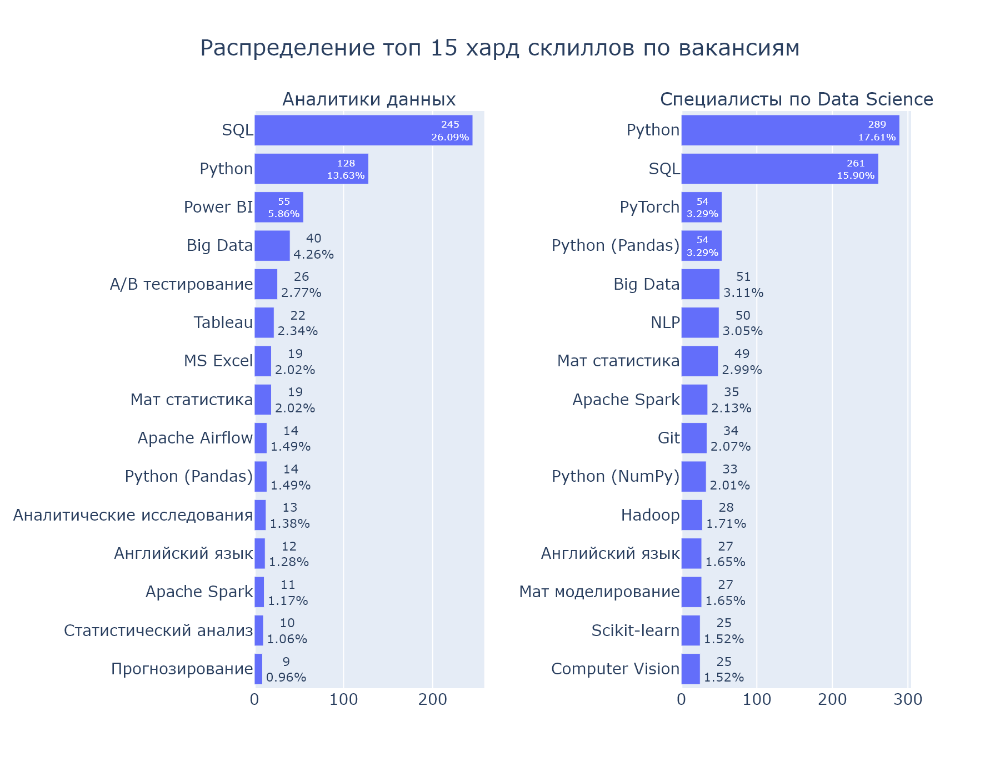

In [147]:
top_hard_skill_da_table['text'] = top_hard_skill_da_table.apply(lambda x: \
                                               f'{x["count_skills"]:.0f}<br>{x["count_skills_percent"]:.2f}%', axis=1)
fig1 = px.bar(top_hard_skill_da_table,
             x='count_skills',
             y='skills',
             text='text',
             orientation='h')
fig1.update_layout(title='Распределение топ 15 хард склилов по вакансиям',
                   title_x=0.5,
                   font_size=13)

top_hard_skill_ds_table['text'] = top_hard_skill_ds_table.apply(lambda x: \
                                               f'{x["count_skills"]:.0f}<br>{x["count_skills_percent"]:.2f}%', axis=1)
fig2 = px.bar(top_hard_skill_ds_table,
             x='count_skills',
             y='skills',
             text='text',
             orientation='h')
fig2.update_layout(title='Распределение топ 15 хард склилов по вакансиям',
                   title_x=0.5,
                   font_size=13)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"),
                    vertical_spacing=1, horizontal_spacing = 0.3)
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(
    width=990,
    height=900,
    title_text="Распределение топ 15 хард склиллов по вакансиям",
    title_x=0.5,
    font_size=14
)

pio.write_image(fig, 'Распределение топ 15 хард склиллов по вакансиям.png', width=900, height=700, scale=2)
Image('Распределение топ 15 хард склиллов по вакансиям.png')

##### Создадим функцию для построения столбчатых диаграмм распределения скиллов по данным сводных таблиц

In [148]:
def make_plot(pivot1, pivot2, horizontal_spacing1, title1):

    pivot1 = pivot1.sort_values('count_skills')
    pivot2 = pivot2.sort_values('count_skills')

    pivot1['text'] = pivot1.apply(lambda x: f'{x["count_skills"]:.0f}<br>{x["count_skills_percent"]:.2f}%', axis=1)
    fig1 = px.bar(pivot1,
             x='count_skills',
             y='skills',
             text='text',
             orientation='h')
    fig1.update_layout(title=title1,
                   title_x=0.5,
                   font_size=13)

    pivot2['text'] = pivot2.apply(lambda x: f'{x["count_skills"]:.0f}<br>{x["count_skills_percent"]:.2f}%', axis=1)
    fig2 = px.bar(pivot2,
             x='count_skills',
             y='skills',
             text='text',
             orientation='h')
    fig2.update_layout(title=title1,
                   title_x=0.5,
                   font_size=13)

    fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"),
                    vertical_spacing=1, horizontal_spacing = horizontal_spacing1)
    fig.add_trace(fig1.data[0], row=1, col=1)
    fig.add_trace(fig2.data[0], row=1, col=2)

    fig.update_layout(
        width=990,
        height=900,
        title_text=title1,
        title_x=0.5,
        font_size=14
    )
    filename = f"{title1}.png"
    pio.write_image(fig, filename, width=900, height=700, scale=2)
    return Image(filename)

##### Построим столбчатую диаграмму распределения топ 10 софт скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_soft_skill_da_table и top_soft_skill_ds_table, используя функцию make_plot

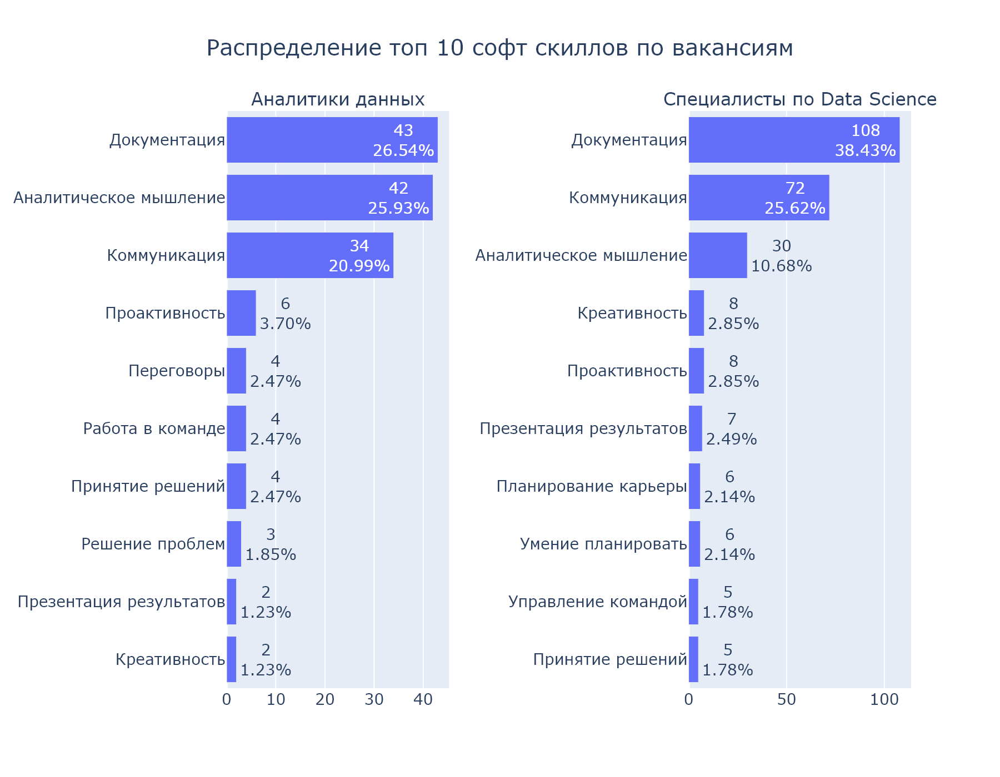

In [149]:
make_plot(top_soft_skills_da_series_table, top_soft_skills_ds_series_table, 0.35, \
          'Распределение топ 10 софт скиллов по вакансиям')

#### Построение столбчатых диаграмм топ 15 хард и топ 10 софт скиллов для аналитиков данных и специалистов по Data Science с разбитием на грейды Junior, Junior+, Middle, Senior

##### Построим столбчатую диаграмму распределения топ 15 хард скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_hard_skills_da_junior_table и top_hard_skills_ds_junior_table для грейда "Junior (no experince)", , используя функцию make_plot

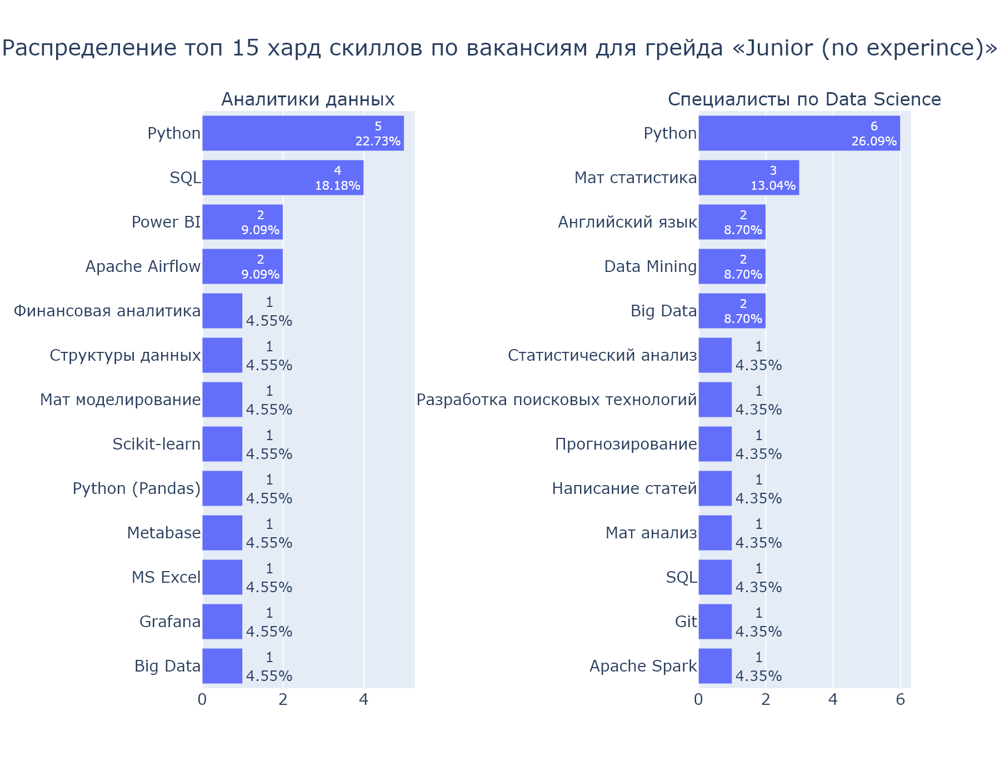

In [150]:
make_plot(top_hard_skills_da_junior_table, top_hard_skills_ds_junior_table, 0.4, \
          'Распределение топ 15 хард скиллов по вакансиям для грейда «Junior (no experince)»')

##### Построим столбчатую диаграмму распределения топ 10 софт скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_soft_skills_da_junior_table и top_soft_skills_ds_junior_table для грейда "Junior (no experince)", , используя функцию make_plot

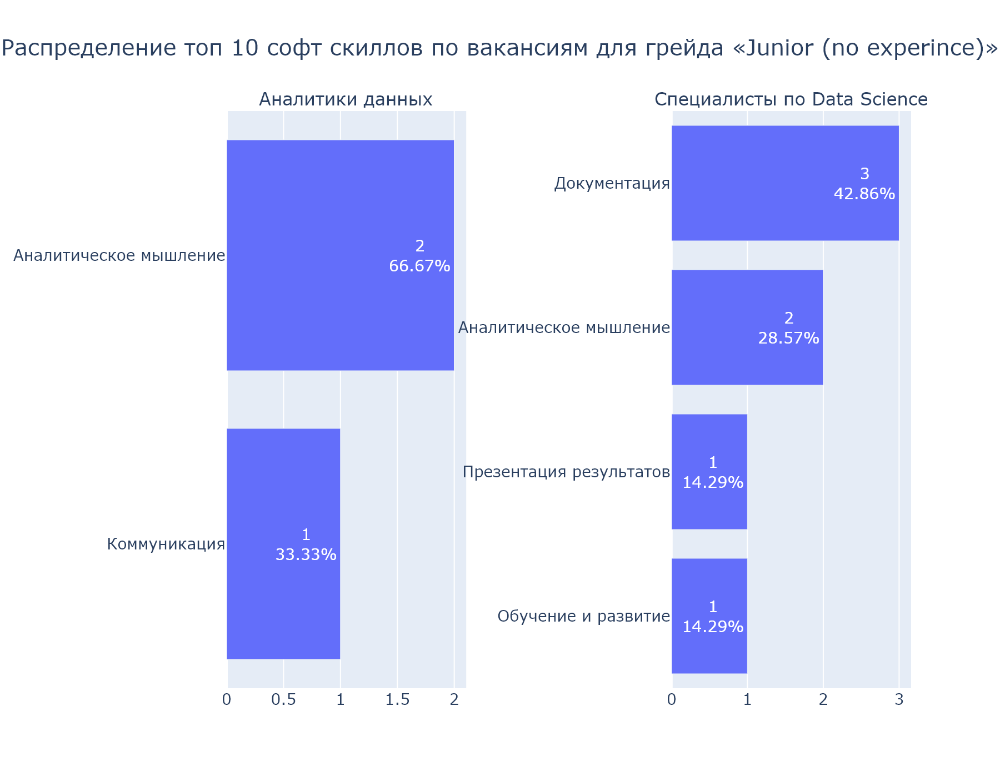

In [151]:
make_plot(top_soft_skills_da_junior_table, top_soft_skills_ds_junior_table, 0.3, \
          'Распределение топ 10 софт скиллов по вакансиям для грейда «Junior (no experince)»')

##### Построим столбчатую диаграмму распределения топ 15 хард скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_hard_skills_da_junior_plus_table и top_hard_skills_ds_junior_plus_table для грейда "Junior+ (1-3 years)", используя функцию make_plot

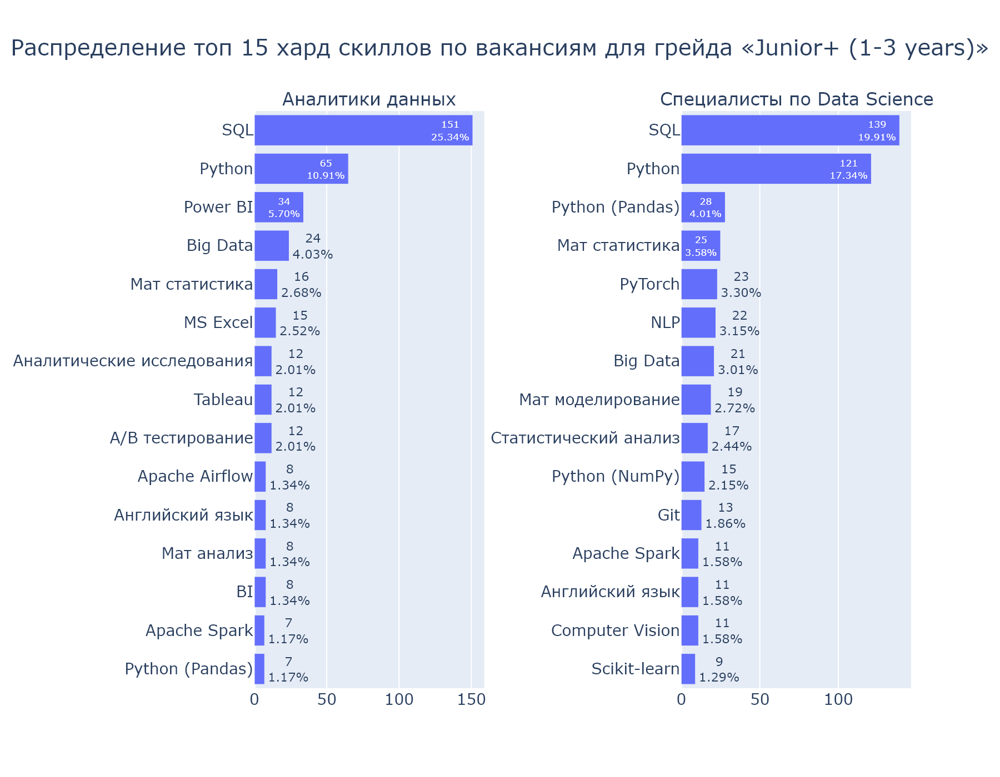

In [152]:
make_plot(top_hard_skills_da_junior_plus_table, top_hard_skills_ds_junior_plus_table, 0.3, \
          'Распределение топ 15 хард скиллов по вакансиям для грейда «Junior+ (1-3 years)»')

##### Построим столбчатую диаграмму распределения топ 10 софт скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_soft_skills_da_junior_plus_table и top_soft_skills_ds_junior_plus_table для грейда "Junior+ (1-3 years)", используя функцию make_plot

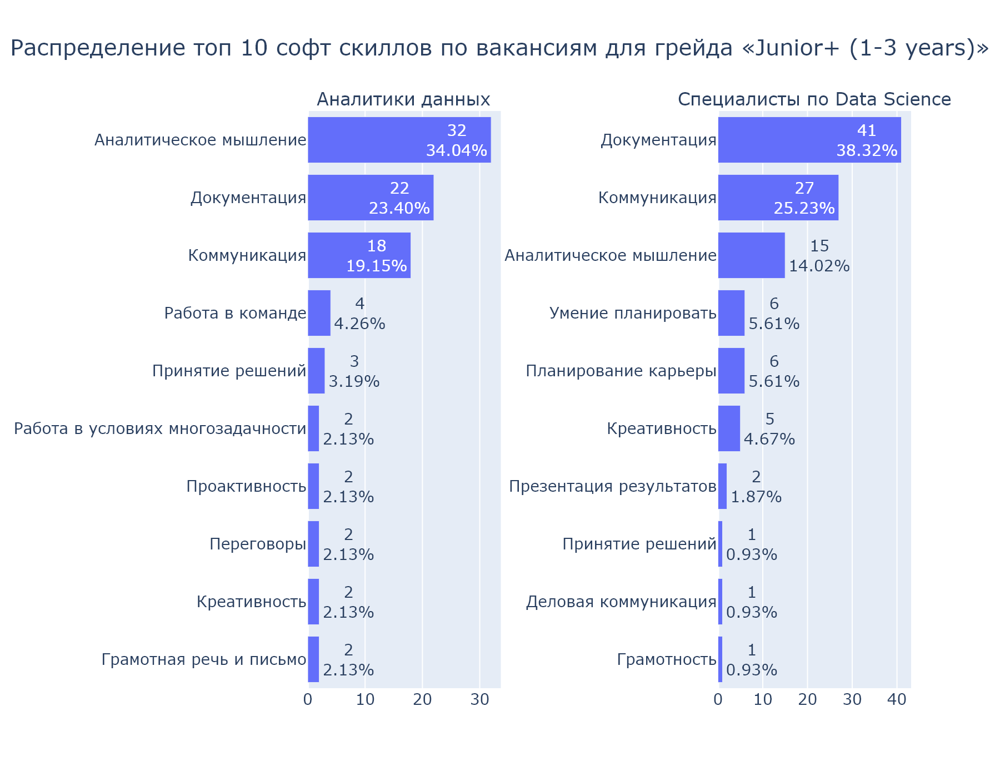

In [153]:
make_plot(top_soft_skills_da_junior_plus_table, top_soft_skills_ds_junior_plus_table, 0.36, \
          'Распределение топ 10 софт скиллов по вакансиям для грейда «Junior+ (1-3 years)»')

##### Построим столбчатую диаграмму распределения топ 15 хард скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_hard_skills_da_middle_table и top_hard_skills_ds_middle_table для грейда "Middle (3-6 years)", используя функцию make_plot

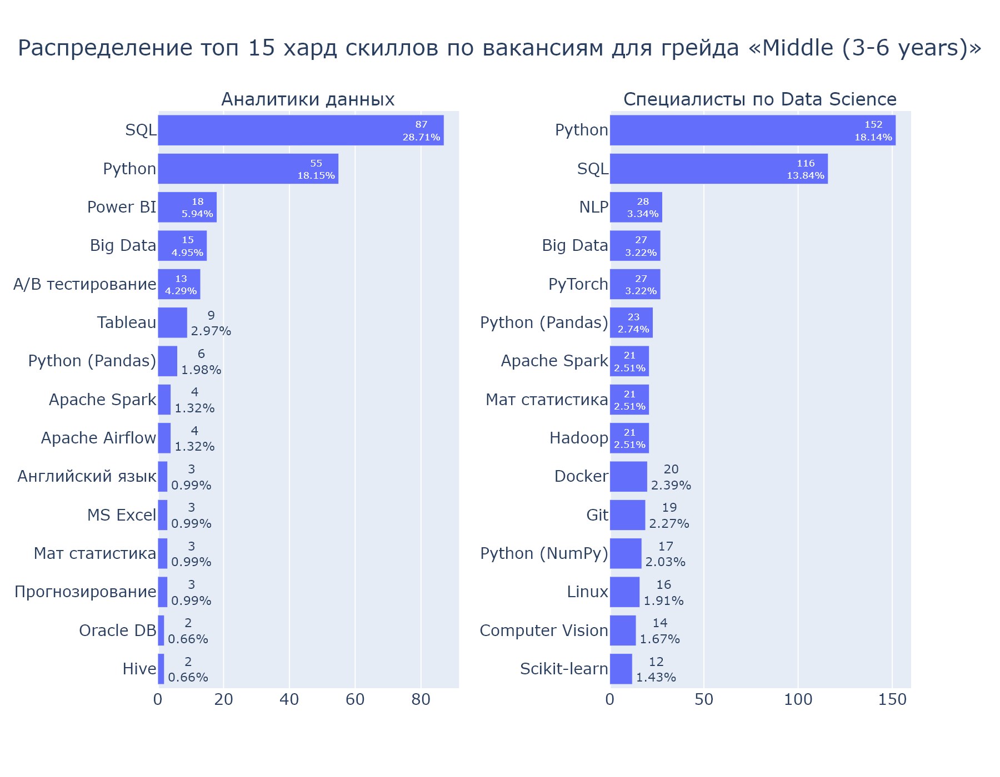

In [154]:
make_plot(top_hard_skills_da_middle_table, top_hard_skills_ds_middle_table, 0.2, \
          'Распределение топ 15 хард скиллов по вакансиям для грейда «Middle (3-6 years)»')

##### Построим столбчатую диаграмму распределения топ 10 софт скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_soft_skills_da_middle_table и top_soft_skills_ds_middle_table для грейда "Middle (3-6 years)", используя функцию make_plot

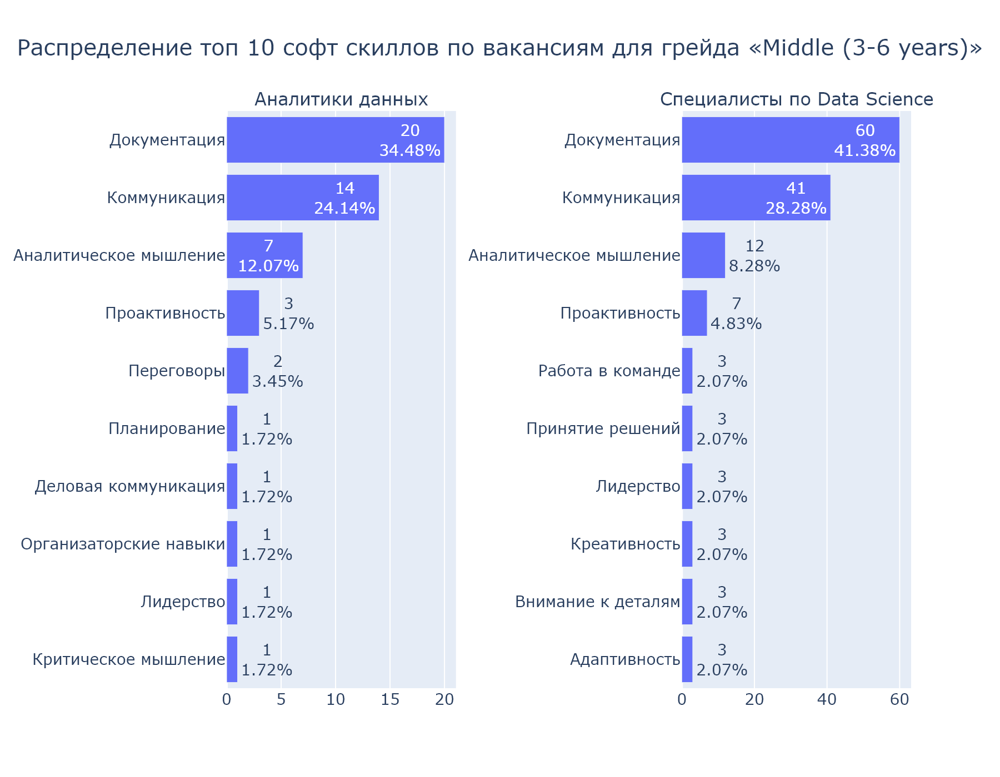

In [155]:
make_plot(top_soft_skills_da_middle_table, top_soft_skills_ds_middle_table, 0.33, \
          'Распределение топ 10 софт скиллов по вакансиям для грейда «Middle (3-6 years)»')

##### Построим столбчатую диаграмму распределения топ 15 хард скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_hard_skills_da_senior_table и top_hard_skills_ds_senior_table для грейда "Senior (6+ years)", используя функцию make_plot

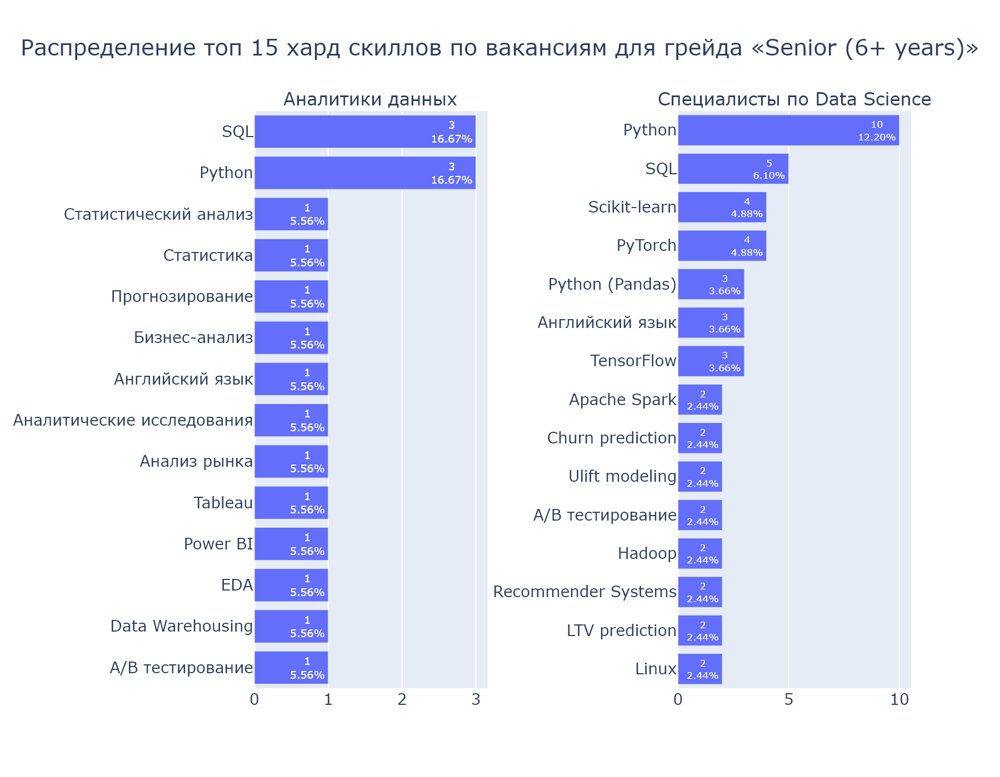

In [156]:
make_plot(top_hard_skills_da_senior_table, top_hard_skills_ds_senior_table, 0.29, \
          'Распределение топ 15 хард скиллов по вакансиям для грейда «Senior (6+ years)»')

##### Построим столбчатую диаграмму распределения топ 10 софт скиллов среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_soft_skills_da_senior_table и top_soft_skills_ds_senior_table для грейда "Senior (6+ years)", используя функцию make_plot

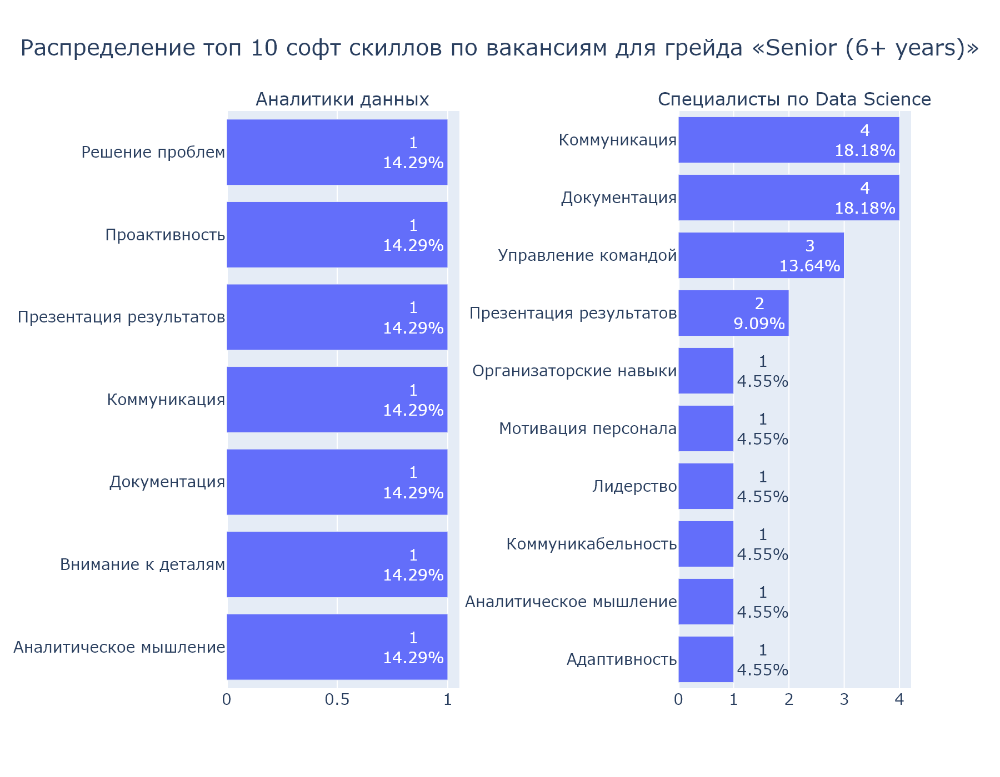

In [157]:
make_plot(top_soft_skills_da_senior_table, top_soft_skills_ds_senior_table, 0.32, \
          'Распределение топ 10 софт скиллов по вакансиям для грейда «Senior (6+ years)»')

#### Выводы по визуализации хард и софт скиллов аналитиков данных и специалистов по Data Science

##### Выводы по хард скиллам аналитиков данных

1. Самым распространенным хард скилами в топ 15 для аналитиков данных является SQL. Далее идут такие хард скилы как Python и его библиотеки как Pandas, знание BI систем, в частности Power BI и Tableau, работа с большим объемом информации, знание A/B тестирования, MS Excel, математическая статистика, Apache Airflow и умение проводить аналитические исследования и статистический анализ данных.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных такой хард скилл как Python находится выше чем SQL. Также появляются такие скиллы как Scikit-learn, финансовая аналитика, структуры данных, математическое моделирование и metabase. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)"  у аналитиков данных в топ 15 также выделяются такие хард скилы как английский язык и математический анализ. При этом роль такого хард скила как MS Excel становится немного выше.
4. В разрезе грейда "Middle (3-6 years)"  у аналитиков данных в топ 15 также выделяются такие хард скиллы как Apache Spark, Apache Airflow.
5. В разрезе грейда "Senior (6+ years)"  у аналитиков данных в топ 15 также выделяются такие хард скиллы как статистический анализ, статистика, прогнозирование, бизнес-анализ, исследовательский анализ данных, Data Warehousing, анализ рынка и прогнозирование. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Выводы по хард скиллам специалистов по Data Science.

1. Самым распространенными хард скилами в топ 15 для специалистов по Data Science является Python и его библиотеки, такие как Pandas и Numpy, SQL, PyTorch, работа с большим объемом информации, обработка естественного языка или NLP, математическая статистика, Apache Spark, работа c Git, Hadoop, знание английского языка, математическое моделирование, компьютерное зрение и знание библиотеки scikit-learn для машинного обучения.
2. В разрезе грейда "Junior (no experince)" у специалистов по Data Science также выделяются такие хард скиллы как Data Mining, разработка поисковых технологий, прогнозирование и написание статей.
3. В разрезе грейда "Junior+ (1-3 years)"  у специалистов по Data Science топ 15 хард скиллов являются почти такими же как и в общем списке с небольшим изменение по ранжированию и отсутствию в топе такого скилла как Hadoop.
4. В разрезе грейда "Middle (3-6 years)"  у специалистов по Data Science в топ 15 также выделяются такие хард скиллы как Docker и Linux.
5. В разрезе грейда "Senior (6+ years)"  у специалистов по Data Science в топ 15 также выделяются такие хард скиллы как TensorFlow, A/B тестирование, Recommender Systems, Ulift modeling, Churn prediction и LTV prediction.

##### Выводы по софт скиллам аналитиков данных

1. Самым распространенными софт скилами в топ 10 для аналитиков является документация, аналитическое мышление, коммуникация, проактивность,  переговоры, работа в команде, принятие решений, решение проблем, презентация результатов и креативность.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных софт скиллы совпадают с основным списком. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)"  у аналитиков данных в топ 10 также выделяются такие софт скилы как работа в условиях многозадачности и грамотная речь и письмо.
4. В разрезе грейда "Middle (3-6 years)"  у аналитиков данных в топ 10 также выделяются такие софт скиллы как планирование, деловая коммуникация, организаторские навыки, лидерство и критическое мышление.
5. В разрезе грейда "Senior (6+ years)"  у аналитиков данных в топ 10 также выделяется такой софт скилл как внимание к деталям. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Выводы по софт скиллам специалистов по Data Science

1. Самым распространенными софт скилами в топ 10 для специалистов по Data Science является документация, коммуникация, аналитическое мышление, креативность, проактивность презентация результатов, планирование карьеры, умение планировать, управление командой и принятие решений.
2. В разрезе грейда "Junior (no experince)" для специалистов по Data Science также выделяется такой софт скилл как обучение и развитие.
3. В разрезе грейда "Junior+ (1-3 years)" для специалистов по Data Science в топ 10 также выделяются такие софт скилы как деловая коммуникация и грамотность.
4. В разрезе грейда "Middle (3-6 years)" для специалистов по Data Science в топ 10 также выделяются такие софт скиллы как работа в команде, принятие решений, лидерство, внимание к деталям и адаптивность.
5. В разрезе грейда "Senior (6+ years)" для специалистов по Data Science в топ 10 также выделяются такие софт скиллы как организаторские навыки, мотивация персонала и коммуникабельность.

### Определение типичного места работы для вакансий аналитик данных и специалист по Data Science

#### Определение ТОП-работодателей для вакансий аналитик данных

##### Построим сводную таблицу методом crosstab() со следующими столбцами:
    employer - название компании;
    count_employers - количество компаний по названию в датафрейме;
    count_skills_percent - количество компаний по названию в процентах от общего.

In [158]:
data_crosstab_employer = pd.crosstab(index=vacancies_da['employer'], columns=['count_employers']).reset_index()
data_crosstab_employer.columns = ['employer', 'count_employers']
data_crosstab_employer['count_employers_percent'] = round((data_crosstab_employer['count_employers'] /\
                                                           data_crosstab_employer['count_employers'].sum()) * 100, 2)
data_crosstab_employer = data_crosstab_employer.sort_values(by = 'count_employers', ascending=False).reset_index(drop=True)
data_crosstab_employer.head(10)

,employer,count_employers,count_employers_percent
0,СБЕР,64,21.84
1,WILDBERRIES,14,4.78
2,МТС,7,2.39
3,"МАГНИТ, Розничная сеть",6,2.05
4,Okko,6,2.05
5,ПСБ (ПАО «Промсвязьбанк»),5,1.71
6,«UZUM TECHNOLOGIES».,5,1.71
7,StudyWorld,4,1.37
8,Maxim technology,4,1.37
9,Звук,3,1.02


##### Напишем функцию, которая будет строить данную сводную таблицу в зависимости от изучаемого датафрейма

In [159]:
def make_pivot_employer(dataset):
    data_crosstab_employer = pd.crosstab(index=dataset['employer'], columns=['count_employers']).reset_index()
    data_crosstab_employer.columns = ['employer', 'count_employers']
    data_crosstab_employer['count_employers_percent'] = round((data_crosstab_employer['count_employers'] /\
                                                           data_crosstab_employer['count_employers'].sum()) * 100, 2)
    data_crosstab_employer = data_crosstab_employer.sort_values(by = 'count_employers', ascending=False).reset_index(drop=\
                                                                                                                     True)
    return data_crosstab_employer

##### Создадим переменную employer_da_table и присвоим ей результат функции make_pivot_employer

In [160]:
employer_da_table = make_pivot_employer(vacancies_da)
top_employer_da_table = employer_da_table.head(10)

##### Создадим отфильтрованный датарфейм employer_da_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [161]:
employer_da_junior = vacancies_da.query('experience == "Junior (no experince)"').reset_index(drop=True)
employer_da_junior.head().T

,0,1,2,3,4
id,92070271,92361982,92803313,95909533,96508339
name,Младший аналитик данных (Junior Data Analyst),Junior Data Analyst,Data analyst (Junior),Data Analyst,Data Analyst / Аналитик данных
published_at,2024-03-18 22:41:00,2024-03-29 17:17:56,2024-04-27 03:24:53,2024-04-01 16:54:03,2024-04-30 11:25:47
alternate_url,https://hh.ru/vacancy/92070271,https://hh.ru/vacancy/92361982,https://hh.ru/vacancy/92803313,https://hh.ru/vacancy/95909533,https://hh.ru/vacancy/96508339
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,СБЕР,"РЕСО-Гарантия, САО",DNS Технологии,ANCOR,Альфа Капитал
department,Сбер для экспертов,"РЕСО-Гарантия, САО, IT",NaN,NaN,NaN
area,Москва,Москва,Владивосток,Москва,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,[],['Аналитическое мышление'],"['Pandas', 'Metabase', 'Python', 'Финансовая а...",[],"['Pandas', 'PowerBI', 'apache airflow', 'junio..."


##### Создадим переменную employer_da_junior_table и присвоим ей результат выполнения функции make_pivot_employer

In [162]:
employer_da_junior_table = make_pivot_employer(employer_da_junior)
top_employer_da_junior_table = employer_da_junior_table.head(10)

##### Создадим отфильтрованный датарфейм employer_da_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [163]:
employer_da_junior_plus = vacancies_da.query('experience == "Junior+ (1-3 years)"').reset_index(drop=True)
employer_da_junior_plus.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,88605313,89426458
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data Analyst,Ведущий дата аналитик
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-03-12 21:40:27,2024-04-22 14:12:37
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89426458
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),Бланк – банк для бизнеса,RUTUBE
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Москва
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...","['Google Analytics', 'Анализ данных', 'Tableau..."


##### Создадим переменную employer_da_junior_plus_table и присвоим ей результат выполнения функции make_pivot_employer

In [164]:
employer_da_junior_plus_table = make_pivot_employer(employer_da_junior_plus)
top_employer_da_junior_plus_table = employer_da_junior_plus_table.head(10)

##### Создадим отфильтрованный датарфейм employer_da_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [165]:
employer_da_middle = vacancies_da.query('experience == "Middle (3-6 years)"').reset_index(drop=True)
employer_da_middle.head().T

,0,1,2,3,4
id,86081569,87407185,89163933,90430340,90495132
name,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth""",Data Analyst WMS,Senior Data analyst,Data analyst
published_at,2024-04-27 23:34:50,2024-04-02 17:03:10,2024-04-02 17:52:09,2024-04-30 10:50:09,2024-04-06 08:44:30
alternate_url,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/90430340,https://hh.ru/vacancy/90495132
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,IQnergy,Okko,«UZUM TECHNOLOGIES».,Ок Софт,МедиаСофт
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Санкт-Петербург,Москва,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']",[],"['Решение проблем', 'Юнит-экономика', 'Приняти...","['Pandas', 'Data Analysis', 'Spark', 'Python',..."


##### Создадим переменную employer_da_middle_table и присвоим ей результат выполнения функции make_pivot_employer

In [166]:
employer_da_middle_table = make_pivot_employer(employer_da_middle)
top_employer_da_middle_table = employer_da_middle_table.head(10)

##### Создадим отфильтрованный датарфейм employer_da_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [167]:
employer_da_senior = vacancies_da.query('experience == "Senior (6+ years)"').reset_index(drop=True)
employer_da_senior.head().T

,0,1,2
id,97432876,97432884,98138306
name,Middle+/Senior Data Analyst в Data Accelerator,Product Data analyst (управление товарными пот...,Data Analyst
published_at,2024-04-28 14:08:20,2024-04-28 14:08:26,2024-04-29 16:17:24
alternate_url,https://hh.ru/vacancy/97432876,https://hh.ru/vacancy/97432884,https://hh.ru/vacancy/98138306
type,Открытая,Открытая,Открытая
employer,Леруа Мерлен,Леруа Мерлен,Reinvent Baltics
department,Леруа Мерлен. Центральный офис,ИТ,NaN
area,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Pandas', 'Документация', 'confluence', 'Pyth...","['Проактивность', 'SQL', 'Python', 'Аналитичес...","['Английский язык', 'Data Analysis', 'Решение ..."


##### Создадим переменную employer_da_senior_table и присвоим ей результат выполнения функции make_pivot_employer

In [168]:
employer_da_senior_table = make_pivot_employer(employer_da_senior)
top_employer_da_senior_table = employer_da_senior_table.head(10)

#### Определение ТОП-работодателей для вакансий специалист по Data Science

##### Создадим переменную employer_ds_table и присвоим ей результат функции make_pivot_employer

In [169]:
employer_ds_table = make_pivot_employer(vacancies_ds)
top_employer_ds_table = employer_ds_table.head(10)

##### Создадим отфильтрованный датарфейм employer_ds_junior куда войдут вакансии с грейдом "Junior (no experince)"

In [170]:
employer_ds_junior = vacancies_ds.query('experience == "Junior (no experince)"').reset_index(drop=True)
employer_ds_junior.head().T

,0,1,2,3,4
id,91583978,94232482,94502217,94620284,94710567
name,Assistant Professor - Data Science&AI (english),Стажер Data scientist,Стажер Data Scientist (MTS AI),Data Science специалист,Data Scientist NLP
published_at,2024-04-13 11:14:10,2024-03-04 21:40:15,2024-03-11 10:26:00,2024-03-31 16:05:21,2024-03-13 17:49:04
alternate_url,https://hh.ru/vacancy/91583978,https://hh.ru/vacancy/94232482,https://hh.ru/vacancy/94502217,https://hh.ru/vacancy/94620284,https://hh.ru/vacancy/94710567
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,СБЕР,МТС,СБЕР,СБЕР
department,NaN,Сбер. IT,«МТС»,Сбер. IT,Сбер для экспертов
area,Казань,Москва,Москва,Воронеж,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['SQL', 'Python']",[],[],"['Pandas', 'Документация', 'confluence']"


##### Создадим переменную employer_ds_junior_table и присвоим ей результат выполнения функции make_pivot_employer

In [171]:
employer_ds_junior_table = make_pivot_employer(employer_ds_junior)
top_employer_ds_junior_table = employer_ds_junior_table.head(10)

##### Создадим отфильтрованный датарфейм employer_ds_junior_plus куда войдут вакансии с грейдом "Junior+ (1-3 years)"

In [172]:
employer_ds_junior_plus = vacancies_ds.query('experience == "Junior+ (1-3 years)"').reset_index(drop=True)
employer_ds_junior_plus.head().T

,0,1,2,3,4
id,81857296,81857358,86018279,87192229,87400111
name,Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Middle \ Senior Data Scientist в команду модел...,Middle \ Senior Data scientist (команды CRM и ...,Data Scientist
published_at,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-23 17:15:40,2024-04-15 12:05:32,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358,https://hh.ru/vacancy/86018279,https://hh.ru/vacancy/87192229,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,Университет Иннополис,Банк ВТБ (ПАО),Банк ВТБ (ПАО),Совкомбанк
department,NaN,NaN,"ПАО ВТБ, Технологический блок","ПАО ВТБ, Технологический блок",NaN
area,Москва,Санкт-Петербург,Москва,Москва,Казань
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе...","['Документация', 'R', 'Python', 'Креативность'...","['Документация', 'Spark', 'confluence', 'Pytho...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


##### Создадим переменную employer_ds_junior_plus_table и присвоим ей результат выполнения функции make_pivot_employer

In [173]:
employer_ds_junior_plus_table = make_pivot_employer(employer_ds_junior_plus)
top_employer_ds_junior_plus_table = employer_ds_junior_plus_table.head(10)

##### Создадим отфильтрованный датарфейм employer_ds_middle куда войдут вакансии с грейдом "Middle (3-6 years)"

In [174]:
employer_ds_middle = vacancies_ds.query('experience == "Middle (3-6 years)"').reset_index(drop=True)
employer_ds_middle.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,83575438,86879304
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data scientist (команда Collection)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-04-23 17:15:53
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/86879304
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Профи (profi.ru),Банк ВТБ (ПАО)
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,"ПАО ВТБ, Технологический блок"
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Документация', 'Python', 'Big Data', 'ML', '..."


##### Создадим переменную employer_ds_middle_table и присвоим ей результат выполнения функции make_pivot_employer

In [175]:
employer_ds_middle_table = make_pivot_employer(employer_ds_middle)
top_employer_ds_middle_table = employer_ds_middle_table.head(10)

##### Создадим отфильтрованный датарфейм employer_ds_senior куда войдут вакансии с грейдом "Senior (6+ years)"

In [176]:
employer_ds_senior = vacancies_ds.query('experience == "Senior (6+ years)"').reset_index(drop=True)
employer_ds_senior.head().T

,0,1,2,3,4
id,90637679,91757000,94041966,94697153,94706965
name,Senior Data Scientist/Team Lead,Data scientist CV (senior),Python разработчик Data Science,Senior Data Scientist,Senior Data Scientist
published_at,2024-03-06 11:16:51,2024-03-21 10:27:39,2024-02-29 15:01:35,2024-04-10 08:49:52,2024-03-13 17:26:05
alternate_url,https://hh.ru/vacancy/90637679,https://hh.ru/vacancy/91757000,https://hh.ru/vacancy/94041966,https://hh.ru/vacancy/94697153,https://hh.ru/vacancy/94706965
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Гудфокаст,"РУСАЛ, Центр подбора персонала",Appfox,СБЕР,СБЕР
department,NaN,NaN,NaN,Сбер. IT,Сбер для экспертов
area,Москва,Москва,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Machine Learning', 'Linux', 'Python', 'Машин...","['OCR', 'Data Science', 'OpenCV']",[],"['Английский язык', 'C++', 'Linux', 'Python', ...",[]


##### Создадим переменную employer_ds_senior_table и присвоим ей результат выполнения функции make_pivot_employer

In [177]:
employer_ds_senior_table = make_pivot_employer(employer_ds_senior)
top_employer_ds_senior_table = employer_ds_senior_table.head(10)

### Визуализация типичного места работы для вакансий аналитик данных и специалист по Data Science

#### Визуализация ТОП-работодателей для вакансий аналитик данных и специалист по Data Science

##### Создадим функцию для построения столбчатых диаграмм определения ТОП-работодателей по данным сводных таблиц

In [178]:
def make_plot_employer(pivot1, pivot2, horizontal_spacing1, title1):

    pivot1 = pivot1.sort_values('count_employers')
    pivot2 = pivot2.sort_values('count_employers')

    pivot1['text'] = pivot1.apply(lambda x: f'{x["count_employers"]:.0f}<br>{x["count_employers_percent"]:.2f}%', axis=1)
    fig1 = px.bar(pivot1,
             x='count_employers',
             y='employer',
             text='text',
             orientation='h')
    fig1.update_layout(title=title1,
                   title_x=0.5,
                   font_size=13)

    pivot2['text'] = pivot2.apply(lambda x: f'{x["count_employers"]:.0f}<br>{x["count_employers_percent"]:.2f}%', axis=1)
    fig2 = px.bar(pivot2,
             x='count_employers',
             y='employer',
             text='text',
             orientation='h')
    fig2.update_layout(title=title1,
                   title_x=0.5,
                   font_size=13)

    fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"),
                    vertical_spacing=1, horizontal_spacing = horizontal_spacing1)
    fig.add_trace(fig1.data[0], row=1, col=1)
    fig.add_trace(fig2.data[0], row=1, col=2)

    fig.update_layout(
        width=990,
        height=700,
        title_text=title1,
        title_x=0.5,
        font_size=13.5
    )

    filename = f"{title1}.png"
    pio.write_image(fig, filename, width=900, height=700, scale=2)
    return Image(filename)

##### Построим столбчатую диаграмму распределения ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_employer_da_table и top_employer_ds_table

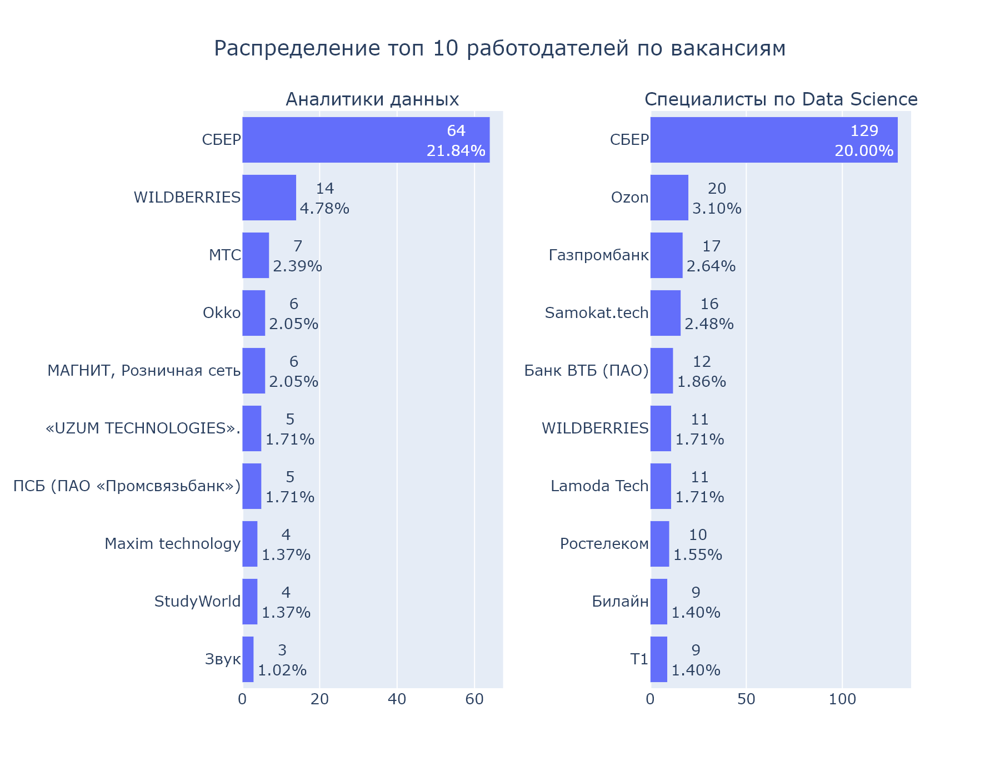

In [179]:
make_plot_employer(top_employer_da_table, top_employer_ds_table, 0.22, 'Распределение топ 10 работодателей по вакансиям')

#### Визуализация ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science c разбивкой на грейды Junior (no experince), Junior+ (1-3 years), Middle (3-6 years), Senior (6+ years)

##### Построим столбчатую диаграмму распределения ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_employer_da_junior_table и top_employer_ds_junior_table для грейда "Junior (no experince)", используя функцию make_plot_employer

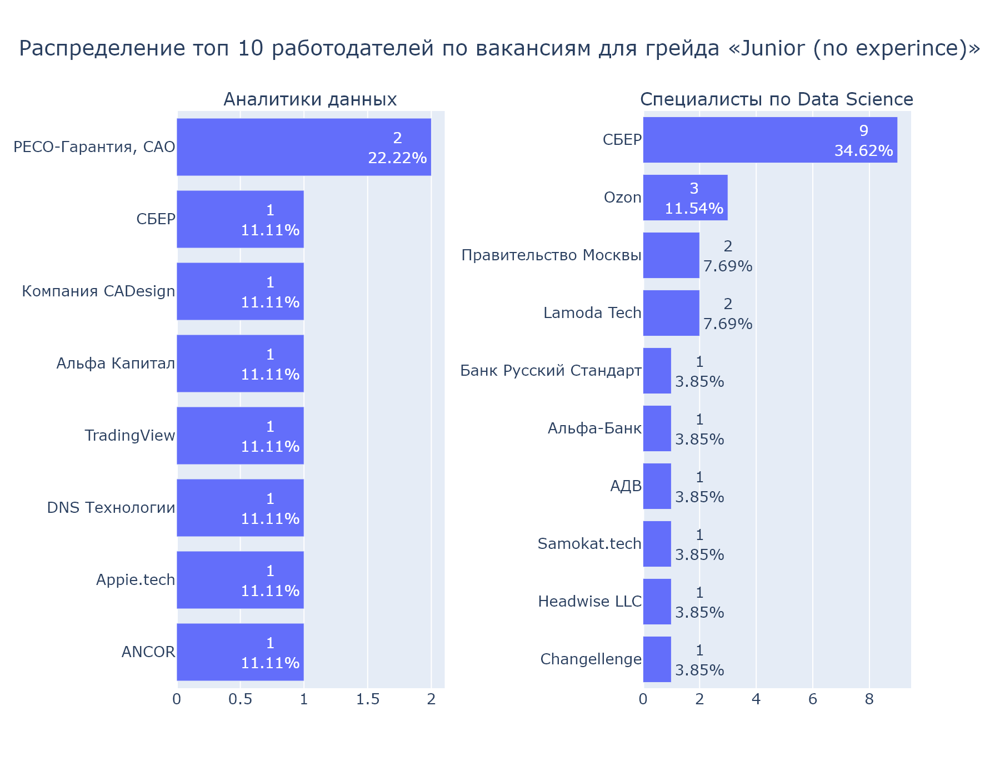

In [180]:
make_plot_employer(top_employer_da_junior_table, top_employer_ds_junior_table, 0.27, \
                   'Распределение топ 10 работодателей по вакансиям для грейда «Junior (no experince)»')

##### Построим столбчатую диаграмму распределения ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_employer_da_junior_plus_table и top_employer_ds_junior_plus_table для грейда "Junior+ (1-3 years)", используя функцию make_plot_employer

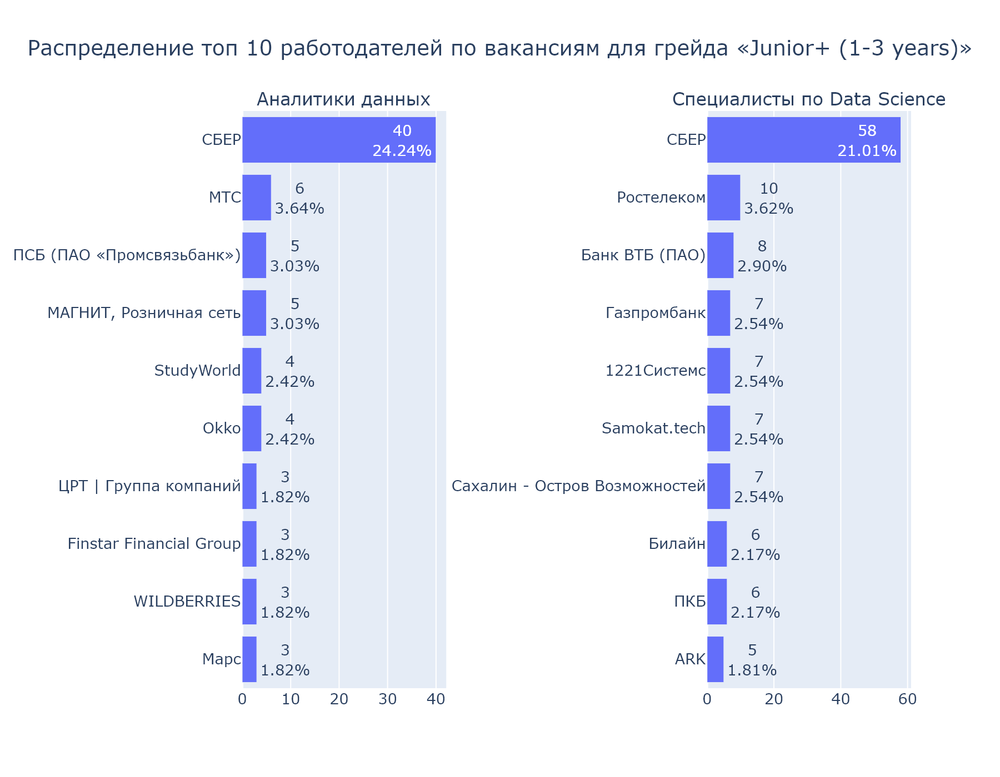

In [181]:
make_plot_employer(top_employer_da_junior_plus_table, top_employer_ds_junior_plus_table, 0.39, \
                   'Распределение топ 10 работодателей по вакансиям для грейда «Junior+ (1-3 years)»')

##### Построим столбчатую диаграмму распределения ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_employer_da_middle_table и top_employer_ds_middle_table для грейда "Middle (3-6 years)", используя функцию make_plot_employer

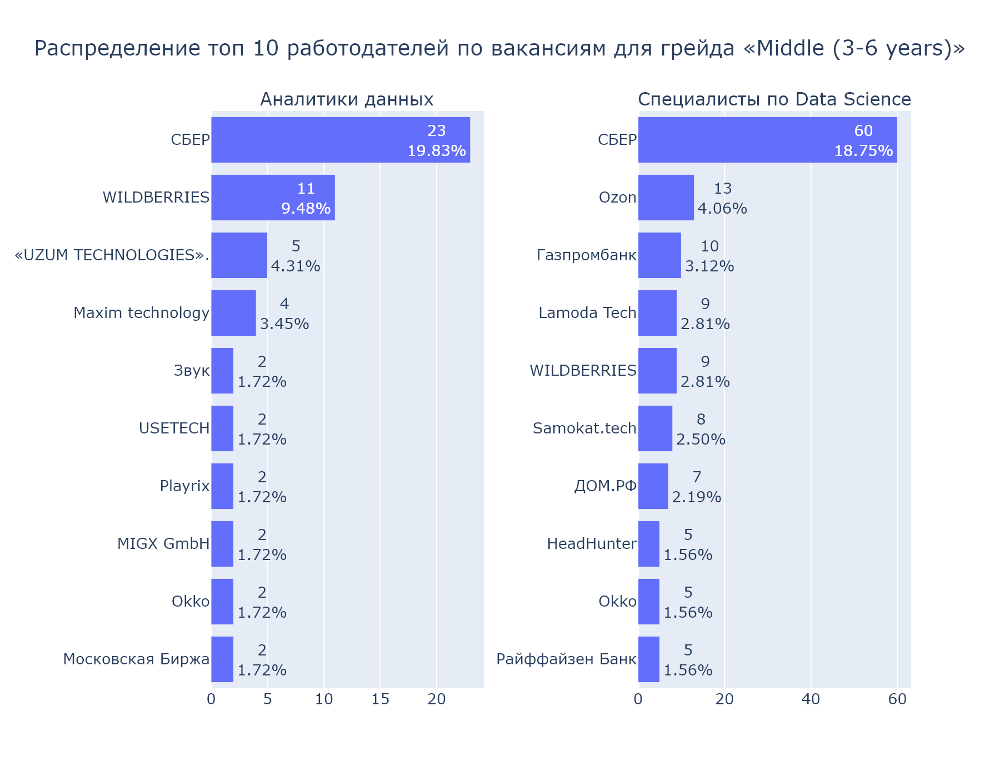

In [182]:
make_plot_employer(top_employer_da_middle_table, top_employer_ds_middle_table, 0.22, \
                   'Распределение топ 10 работодателей по вакансиям для грейда «Middle (3-6 years)»')

##### Построим столбчатую диаграмму распределения ТОП 10 работодателей для вакансий аналитик данных и специалист по Data Science по данным сводных таблиц top_employer_da_senior_table и top_employer_ds_senior_table для грейда "Senior (6+ years)", используя функцию make_plot_employer

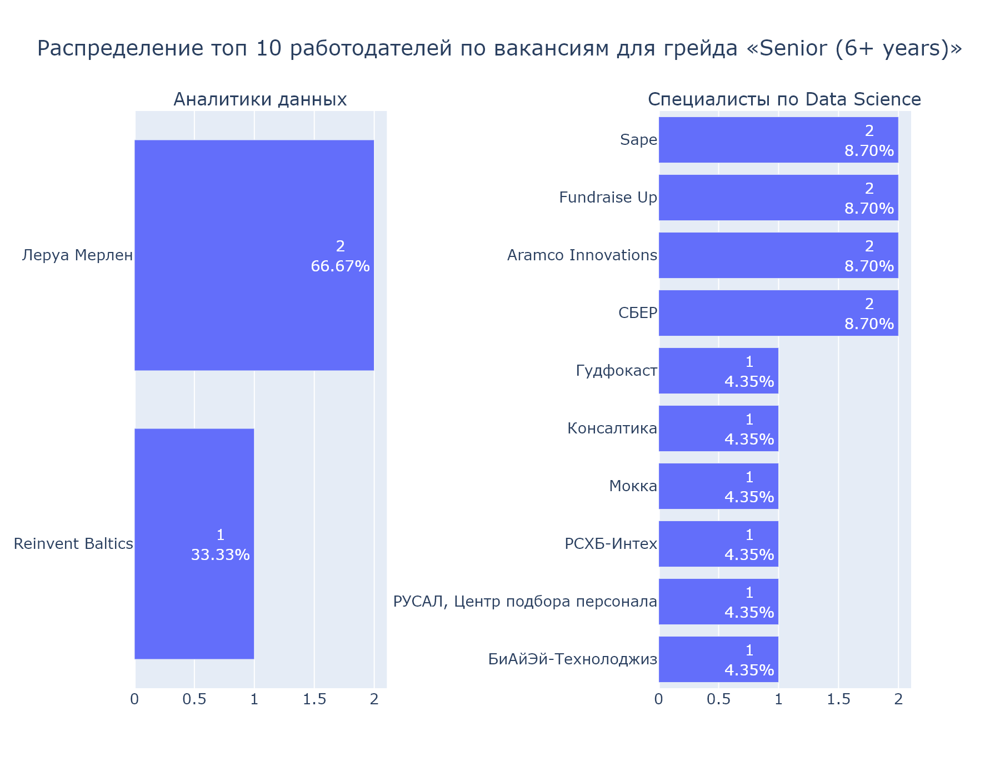

In [183]:
make_plot_employer(top_employer_da_senior_table, top_employer_ds_senior_table, 0.35, \
                   'Распределение топ 10 работодателей по вакансиям для грейда «Senior (6+ years)»')

#### Выводы по типичному месту работы для вакансий аналитик данных и специалист по Data Science

##### Выводы по типичному месту работы для вакансий аналитик данных

1. Типичным местом работы аналитиков данных является Сбербанк. Представлено 64 вакансии или 21,84%. Также выделяются такие работодатели как WILDBERRIES, МТС, МАГНИТ, Розничная сеть и Okko. Доля остальных работодателей составляет менее 2%.
2. В разрезе грейда "Junior (no experince)" типичным местом работы аналитиков данных является Ресо – Гарантия. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)" типичным местом для аналитиков данных также является Сбербанк – 40 вакансий или 24,24 % от вакансий этого грейда. Также выделяются такие работодатели как МТС, МАГНИТ - Розничная сеть, ПСБ (ПАО «Промсвязьбанк»), Okko и StudyWorld. Доля остальных работодателей составляет менее 2%.
4. В разрезе грейда "Middle (3-6 years)" типичным местом для аналитиков данных также является Сбербанк – 23 вакансии или 19,83% от вакансий этого грейда. Также выделяются такие работодатели как WILDBERRIES, «UZUM TECHNOLOGIES» и Maxim technology. Доля остальных работодателей составляет менее 2%.
5. В разрезе грейда "Senior (6+ years)" типичным местом работы аналитиков данных является Леруа Мерлен. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Выводы по типичному месту работы для вакансий специалист по Data Science

1. Типичным местом работы специалистов по Data Science является Сбербанк. Представлено 129 вакансии или 20%. Также выделяются такие работодатели как Ozon, Газпромбанк и Samokat.tech. Доля остальных работодателей составляет менее 2%.
2. В разрезе грейда "Junior (no experince)" типичным местом работы для специалистов по Data Science является Сбербанк 9 вакансий или 34,62%. Также выделяются такие работодатели как Ozon, правительство Москвы и Lamoda Tech. Остальные работодатели представлены по одной вакансии.
3. В разрезе грейда "Junior+ (1-3 years)" типичным местом для специалистов по Data Science также является Сбербанк – 58 вакансий или 21,01 % от вакансий этого грейда. Также выделяются такие работодатели как Ростелеком и Банк ВТБ. Доля остальных работодателей составляет менее 3%.
4. В разрезе грейда "Middle (3-6 years)" типичным местом для специалистов по Data Science также является Сбербанк – 60 вакансии или 18,75% от вакансий этого грейда. Также выделяются такие работодатели как Ozon и Газпромбанк. Доля остальных работодателей составляет менее 3%.
5. В разрезе грейда "Senior (6+ years)" типичным местом работы для специалистов по Data Science является Сбербанк наравне с Aramco Innovations, Fundraise Up и Sape – 2 вакансии или 8,7%. Доля остальных вакансий составляет менее 5 % по одной вакансии.

### Анализ зарплат в вакансиях аналитик данных и специалист по Data Science

#### Построим сводную таблицу методом crosstab() со следующими столбцами:
    salary_bin - категория зарплаты;
    count_salary - количество вакансий аналитиков данных в категории;
    count_salary_percent - количество вакансий аналитиков данных в категории в процентах от общего.

In [184]:
crosstab_salary_bin_da = pd.crosstab(index=vacancies_da['salary_bin'] , columns=['count_salary']).reset_index()
crosstab_salary_bin_da.columns = ['salary_bin', 'count_salary']
crosstab_salary_bin_da['count_salary_percent'] = round((crosstab_salary_bin_da['count_salary'] /\
                                                              crosstab_salary_bin_da['count_salary'].sum()) * 100, 2)
crosstab_salary_bin_da = crosstab_salary_bin_da.sort_values(by = 'count_salary', ascending=False).reset_index(drop=True)
crosstab_salary_bin_da

,salary_bin,count_salary,count_salary_percent
0,ЗП не указана,270,92.15
1,От 200 тысяч до 300 тысяч,10,3.41
2,Больше 300 тысяч,6,2.05
3,От 100 тысяч до 200 тысяч,6,2.05
4,Меньше 100 тысяч,1,0.34


#### Создадим функцию, которая будет строить данную сводную таблицу в зависимости от изучаемого датафрейма

In [185]:
def make_pivot_salary(dataset1):

    crosstab_salary_bin_da = pd.crosstab(index=dataset1['salary_bin'] , columns=['count_salary']).reset_index()
    crosstab_salary_bin_da.columns = ['salary_bin', 'count_salary']
    crosstab_salary_bin_da['count_salary_percent'] = round((crosstab_salary_bin_da['count_salary'] /\
                                                              crosstab_salary_bin_da['count_salary'].sum()) * 100, 2)
    crosstab_salary_bin_da = crosstab_salary_bin_da.sort_values(by = 'count_salary', ascending=False).reset_index(drop=\
                                                                                                                  True)
    return crosstab_salary_bin_da

#### Создадим переменную salary_bin_da_table и присвоим ей результат выполнения функции make_pivot_salary для оценки категорий зарплат аналитиков данных

In [186]:
salary_bin_da_table = make_pivot_salary(vacancies_da)

#### Создадим переменную salary_bin_ds_table и присвоим ей результат выполнения функции make_pivot_salary для оценки категорий зарплат специалистов по Data Science

In [187]:
salary_bin_ds_table = make_pivot_salary(vacancies_ds)

#### Создадим переменную salary_bin_da_junior_table и присвоим ей результат выполнения функции make_pivot_salary для оценки категорий зарплат аналитиков данных в грейде "Junior (no experince)"

In [188]:
salary_bin_da_junior_table = make_pivot_salary(employer_da_junior)

#### Создадим переменную salary_bin_ds_junior_table и присвоим ей результат выполнения функции make_pivot_salary для оценки категорий зарплат специалистов по Data Science в грейде"Junior (no experince)"

In [189]:
salary_bin_ds_junior_table = make_pivot_salary(employer_ds_junior)

#### Создадим переменную salary_bin_da_junior_plus_table и присвоим ей результат выполнения функции make_pivot_salary для оценки категорий зарплат аналитиков данных в грейде "Junior+ (1-3 years)"

In [190]:
salary_bin_da_junior_plus_table = make_pivot_salary(employer_da_junior_plus)

#### Создадим переменную salary_bin_ds_junior_plus_table и присвоим ей результат выполнения функции make_pivot_salary для оценки распределения категорий зарплат специалистов по Data Science для грейда "Junior+ (1-3 years)"

In [191]:
salary_bin_ds_junior_plus_table = make_pivot_salary(employer_ds_junior_plus)

#### Создадим переменную salary_bin_da_middle_table и присвоим ей результат выполнения функции make_pivot_salary для оценки распределения категорий зарплат аналитиков данных для грейда "Middle (3-6 years)"

In [192]:
salary_bin_da_middle_table = make_pivot_salary(employer_da_middle)

#### Создадим переменную salary_bin_ds_middle_table и присвоим ей результат выполнения функции make_pivot_salary для оценки распределения категорий зарплат специалистов по Data Science для грейда "Middle (3-6 years)"

In [193]:
salary_bin_ds_middle_table = make_pivot_salary(employer_ds_middle)

#### Создадим переменную salary_bin_da_senior_table и присвоим ей результат выполнения функции make_pivot_salary для оценки распределения категорий зарплат аналитиков данных для грейда "Senior (6+ years)"

In [194]:
salary_bin_da_senior_table = make_pivot_salary(employer_da_senior)

#### Создадим переменную salary_bin_ds_senior_table и присвоим ей результат выполнения функции make_pivot_salary для оценки распределения категорий зарплат специалистов по Data Science для грейда "Senior (6+ years)"

In [195]:
salary_bin_ds_senior_table = make_pivot_salary(employer_ds_senior)

#### Построим столбчатую диаграмму категорий зарплат среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц salary_bin_da_table и salary_bin_ds_table

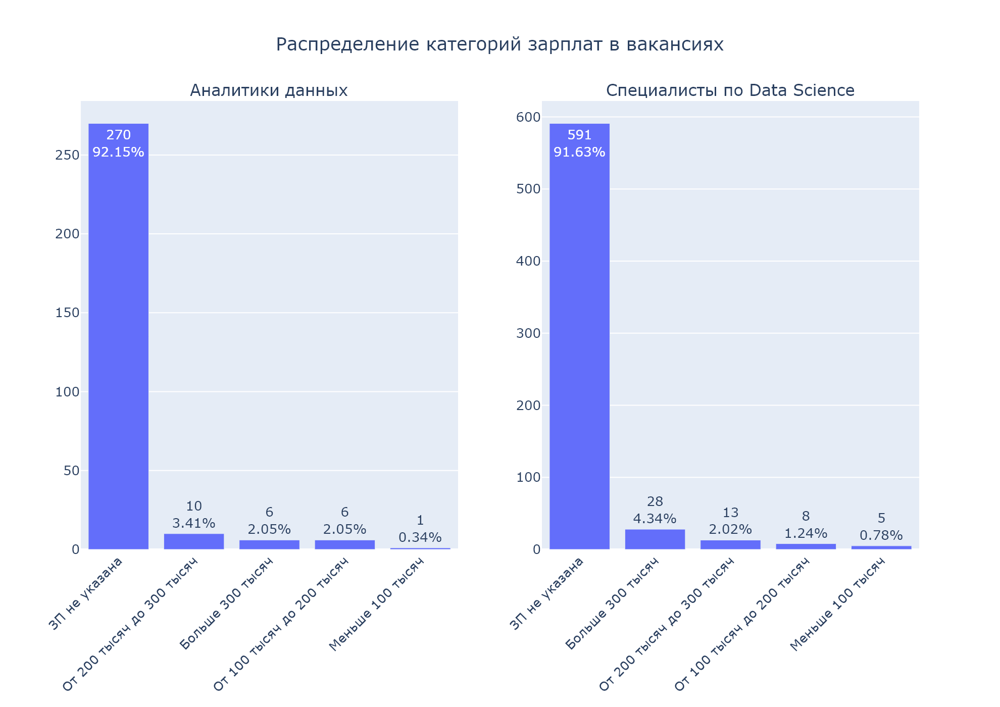

In [196]:
salary_bin_da_table['text'] = salary_bin_da_table.apply(lambda x: \
                                               f'{x["count_salary"]:.0f}<br>{x["count_salary_percent"]:.2f}%', axis=1)
fig1 = px.bar(salary_bin_da_table,
             x='salary_bin',
             y='count_salary',
             text='text')
fig1.update_layout(title='Распределение категорий зарплат аналитиков данных', title_x=0.5,
                  xaxis_title='Категория зарплаты',
                  yaxis_title='Количество вакансий',
                  font_size=13)

salary_bin_ds_table['text'] = salary_bin_ds_table.apply(lambda x: \
                                               f'{x["count_salary"]:.0f}<br>{x["count_salary_percent"]:.2f}%', axis=1)

fig2 = px.bar(salary_bin_ds_table,
             x='salary_bin',
             y='count_salary',
             text='text')
fig2.update_layout(title='Распределение категорий зарплат cпециалистов по Data Science', title_x=0.5,
                  xaxis_title='Категория зарплаты',
                  yaxis_title='Количество вакансий',
                  font_size=13)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(
    width=990,
    height=600,
    title_text="Распределение категорий зарплат в вакансиях",
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
)

pio.write_image(fig, 'Распределение категорий зарплат в вакансиях.png', width=990, height=700, scale=2)
Image('Распределение категорий зарплат в вакансиях.png')

#### Оценим общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science по данных столбцов salary_from и salary_to

In [197]:
pd.options.display.float_format = '{:,.0f}'.format
print(vacancies_da['salary_from'].describe())
print()
print(vacancies_da['salary_to'].describe())
print()
print(vacancies_ds['salary_from'].describe())
print()
print(vacancies_ds['salary_to'].describe())

count        28
mean    163,838
std      69,248
min      60,000
25%     117,500
50%     150,000
75%     187,000
max     350,000
Name: salary_from, dtype: float64

count        23
mean    249,774
std     117,901
min      90,000
25%     150,000
50%     200,000
75%     315,250
max     495,550
Name: salary_to, dtype: float64

count        53
mean    166,387
std      75,271
min      25,000
25%     110,000
50%     150,000
75%     200,000
max     350,000
Name: salary_from, dtype: float64

count        54
mean    265,662
std     117,290
min      30,000
25%     200,000
50%     300,000
75%     350,000
max     550,000
Name: salary_to, dtype: float64


#### Создадим функцию, которая будет выводить общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science в зависимости от датарфейма

In [198]:
def data_describe(dataset1, dataset2):

    pd.options.display.float_format = '{:,.0f}'.format
    print(dataset1['salary_from'].describe())
    print()
    print(dataset1['salary_to'].describe())
    print()
    print(dataset2['salary_from'].describe())
    print()
    print(dataset2['salary_to'].describe())

#### Оценим количество и долю имеющихся данных нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science по данных столбцов salary_from и salary_to

In [199]:
count_salary_from_da = vacancies_da['salary_from'].count()
count_salary_to_da = vacancies_da['salary_to'].count()
count_salary_from_ds = vacancies_ds['salary_from'].count()
count_salary_to_ds = vacancies_ds['salary_to'].count()

share_salary_from_da = round((count_salary_from_da / len(vacancies_da['salary_from']) *100), 2)
share_salary_to_da = round((count_salary_to_da / len(vacancies_da['salary_to']) *100), 2)
share_salary_from_ds = round((count_salary_from_ds / len(vacancies_ds['salary_from']) *100), 2)
share_salary_to_ds = round((count_salary_to_ds / len(vacancies_ds['salary_to']) *100), 2)

print(f'Количество данных в столбце salary_from датафрейма vacancies_da: {count_salary_from_da} или \
{share_salary_from_da} %.')
print(f'Количество данных в столбце salary_to датафрейма vacancies_da: {count_salary_to_da} или {share_salary_to_da} %.')
print(f'Количество данных в столбце salary_from датафрейма vacancies_ds: {count_salary_from_ds} или \
{share_salary_from_ds} %.')
print(f'Количество данных в столбце salary_to датафрейма vacancies_ds: {count_salary_to_ds} или {share_salary_to_ds} %.')

Количество данных в столбце salary_from датафрейма vacancies_da: 28 или 9.56 %.
Количество данных в столбце salary_to датафрейма vacancies_da: 23 или 7.85 %.
Количество данных в столбце salary_from датафрейма vacancies_ds: 53 или 8.22 %.
Количество данных в столбце salary_to датафрейма vacancies_ds: 54 или 8.37 %.


#### Создадим функцию, которая будет считать количество и долю имеющихся данных нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science в зависимости от датафрейма

In [200]:
def count_of_data(dataset1, dataset2):

    count_salary_from_da = dataset1['salary_from'].count()
    count_salary_to_da = dataset1['salary_to'].count()
    count_salary_from_ds = dataset2['salary_from'].count()
    count_salary_to_ds = dataset2['salary_to'].count()

    share_salary_from_da = round((count_salary_from_da / len(dataset1['salary_from']) *100), 2)
    share_salary_to_da = round((count_salary_to_da / len(dataset1['salary_to']) *100), 2)
    share_salary_from_ds = round((count_salary_from_ds / len(dataset2['salary_from']) *100), 2)
    share_salary_to_ds = round((count_salary_to_ds / len(dataset2['salary_to']) *100), 2)

    print(f'Количество данных по зарплате в столбце salary_from датафрейма vacancies_da: {count_salary_from_da} или\
 {share_salary_from_da} %.')
    print(f'Количество данных по зарплате в столбце salary_to датафрейма vacancies_da: {count_salary_to_da} или\
 {share_salary_to_da} %.')
    print(f'Количество данных по зарплате в столбце salary_from датафрейма vacancies_ds: {count_salary_from_ds} или\
 {share_salary_from_ds} %.')
    print(f'Количество данных по зарплате в столбце salary_to датафрейма vacancies_ds: {count_salary_to_ds} или\
 {share_salary_to_ds} %.')

#### Построим диаграмму размаха нижней и верхней границы желаемой заработной платы в вакансиях аналитик данных и специалист по Data Science по данным столбцов salary_from и salary_to

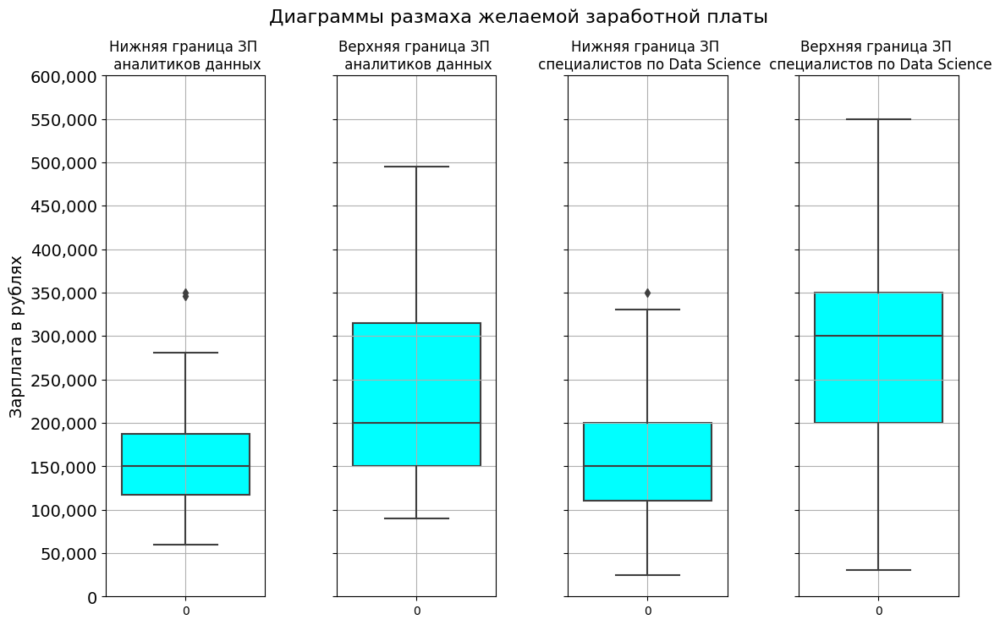

In [201]:
data1 = vacancies_da['salary_from']
data2 = vacancies_da['salary_to']
data3 = vacancies_ds['salary_from']
data4 = vacancies_ds['salary_to']

y_step = 50000
y_min = 0
y_max = 600000

fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(13, 8), dpi=100, sharey=True)
fig.suptitle('Диаграммы размаха желаемой заработной платы', fontsize=16)

sns.boxplot(data=data1, ax=ax1, boxprops=dict(facecolor='aqua'))
ax1.set_title('Нижняя граница ЗП \n аналитиков данных', fontsize=12)
ax1.set_ylabel('Зарплата в рублях', fontsize=14)
ax1.grid(True)
ax1.tick_params(axis='y', labelsize=14)
ax1.set_ylim(y_min, y_max)
ax1.set_yticks(np.arange(y_min, y_max+y_step, y_step))

sns.boxplot(data=data2, ax=ax2, boxprops=dict(facecolor='aqua'))
ax2.set_title('Верхняя граница ЗП \n аналитиков данных', fontsize=12)
ax2.grid(True)
ax2.tick_params(axis='y', labelsize=14)
ax2.set_ylim(y_min, y_max)
ax2.set_yticks(np.arange(y_min, y_max+y_step, y_step))

sns.boxplot(data=data3, ax=ax3, boxprops=dict(facecolor='aqua'))
ax3.set_title('Нижняя граница ЗП \n специалистов по Data Science', fontsize=12)
ax3.grid(True)
plt.yticks(fontsize=14)
ax3.tick_params(axis='y', labelsize=14)
ax3.set_ylim(y_min, y_max)
ax3.set_yticks(np.arange(y_min, y_max+y_step, y_step))

sns.boxplot(data=data4, ax=ax4, boxprops=dict(facecolor='aqua'))
ax4.set_title('Верхняя граница ЗП \n специалистов по Data Science', fontsize=12)
ax4.grid(True)
plt.yticks(fontsize=14)
ax4.tick_params(axis='y', labelsize=14)
ax4.set_ylim(y_min, y_max)
ax4.set_yticks(np.arange(y_min, y_max+y_step, y_step))

plt.subplots_adjust(wspace=0.45)
formatter = ticker.FuncFormatter(lambda x, _: '{:,.0f}'.format(x))
ax1.yaxis.set_major_formatter(formatter)
ax2.yaxis.set_major_formatter(formatter)
ax3.yaxis.set_major_formatter(formatter)
ax4.yaxis.set_major_formatter(formatter)

plt.show()

#### Напишем функцию, которая будет строить диаграмму размаха нижней и верхней границы желаемой заработной платы в зависимости от датафрейма

In [202]:
def make_boxplot(dataset1, dataset2, step, min_salary, max_salary, title1):

    data1 = dataset1['salary_from']
    data2 = dataset1['salary_to']
    data3 = dataset2['salary_from']
    data4 = dataset2['salary_to']

    y_step = step
    y_min = min_salary
    y_max = max_salary

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(13, 8), dpi=100, sharey=True)
    fig.suptitle(title1, fontsize=16)

    sns.boxplot(data=data1, ax=ax1, boxprops=dict(facecolor='aqua'))
    ax1.set_title('Нижняя граница ЗП \n аналитиков данных', fontsize=12)
    ax1.set_ylabel('Зарплата в рублях', fontsize=14)
    ax1.grid(True)
    ax1.tick_params(axis='y', labelsize=14)
    ax1.set_ylim(y_min, y_max)
    ax1.set_yticks(np.arange(y_min, y_max+y_step, y_step))

    sns.boxplot(data=data2, ax=ax2, boxprops=dict(facecolor='aqua'))
    ax2.set_title('Верхняя граница ЗП \n аналитиков данных', fontsize=12)
    ax2.grid(True)
    ax2.tick_params(axis='y', labelsize=14)
    ax2.set_ylim(y_min, y_max)
    ax2.set_yticks(np.arange(y_min, y_max+y_step, y_step))

    sns.boxplot(data=data3, ax=ax3, boxprops=dict(facecolor='aqua'))
    ax3.set_title('Нижняя граница ЗП \n специалистов по Data Science', fontsize=12)
    ax3.grid(True)
    plt.yticks(fontsize=14)
    ax3.tick_params(axis='y', labelsize=14)
    ax3.set_ylim(y_min, y_max)
    ax3.set_yticks(np.arange(y_min, y_max+y_step, y_step))

    sns.boxplot(data=data4, ax=ax4, boxprops=dict(facecolor='aqua'))
    ax4.set_title('Верхняя граница ЗП \n специалистов по Data Science', fontsize=12)
    ax4.grid(True)
    plt.yticks(fontsize=14)
    ax4.tick_params(axis='y', labelsize=14)
    ax4.set_ylim(y_min, y_max)
    ax4.set_yticks(np.arange(y_min, y_max+y_step, y_step))

    plt.subplots_adjust(wspace=0.45)
    formatter = ticker.FuncFormatter(lambda x, _: '{:,.0f}'.format(x))
    ax1.yaxis.set_major_formatter(formatter)
    ax2.yaxis.set_major_formatter(formatter)
    ax3.yaxis.set_major_formatter(formatter)
    ax4.yaxis.set_major_formatter(formatter)

    return plt.show()

#### Оценим количество данных по зарплатам для аналитиков данных и специалистов по Data Science для грейда "Junior (no experince)", используя функцию count_of_data

In [203]:
count_of_data(employer_da_junior, employer_ds_junior)

Количество данных по зарплате в столбце salary_from датафрейма vacancies_da: 1 или 11.11 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_da: 0 или 0.0 %.
Количество данных по зарплате в столбце salary_from датафрейма vacancies_ds: 2 или 7.69 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_ds: 1 или 3.85 %.


#### Оценим общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science для грейда "Junior (no experince)", используя функцию data_describe

In [204]:
data_describe(employer_da_junior, employer_ds_junior)

count        1
mean    60,000
std        NaN
min     60,000
25%     60,000
50%     60,000
75%     60,000
max     60,000
Name: salary_from, dtype: float64

count     0
mean    NaN
std     NaN
min     NaN
25%     NaN
50%     NaN
75%     NaN
max     NaN
Name: salary_to, dtype: float64

count        2
mean    47,500
std     31,820
min     25,000
25%     36,250
50%     47,500
75%     58,750
max     70,000
Name: salary_from, dtype: float64

count        1
mean    80,000
std        NaN
min     80,000
25%     80,000
50%     80,000
75%     80,000
max     80,000
Name: salary_to, dtype: float64


#### Построим диаграмму размаха нижней и верхней границы желаемой заработной платы в вакансиях аналитик данных и специалист по Data Science для грейда "Junior (no experince)", используюя фунцию make_boxplot

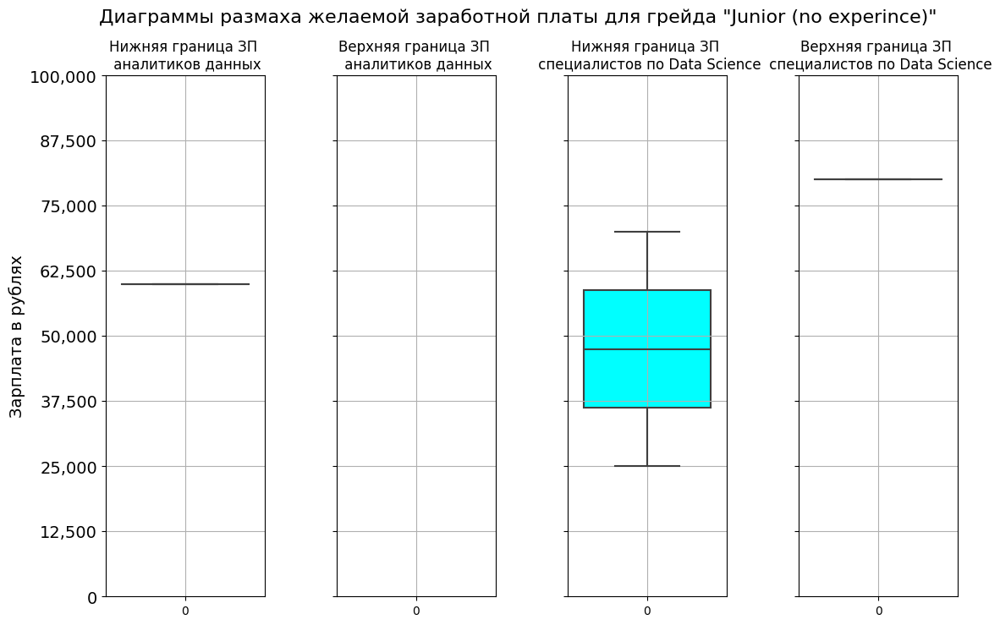

In [205]:
make_boxplot(employer_da_junior, employer_ds_junior, 12500, 0, 100000, \
             'Диаграммы размаха желаемой заработной платы для грейда "Junior (no experince)"')

#### Оценим количество данных по зарплатам для аналитиков данных и специалистов по Data Science для грейда "Junior+ (1-3 years)", используя функцию count_of_data

In [206]:
count_of_data(employer_da_junior_plus, employer_ds_junior_plus)

Количество данных по зарплате в столбце salary_from датафрейма vacancies_da: 20 или 12.12 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_da: 15 или 9.09 %.
Количество данных по зарплате в столбце salary_from датафрейма vacancies_ds: 23 или 8.33 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_ds: 28 или 10.14 %.


#### Оценим общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science для грейда "Junior+ (1-3 years)", используя функцию data_describe

In [207]:
data_describe(employer_da_junior_plus, employer_ds_junior_plus)

count        20
mean    143,050
std      35,866
min      80,000
25%     107,500
50%     150,000
75%     180,000
max     187,000
Name: salary_from, dtype: float64

count        15
mean    184,067
std      57,540
min      90,000
25%     140,000
50%     200,000
75%     210,000
max     280,500
Name: salary_to, dtype: float64

count        23
mean    131,000
std      48,777
min      50,000
25%     100,000
50%     130,000
75%     150,000
max     210,000
Name: salary_from, dtype: float64

count        28
mean    234,643
std     105,074
min      30,000
25%     167,500
50%     250,000
75%     312,500
max     350,000
Name: salary_to, dtype: float64


#### Построим диаграмму размаха нижней и верхней границы желаемой заработной платы в вакансиях аналитик данных и специалист по Data Science для грейда "Junior+ (1-3 years)", используюя фунцию make_boxplot

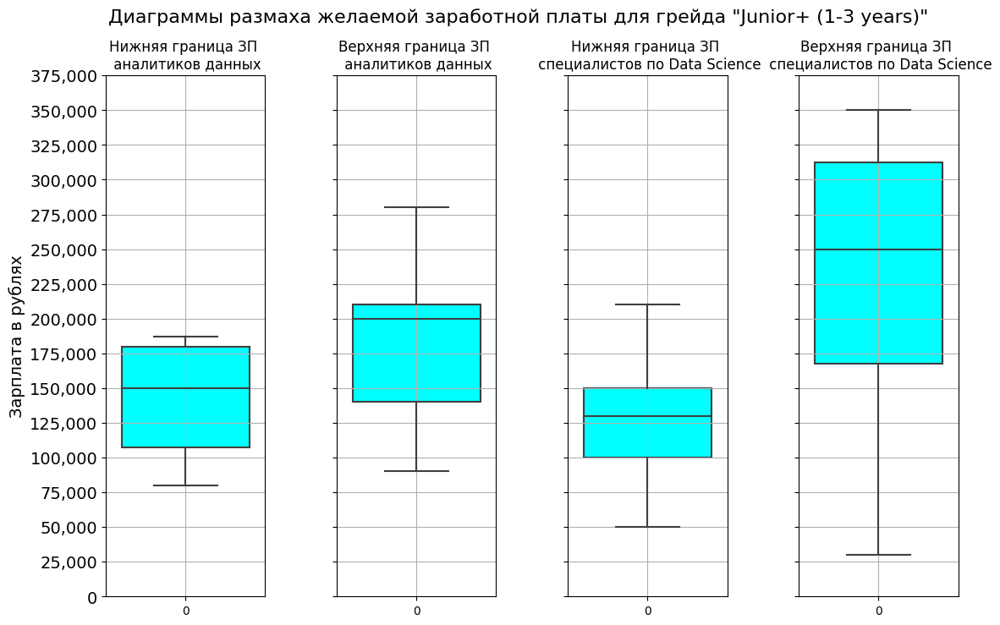

In [208]:
make_boxplot(employer_da_junior_plus, employer_ds_junior_plus, 25000, 0, 375000, \
             'Диаграммы размаха желаемой заработной платы для грейда "Junior+ (1-3 years)"')

#### Оценим количество данных по зарплатам для аналитиков данных и специалистов по Data Science для грейда "Middle (3-6 years)", используя функцию count_of_data

In [209]:
count_of_data(employer_da_middle, employer_ds_middle)

Количество данных по зарплате в столбце salary_from датафрейма vacancies_da: 7 или 6.03 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_da: 8 или 6.9 %.
Количество данных по зарплате в столбце salary_from датафрейма vacancies_ds: 27 или 8.44 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_ds: 22 или 6.88 %.


#### Оценим общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science для грейда "Middle (3-6 years)", используя функцию data_describe

In [210]:
data_describe(employer_da_middle, employer_ds_middle)

count         7
mean    238,064
std      88,543
min     120,000
25%     185,000
50%     200,000
75%     313,225
max     350,000
Name: salary_from, dtype: float64

count         8
mean    372,975
std     102,312
min     200,000
25%     325,000
50%     400,000
75%     432,438
max     495,550
Name: salary_to, dtype: float64

count        27
mean    205,574
std      74,081
min      93,500
25%     150,000
50%     200,000
75%     250,000
max     350,000
Name: salary_from, dtype: float64

count        22
mean    302,534
std     109,532
min     140,250
25%     207,500
50%     300,000
75%     350,000
max     500,000
Name: salary_to, dtype: float64


#### Построим диаграмму размаха нижней и верхней границы желаемой заработной платы в вакансиях аналитик данных и специалист по Data Science для грейда "Middle (3-6 years)", используюя фунцию make_boxplot

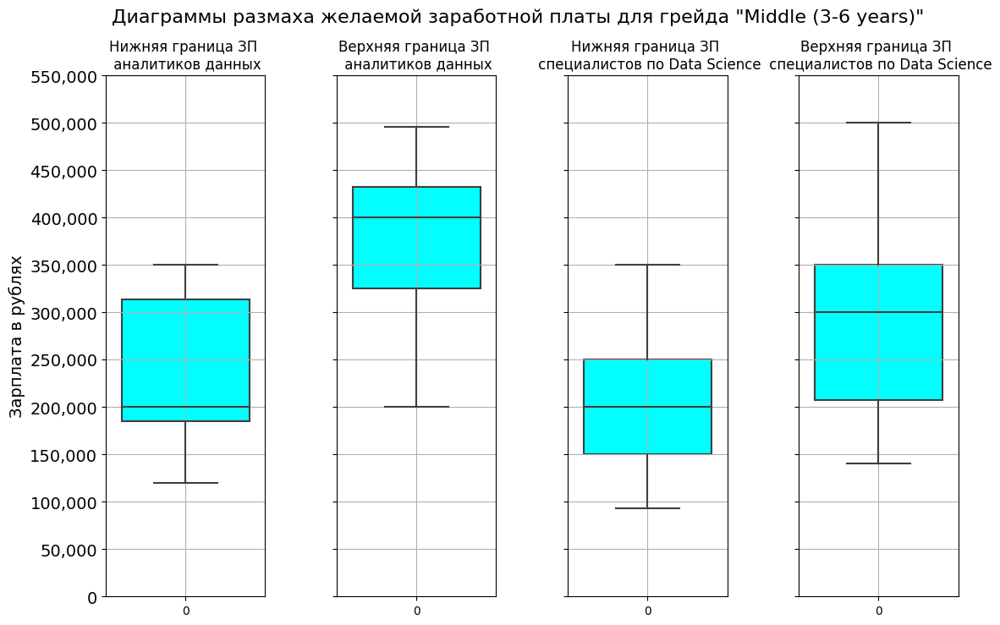

In [211]:
make_boxplot(employer_da_middle, employer_ds_middle, 50000, 0, 550000, \
             'Диаграммы размаха желаемой заработной платы для грейда "Middle (3-6 years)"')

#### Оценим количество данных по зарплатам для аналитиков данных и специалистов по Data Science для грейда "Senior (6+ years)", используя функцию count_of_data

In [212]:
count_of_data(employer_da_senior, employer_ds_senior)

Количество данных по зарплате в столбце salary_from датафрейма vacancies_da: 0 или 0.0 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_da: 0 или 0.0 %.
Количество данных по зарплате в столбце salary_from датафрейма vacancies_ds: 1 или 4.35 %.
Количество данных по зарплате в столбце salary_to датафрейма vacancies_ds: 3 или 13.04 %.


#### Оценим общие числовые характеристики нижней и верхней границы желаемой заработной платы в рублях в вакансиях аналитик данных и специалистов по Data Science для грейда "Senior (6+ years)", используя функцию data_describe

In [213]:
data_describe(employer_da_senior, employer_ds_senior)

count     0
mean    NaN
std     NaN
min     NaN
25%     NaN
50%     NaN
75%     NaN
max     NaN
Name: salary_from, dtype: float64

count     0
mean    NaN
std     NaN
min     NaN
25%     NaN
50%     NaN
75%     NaN
max     NaN
Name: salary_to, dtype: float64

count         1
mean    160,000
std         NaN
min     160,000
25%     160,000
50%     160,000
75%     160,000
max     160,000
Name: salary_from, dtype: float64

count         3
mean    346,667
std     184,481
min     190,000
25%     245,000
50%     300,000
75%     425,000
max     550,000
Name: salary_to, dtype: float64


#### Построим диаграмму размаха нижней и верхней границы желаемой заработной платы в вакансиях аналитик данных и специалист по Data Science для грейда "Senior (6+ years)", используюя фунцию make_boxplot

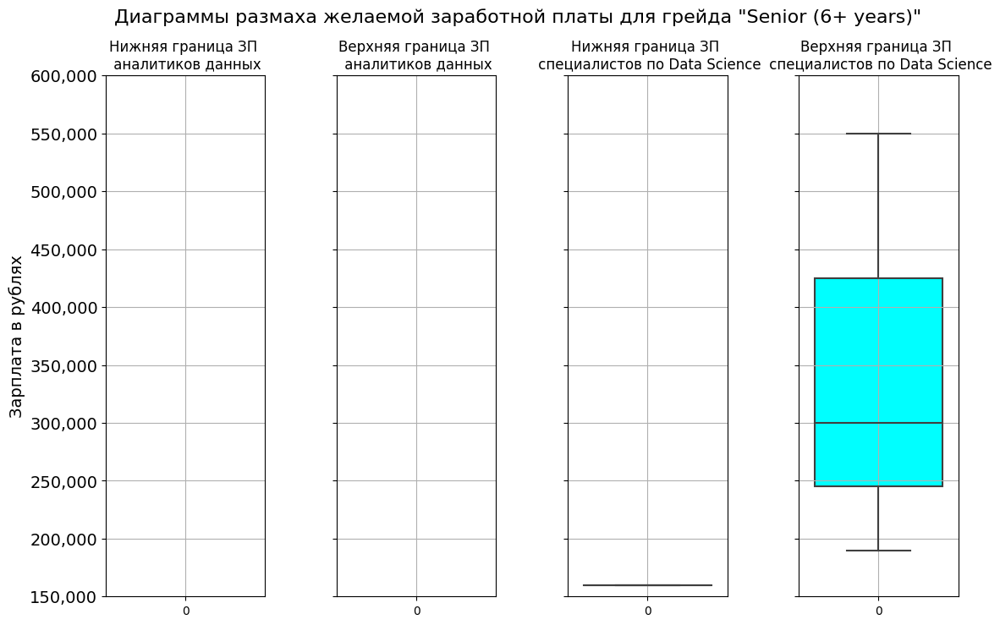

In [214]:
make_boxplot(employer_da_senior, employer_ds_senior, 50000, 150000, 600000, \
             'Диаграммы размаха желаемой заработной платы для грейда "Senior (6+ years)"')

#### Выводы по анализу зарплат в вакансиях аналитик данных и специалист по Data Science

1. Медианная зарплата аналитиков данных составляет от 150 до 200 тысяч рублей. Медианная зарплата специалистов по Data Science составляет от 150 до 300 тысяч рублей. При этом у нас имеется не более 10 % данных по нижним и верхним границам зарплат аналитиков данных и специалистов по Data Science. Исходя из этого выводы по зарплате данных специалистов делать достаточно сложно.
2. В разрезе грейда "Junior (no experince)" представлены единичные данные по зарплате или вовсе отсутствующие. Исходя из этого делать какие-либо выводы по зарплате специалистов данного грейда вообще не имеет смысла.
3. В разрезе грейда "Junior+ (1-3 years)" медианная зарплата аналитиков данных составляет от 150 до 200 тысяч рублей. Медианная  зарплата специалистов по Data Science составляет от 130 до 250 тысяч рублей.
4. В разрезе грейда "Middle (3-6 years)" медианная зарплата аналитиков данных составляет от 200 до 400 тысяч рублей. Медианная зарплата специалистов по Data Science составляет от 200 до 300 тысяч рублей.
5. В разрезе грейда "Senior (6+ years)" представлены единичные данные по зарплате или вовсе отсутствующие. Исходя из этого делать какие-либо выводы по зарплате специалистов данного грейда вообще не имеет смысла.

### Определение типа занятости аналитиков данных и специалистов по Data Science

#### Построим сводную таблицу методом crosstab() со следующими столбцами:
    employment - тип занятости;
    count_employment - количество вакансий аналитиков данных с этим типом занятости;
    count_employment_percent - количество вакансий с этим типом занятости в процентах от общего.

In [215]:
pd.options.display.float_format = '{:,.2f}'.format
crosstab_employment_da = pd.crosstab(index=vacancies_da['employment'] , columns=['count_employment']).reset_index()
crosstab_employment_da.columns = ['employment', 'count_employment']
crosstab_employment_da['count_employment_percent'] = round((crosstab_employment_da['count_employment'] /\
                                                              crosstab_employment_da['count_employment'].sum()) * 100, 2)
crosstab_employment_da = crosstab_employment_da.sort_values(by = 'count_employment', ascending=False).reset_index(drop=\
                                                                                                                  True)
crosstab_employment_da

,employment,count_employment,count_employment_percent
0,Полная занятость,292,99.66
1,Частичная занятость,1,0.34


#### Создадим функцию, которая будет строить данную сводную таблицу в зависимости от изучаемого датафрейма

In [216]:
def make_pivot_employment(dataset1):

    crosstab_employment_da = pd.crosstab(index=dataset1['employment'] , columns=['count_employment']).reset_index()
    crosstab_employment_da.columns = ['employment', 'count_employment']
    crosstab_employment_da['count_employment_percent'] = round((crosstab_employment_da['count_employment'] /\
                                                              crosstab_employment_da['count_employment'].sum()) * 100, 2)
    crosstab_employment_da = crosstab_employment_da.sort_values(by = 'count_employment', ascending=False).reset_index(drop\
                                                                                                                     =True)
    return crosstab_employment_da

#### Создадим переменную employment_da_table и присвоим ей результат функции make_pivot_employment для определения типа занятости аналитиков данных

In [217]:
employment_da_table = make_pivot_employment(vacancies_da)

#### Создадим переменную employment_ds_table и присвоим ей результат выполнения функции make_pivot_employment для определения типа занятости специалистов по Data Science

In [218]:
employment_ds_table = make_pivot_employment(vacancies_ds)

#### Создадим переменную employment_da_junior_table и присвоим ей результат функции make_pivot_employment для определения типа занятости аналитиков данных для грейда "Junior (no experince)"

In [219]:
employment_da_junior_table = make_pivot_employment(employer_da_junior)

#### Создадим переменную employment_ds_junior_table и присвоим ей результат функции make_pivot_employment для определения типа занятости специалистов по Data Science для грейда "Junior (no experince)"

In [220]:
employment_ds_junior_table = make_pivot_employment(employer_ds_junior)

#### Создадим переменную employment_da_junior_plus_table и присвоим ей результат функции make_pivot_employment для определения типа занятости аналитиков данных для грейда "Junior+ (1-3 years)"

In [221]:
employment_da_junior_plus_table = make_pivot_employment(employer_da_junior_plus)

#### Создадим переменную employment_ds_junior_plus_table и присвоим ей результат функции make_pivot_employment для определения типа занятости специалистов по Data Science для грейда "Junior+ (1-3 years)"

In [222]:
employment_ds_junior_plus_table = make_pivot_employment(employer_ds_junior_plus)

#### Создадим переменную employment_da_middle_table и присвоим ей результат функции make_pivot_employment для определения типа занятости аналитиков данных для грейда "Middle (3-6 years)"

In [223]:
employment_da_middle_table = make_pivot_employment(employer_da_middle)

#### Создадим переменную employment_ds_middle_table и присвоим ей результат функции make_pivot_employment для определения типа занятости специалистов по Data Science для грейда "Middle (3-6 years)"

In [224]:
employment_ds_middle_table = make_pivot_employment(employer_ds_middle)

#### Создадим переменную employment_da_senior_table и присвоим ей результат функции make_pivot_employment для определения типа занятости аналитиков данных для грейда "Senior (6+ years)"

In [225]:
employment_da_senior_table = make_pivot_employment(employer_da_senior)

#### Создадим переменную employment_ds_senior_table и присвоим ей результат функции make_pivot_employment для определения типа занятости специалистов по Data Science для грейда "Senior (6+ years)"

In [226]:
employment_ds_senior_table = make_pivot_employment(employer_ds_senior)

#### Построим столбчатую диаграмму распределения типов занятостей среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц employment_da_table и employment_ds_table

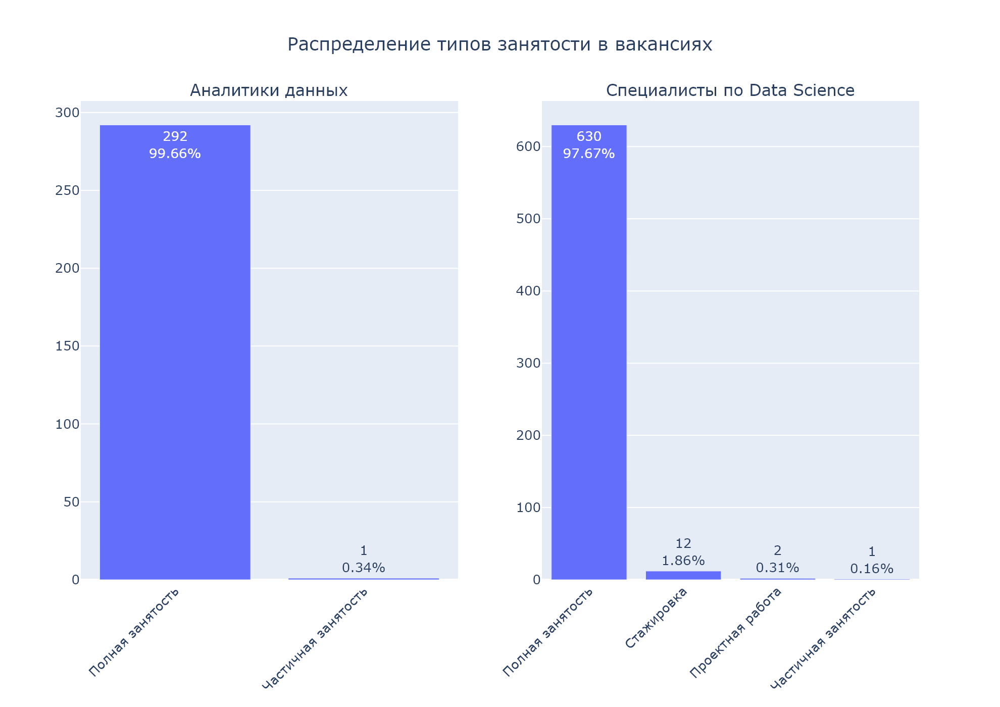

In [227]:
employment_da_table['text'] = employment_da_table.apply(lambda x: \
                                               f'{x["count_employment"]:.0f}<br>{x["count_employment_percent"]:.2f}%',\
                                                        axis=1)
fig1 = px.bar(employment_da_table,
             x='employment',
             y='count_employment',
             text='text')
fig1.update_layout(title='Распределение типов занятости для аналитиков данных', title_x=0.5,
                  xaxis_title='Тип занятости',
                  yaxis_title='Количество вакансий',
                  font_size=13)

employment_ds_table['text'] = employment_ds_table.apply(lambda x: \
                                               f'{x["count_employment"]:.0f}<br>{x["count_employment_percent"]:.2f}%',\
                                                        axis=1)
fig2 = px.bar(employment_ds_table,
             x='employment',
             y='count_employment',
             text='text')
fig1.update_layout(title='Распределение типов занятости для специалистов по Data Science', title_x=0.5,
                  xaxis_title='Тип занятости',
                  yaxis_title='Количество вакансий',
                  font_size=13)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(
    width=990,
    height=600,
    title_text="Распределение типов занятости в вакансиях",
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
)

pio.write_image(fig, 'Распределение типов занятости в вакансиях.png', width=990, height=700, scale=2)
Image('Распределение типов занятости в вакансиях.png')

#### Создадим функцию, которая будет строить столбчатую диаграмму распределения типов занятостей среди вакансий аналитик данных и специалист по Data Science в зависимости от датафреймов

In [228]:
def make_plot_employment(dataset1, dataset2, title1):

    dataset1['text'] = dataset1.apply(lambda x: f'{x["count_employment"]:.0f}<br>{x["count_employment_percent"]:.2f}%',\
                                      axis=1)
    fig1 = px.bar(dataset1,
                  y='count_employment',
                  text='text')
    fig1.update_layout(title=title1, title_x=0.5,
                       xaxis_title='Тип занятости',
                       yaxis_title='Количество вакансий',
                       font_size=13)

    dataset2['text'] = dataset2.apply(lambda x: f'{x["count_employment"]:.0f}<br>{x["count_employment_percent"]:.2f}%',\
                                      axis=1)
    fig2 = px.bar(dataset2,
                  x='employment',
                  y='count_employment',
                  text='text')
    fig1.update_layout(title=title1, title_x=0.5,
                       xaxis_title='Тип занятости',
                       yaxis_title='Количество вакансий',
                       font_size=13)

    fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
    fig.add_trace(fig1.data[0], row=1, col=1)
    fig.add_trace(fig2.data[0], row=1, col=2)

    fig.update_layout(
    width=990,
    height=600,
    title_text=title1,
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
    )

    filename = f"{title1}.png"
    pio.write_image(fig, filename, width=900, height=700, scale=2)
    return Image(filename)

#### Оценим распределение типов занятостей в вакансиях аналитик данных и специалист по Data Science для грейда "Junior (no experince)"

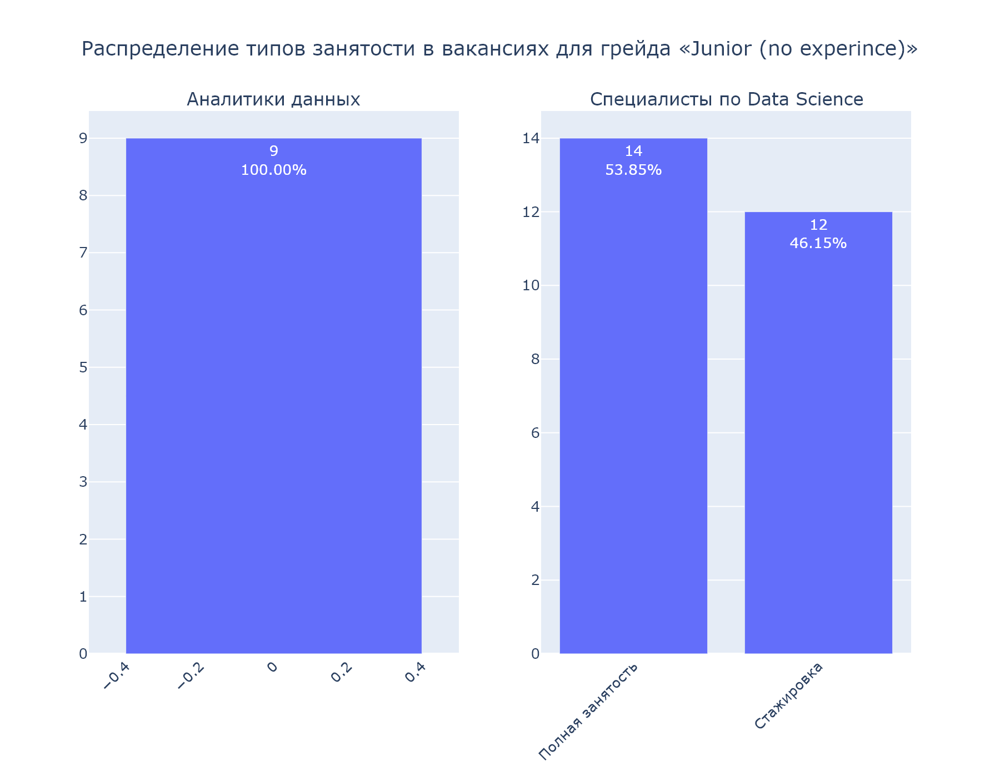

In [229]:
make_plot_employment(employment_da_junior_table, employment_ds_junior_table, \
                     'Распределение типов занятости в вакансиях для грейда «Junior (no experince)»')

#### Оценим распределение типов занятостей  в вакансиях аналитик данных и специалист по Data Science для грейда "Junior+ (1-3 years)"

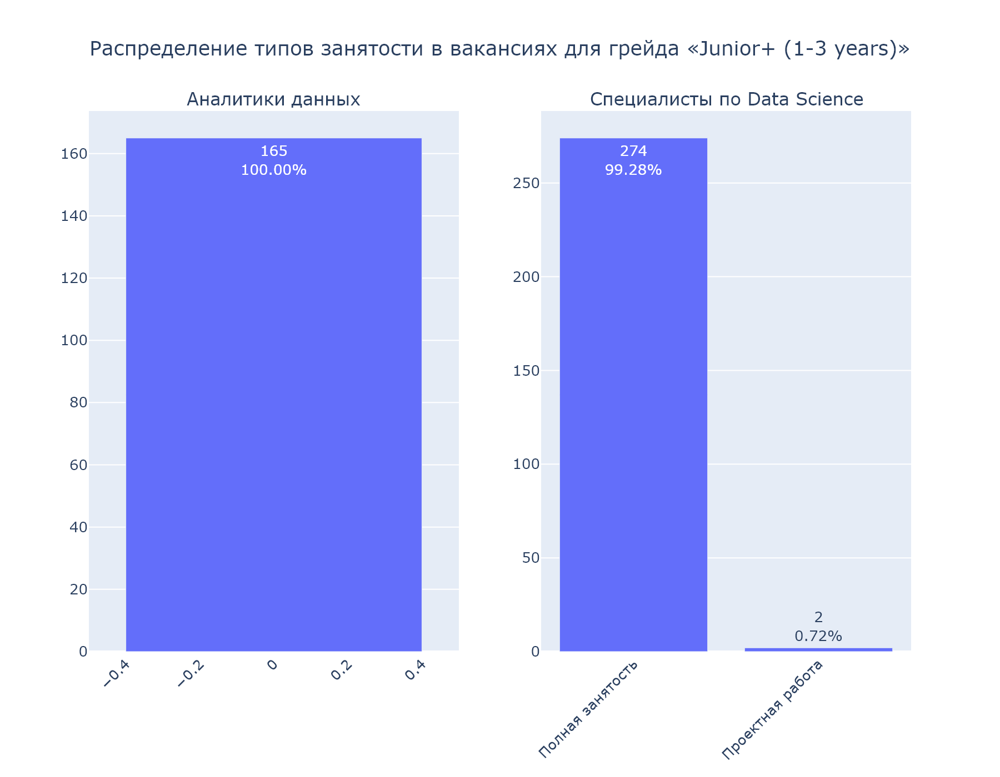

In [230]:
make_plot_employment(employment_da_junior_plus_table, employment_ds_junior_plus_table, \
                     'Распределение типов занятости в вакансиях для грейда «Junior+ (1-3 years)»')

#### Оценим распределение типов занятостей в вакансиях аналитик данных и специалист по Data Science для грейда "Middle (3-6 years)"

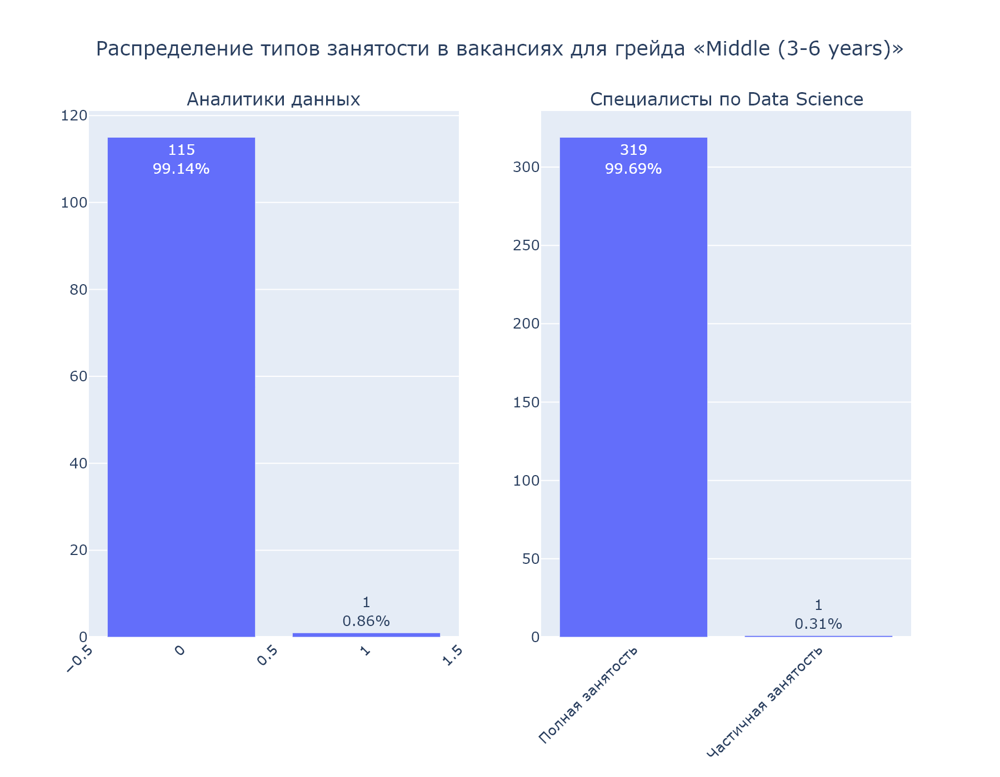

In [231]:
make_plot_employment(employment_da_middle_table, employment_ds_middle_table, \
                     'Распределение типов занятости в вакансиях для грейда «Middle (3-6 years)»')

#### Оценим распределение типов занятостей в вакансиях аналитик данных и специалист по Data Science для грейда "Senior (6+ years)"

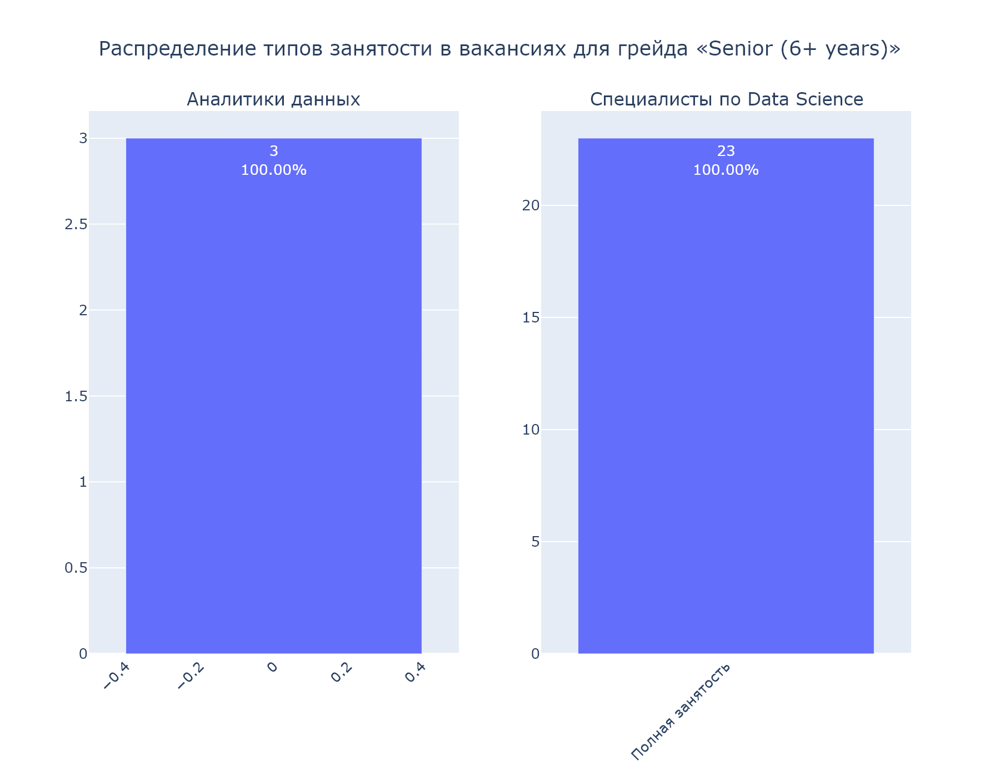

In [232]:
make_plot_employment(employment_da_senior_table, employment_ds_senior_table, \
                     'Распределение типов занятости в вакансиях для грейда «Senior (6+ years)»')

#### Выводы по определению типа занятости аналитиков данных и специалистов по Data Science

1. У аналитиков данных и специалистов по Data Science преобладает полная занятость. С таким типов представлено 292 вакансии у аналитиков данных или 99,66% и 630 вакансий специалистов по Data Science или 97,76%. Также у специалистов по Data Science выделяется такой тип занятости как стажировка – 12 вакансий или 1,86 %. Другие типы занятости представлены в единичных значениях.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных представлена только полная занятость – 9 вакансий или 100%. У специалистов по Data Science представлено 14 вакансий с полной занятостью или 53,85% и 12 вакансий в виде стажировки или 46,15%.
3. В разрезе грейда "Junior+ (1-3 years)" у аналитиков представлено 165 вакансий с полным типом занятости или 100%. У специалистов по Data Science представлено 274 вакансии с полной занятостью или 99,28% и 2 вакансии с проектной работой или 0,72%.
4. В разрезе грейда "Middle (3-6 years)" представлено 115 вакансий с полным типом занятости или 99,14 и 1 вакансия с частичной занятостью или 0,86%. У специалистов по Data Science представлено 319 вакансий с полным типом занятости или 99,69% и 1 вакансия с частичной занятостью или 0,31%.
5. В разрезе грейда "Senior (6+ years)" у аналитиков данных и специалистов по Data Science представлены только вакансии с полным типом занятости. 3 у аналитиков данных и 23 у специалистов по Data Science.

### Определение графика работы аналитиков данных и специалистов по Data Science

#### Построим сводную таблицу методом crosstab() со следующими столбцами:
    schedule - график работы;
    count_schedule - количество вакансий аналитиков данных с данным графиком работы;
    count_schedule_percent - количество вакансий аналитиков данных с данным графиком работы в процентах от общего.

In [233]:
crosstab_schedule_da = pd.crosstab(index=vacancies_da['schedule'] , columns=['count_schedule']).reset_index()
crosstab_schedule_da.columns = ['schedule', 'count_schedule']
crosstab_schedule_da['count_schedule_percent'] = round((crosstab_schedule_da['count_schedule'] /\
                                                              crosstab_schedule_da['count_schedule'].sum()) * 100, 2)
crosstab_schedule_da = crosstab_schedule_da.sort_values(by = 'count_schedule', ascending=False).reset_index(drop=True)
crosstab_schedule_da

,schedule,count_schedule,count_schedule_percent
0,Полный день,219,74.74
1,Удаленная работа,63,21.50
2,Гибкий график,7,2.39
3,Сменный график,4,1.37


#### Создадим функцию, которая будет строить данную сводную таблицу в зависимости от изучаемого датафрейма

In [234]:
def make_pivot_schedule(dataset1):

    crosstab_schedule_da = pd.crosstab(index=dataset1['schedule'] , columns=['count_schedule']).reset_index()
    crosstab_schedule_da.columns = ['schedule', 'count_schedule']
    crosstab_schedule_da['count_schedule_percent'] = round((crosstab_schedule_da['count_schedule'] /\
                                                              crosstab_schedule_da['count_schedule'].sum()) * 100, 2)
    crosstab_schedule_da = crosstab_schedule_da.sort_values(by = 'count_schedule', ascending=False).reset_index(drop=True)
    return crosstab_schedule_da

#### Создадим переменную schedule_da_table и присвоим ей результат функции make_pivot_employment для определения графика работы аналитиков данных

In [235]:
schedule_da_table = make_pivot_schedule(vacancies_da)

#### Создадим переменную schedule_ds_table и присвоим ей результат выполнения функции make_pivot_schedule для определения графика работы специалистов по Data Science

In [236]:
schedule_ds_table = make_pivot_schedule(vacancies_ds)

#### Создадим переменную schedule_da_junior_table и присвоим ей результат функции make_pivot_employment для определения графика работы аналитиков данных для грейда "Junior (no experince)"

In [237]:
schedule_da_junior_table = make_pivot_schedule(employer_da_junior)

#### Создадим переменную schedule_ds_junior_table и присвоим ей результат функции make_pivot_employment для определения графика работы специалистов по Data Science для грейда "Junior (no experince)"

In [238]:
schedule_ds_junior_table = make_pivot_schedule(employer_ds_junior)

#### Создадим переменную schedule_da_junior_plus_table и присвоим ей результат функции make_pivot_employment для определения графика работы аналитиков данных для грейда "Junior+ (1-3 years)"

In [239]:
schedule_da_junior_plus_table = make_pivot_schedule(employer_da_junior_plus)

#### Создадим переменную schedule_ds_junior_plus_table и присвоим ей результат функции make_pivot_employment для определения графика работы специалистов по Data Science для грейда "Junior+ (1-3 years)"

In [240]:
schedule_ds_junior_plus_table = make_pivot_schedule(employer_ds_junior_plus)

#### Создадим переменную schedule_da_middle_table и присвоим ей результат функции make_pivot_employment для определения графика работы аналитиков данных для грейда "Middle (3-6 years)"

In [241]:
schedule_da_middle_table = make_pivot_schedule(employer_da_middle)

#### Создадим переменную schedule_ds_middle_table и присвоим ей результат функции make_pivot_employment для определения графика работы специалистов по Data Science для грейда "Middle (3-6 years)"

In [242]:
schedule_ds_middle_table = make_pivot_schedule(employer_ds_middle)

#### Создадим переменную schedule_da_senior_table и присвоим ей результат функции make_pivot_employment для определения графика работы аналитиков данных для грейда "Senior (6+ years)"

In [243]:
schedule_da_senior_table = make_pivot_schedule(employer_da_senior)

#### Создадим переменную schedule_ds_senior_table и присвоим ей результат функции make_pivot_employment для определения графика работы специалистов по Data Science для грейда "Senior (6+ years)"

In [244]:
schedule_ds_senior_table = make_pivot_schedule(employer_ds_senior)

#### Построим столбчатую диаграмму распределения графиков работы среди вакансий аналитик данных и специалист по Data Science по данным сводных таблиц employment_da_table и employment_ds_table

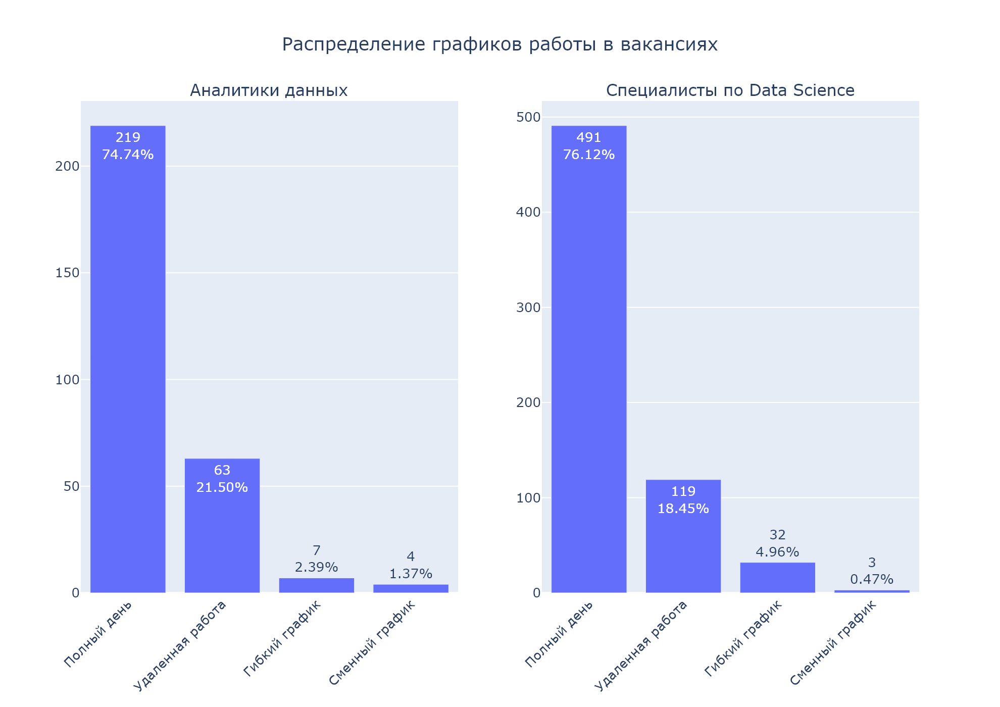

In [245]:
schedule_da_table['text'] = schedule_da_table.apply(lambda x: \
                                               f'{x["count_schedule"]:.0f}<br>{x["count_schedule_percent"]:.2f}%', axis=1)
fig1 = px.bar(schedule_da_table,
             x='schedule',
             y='count_schedule',
             text='text')
fig1.update_layout(title='Распределение графиков работы для аналитиков данных', title_x=0.5,
                  xaxis_title='График работы',
                  yaxis_title='Количество вакансий',
                  font_size=13)

schedule_ds_table['text'] = schedule_ds_table.apply(lambda x: \
                                               f'{x["count_schedule"]:.0f}<br>{x["count_schedule_percent"]:.2f}%', axis=1)
fig2 = px.bar(schedule_ds_table,
             x='schedule',
             y='count_schedule',
             text='text')
fig1.update_layout(title='Распределение графиков работы для специалистов по Data Science', title_x=0.5,
                  xaxis_title='График работы',
                  yaxis_title='Количество вакансий',
                  font_size=13)

fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
fig.add_trace(fig1.data[0], row=1, col=1)
fig.add_trace(fig2.data[0], row=1, col=2)

fig.update_layout(
    width=990,
    height=600,
    title_text="Распределение графиков работы в вакансиях",
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
)

pio.write_image(fig, 'Распределение графиков работы в вакансиях.png', width=990, height=700, scale=2)
Image('Распределение графиков работы в вакансиях.png')

#### Создадим функцию, которая будет строить столбчатую диаграмму распределения графиков работы среди вакансий аналитик данных и специалист по Data Science в зависимости от датафреймов

In [246]:
def make_plot_schedule(dataset1, dataset2, title1):

    dataset1['text'] = dataset1.apply(lambda x: f'{x["count_schedule"]:.0f}<br>{x["count_schedule_percent"]:.2f}%', axis=1)
    fig1 = px.bar(dataset1,
                  x='schedule',
                  y='count_schedule',
                  text='text')
    fig1.update_layout(title='Распределение графиков работы для аналитиков данных', title_x=0.5,
                       xaxis_title='График работы',
                       yaxis_title='Количество вакансий',
                       font_size=13)

    dataset2['text'] = dataset2.apply(lambda x: f'{x["count_schedule"]:.0f}<br>{x["count_schedule_percent"]:.2f}%', axis=1)
    fig2 = px.bar(dataset2,
                  x='schedule',
                  y='count_schedule',
                  text='text')
    fig1.update_layout(title='Распределение графиков работы для специалистов по Data Science', title_x=0.5,
                       xaxis_title='График работы',
                       yaxis_title='Количество вакансий',
                       font_size=13)

    fig = make_subplots(rows=1, cols=2, subplot_titles=("Аналитики данных", "Специалисты по Data Science"))
    fig.add_trace(fig1.data[0], row=1, col=1)
    fig.add_trace(fig2.data[0], row=1, col=2)

    fig.update_layout(
    width=990,
    height=600,
    title_text=title1,
    title_x=0.5,
    font_size=13,
    xaxis_tickangle=-45,
    xaxis2_tickangle=-45
    )

    filename = f"{title1}.png"
    pio.write_image(fig, filename, width=900, height=700, scale=2)
    return Image(filename)

#### Оценим распределение графиков работы в вакансиях аналитик данных и специалист по Data Science для грейда "Junior (no experince)"

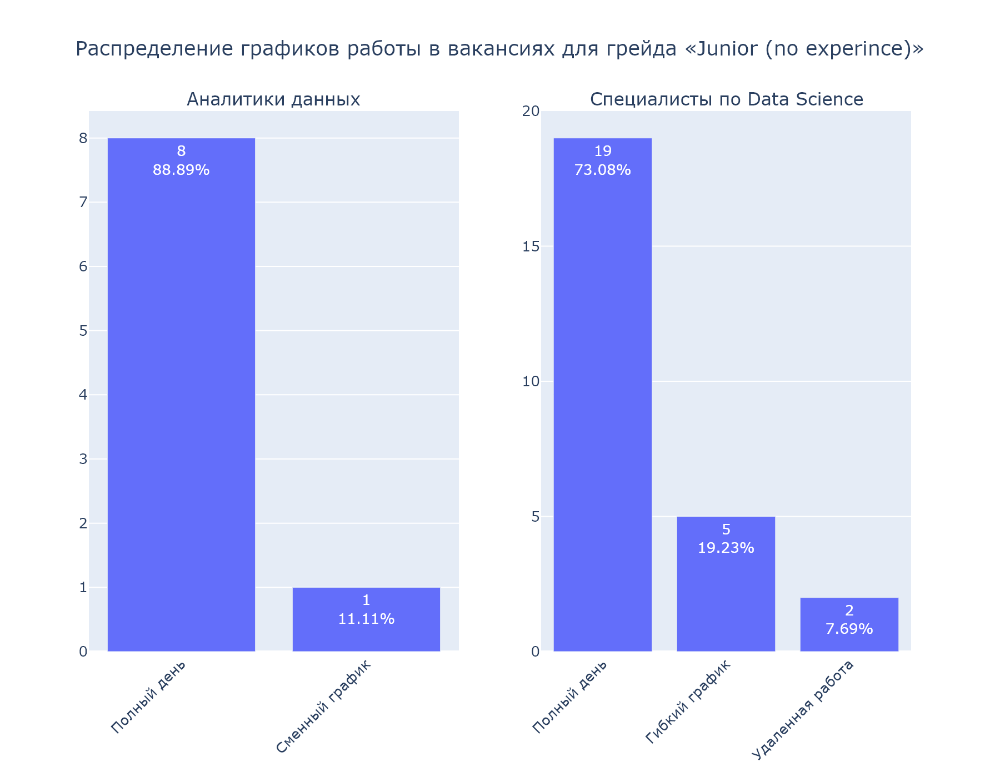

In [247]:
make_plot_schedule(schedule_da_junior_table, schedule_ds_junior_table, \
                   'Распределение графиков работы в вакансиях для грейда «Junior (no experince)»')

#### Оценим распределение графиков работы в вакансиях аналитик данных и специалист по Data Science для грейда "Junior+ (1-3 years)"

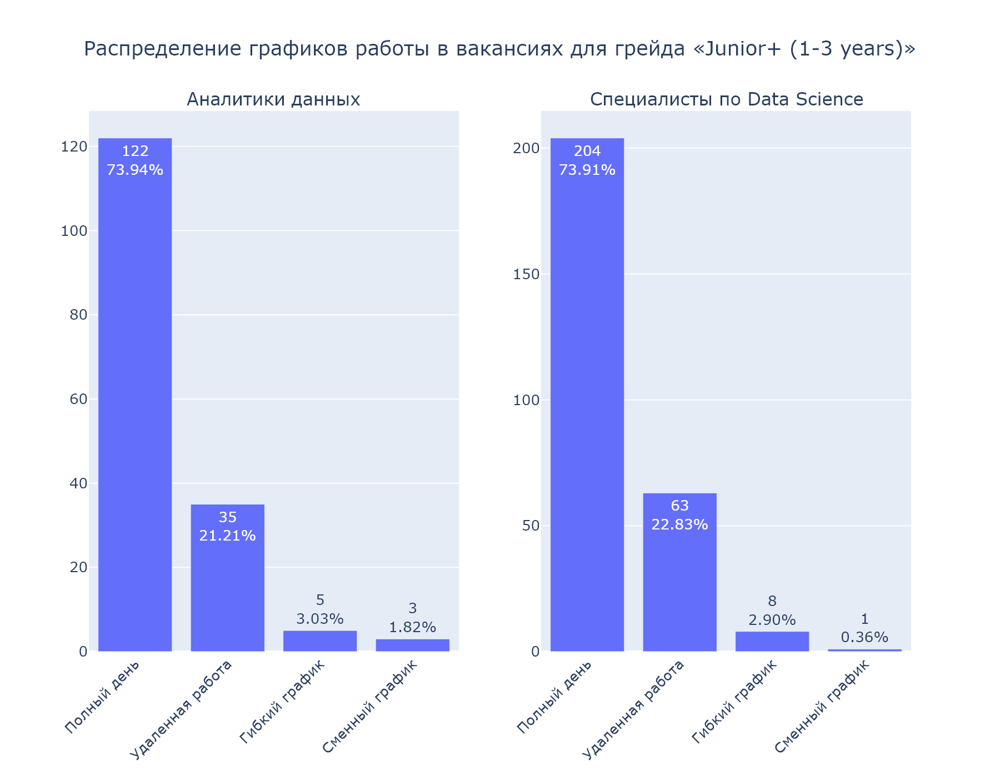

In [248]:
make_plot_schedule(schedule_da_junior_plus_table, schedule_ds_junior_plus_table, \
                  'Распределение графиков работы в вакансиях для грейда «Junior+ (1-3 years)»')

#### Оценим распределение типов занятостей в вакансиях аналитик данных и специалист по Data Science для грейда "Middle (3-6 years)"

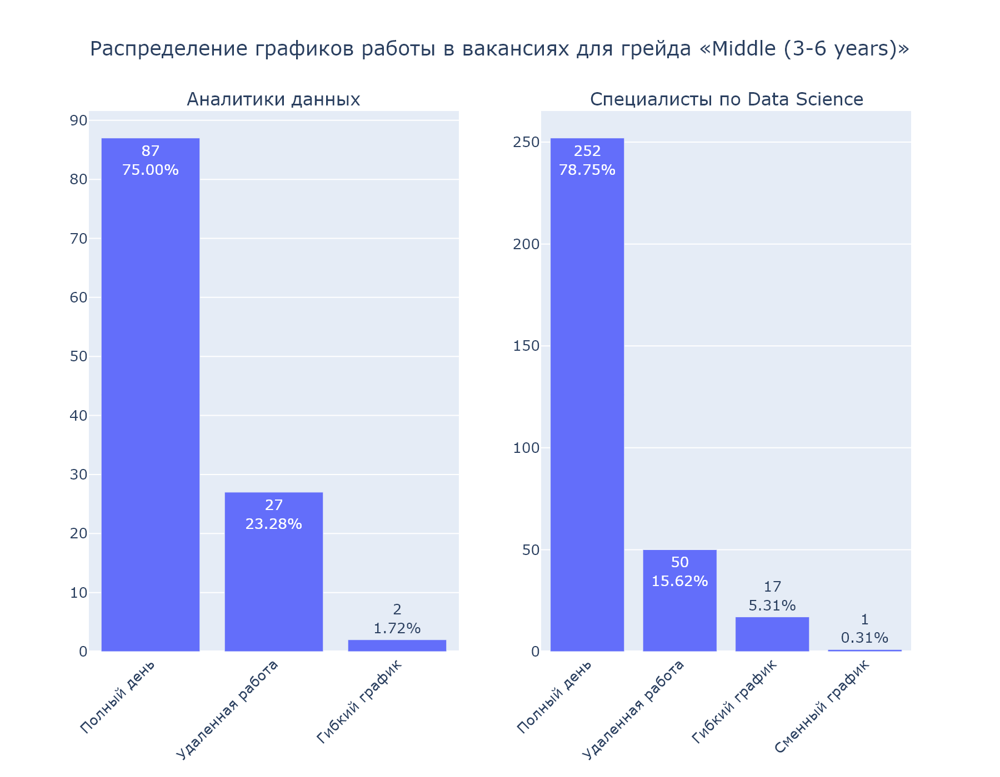

In [249]:
make_plot_schedule(schedule_da_middle_table, schedule_ds_middle_table, \
                   'Распределение графиков работы в вакансиях для грейда «Middle (3-6 years)»')

#### Оценим распределение графиков работы в вакансиях аналитик данных и специалист по Data Science для грейда "Senior (6+ years)"

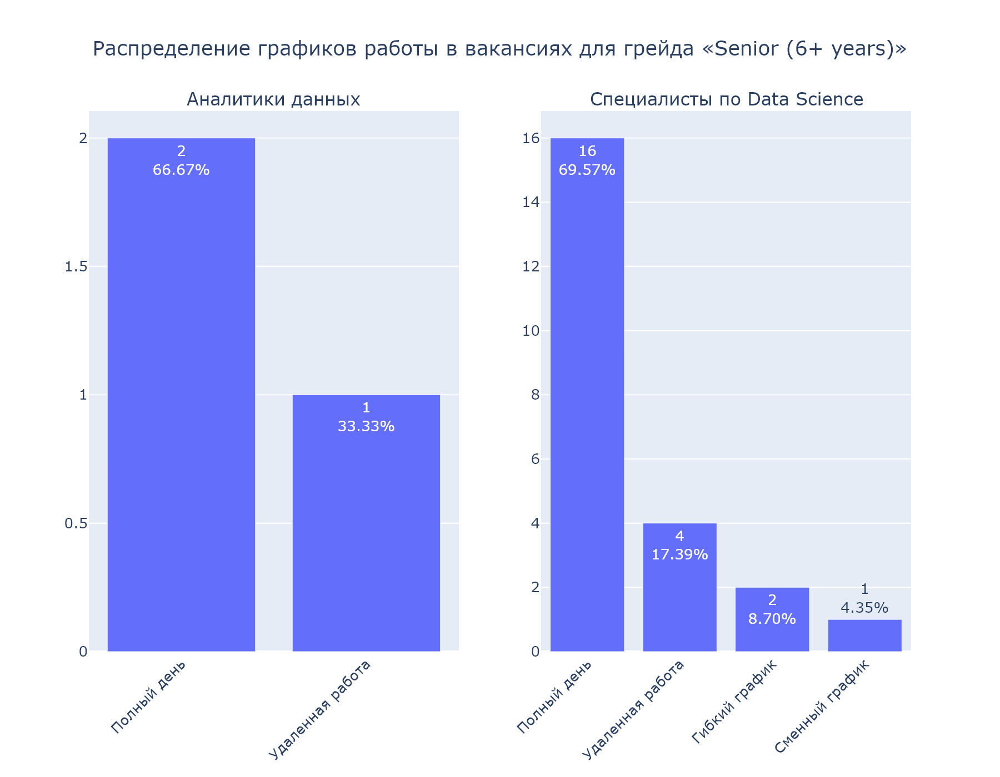

In [250]:
make_plot_schedule(schedule_da_senior_table, schedule_ds_senior_table, \
                   'Распределение графиков работы в вакансиях для грейда «Senior (6+ years)»')

#### Выводы по определению графика работы аналитиков данных и специалистов по Data Science

1. По графику работы у аналитиков данных и специалистов по Data Science преобладает полный день 219 вакансий аналитиков данных или 74,74% и 491 вакансия Data Science или 76,12%. Вторым по количество является удаленная работа - 63 вакансии аналитиков или 21,5% и 119 вакансий Data Science или 18,45%. Доля остальных графиков работы составляет менее 5%.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных представлено 8 вакансий на полный день или 88,89% и 1 вакансия на сменный график или 11,11%. У специалистов по Data Science представлено 19 вакансий на полный день или 73,08%, 5 вакансий на гибкий график или 19,23% и 2 вакансии на удаленную работу или 7,69%.
3. В разрезе грейда "Junior+ (1-3 years)" у аналитиков данных представлено 122 вакансии на полный день или 73,94% и 35 вакансий на удаленную работу или 21,21%. Доля остальных графиков работы составляет менее 5%. Аналогичная ситуация у специалистов по Data Science – 204 вакансии на полный день или 73,91% и 63 вакансии на удаленную работу или 22,83%.
4. В разрезе грейда"Middle (3-6 years)" у аналитиков данных представлено 87 вакансий на полный день или 75%, 27 вакансий на удаленную работу или 23,28% и 2 вакансии с гибким графиков или 1,72%. Аналогичная ситуация у специалистов по Data Science – 252 вакансии на полный день или 78,75%, 50 вакансий на удаленную работу или 15,62%, 17 вакансий на гибкий график или 5,31%. Также есть 1 вакансия на сменный график или 0,31%.
5. В разрезе грейда "Senior (6+ years)" у аналитиков данных представлено 2 вакансии на полный день или 66,67% и 1 вакансия на удаленную работу или 33,33%. У специалистов по Data Science представлено 16 вакансий на полный день или 69,57%, 4 вакансии на удаленную работу или 17,39 %, 2 вакансии на гибкий график или 8,7% и 1 вакансия на сменный график или 4,35%.

### Расчет и визуализация динамики размещения количества вакансий для аналитиков данных и специалистов по Data Science

#### Оценим минимальную и максимальную дату размещения вакансий аналитиков данных

In [251]:
vacancies_da['published_at'].agg({'min','max'})

max   2024-04-30 12:51:55
min   2024-03-06 08:13:00
Name: published_at, dtype: datetime64[ns]

#### Оценим минимальную и максимальную дату размещения вакансий специалистов по Data Science

In [252]:
vacancies_ds['published_at'].agg({'min','max'})

max   2024-04-30 11:41:03
min   2024-02-29 15:01:35
Name: published_at, dtype: datetime64[ns]

**Вывод**: Учитывая, что диапазон публикации размещенных вакансий для аналитиков данных и специастов по Data Science составляет около 2 месяцев, наилучшим вариантов будет расчет и визуализации недельной динамики их размещения.

#### Создадим новый столбец first_day_of_week, который будет означать первый день недели размещения вакансии для аналитиков данных и оценим результат добавления

In [253]:
vacancies_da['first_day_of_week'] = (vacancies_da['published_at'].dt.floor('D') - \
                                     vacancies_da['published_at'].apply(lambda x: pd.Timedelta(days=x.weekday()))).dt.date
vacancies_da.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,86081569,87407185
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth"""
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-04-27 23:34:50,2024-04-02 17:03:10
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),IQnergy,Okko
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Санкт-Петербург
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']"


#### Создадим новый столбец first_day_of_week, который будет означать первый день недели размещения вакансии для специалистов по Data Science и оценим результат добавления

In [254]:
vacancies_ds['first_day_of_week'] = (vacancies_ds['published_at'].dt.floor('D') - \
                                     vacancies_ds['published_at'].apply(lambda x: pd.Timedelta(days=x.weekday()))).dt.date
vacancies_ds.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,81857296,81857358
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-08 16:28:05
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Университет Иннополис,Университет Иннополис
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,NaN
area,Москва,Москва,Санкт-Петербург,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе..."


#### Построим сводную таблицу методом crosstab() со следующими столбцами:
    first_day_of_week - первый день недели размещения вакансий;
    count_first_day_of_week - количество вакансий аналитиков данных размещенных в эту неделю.

In [255]:
crosstab_published_at = pd.crosstab(index=vacancies_da['first_day_of_week'] , columns=['count_first_day_of_week']).\
reset_index()
crosstab_published_at.columns = ['first_day_of_week', 'count_first_day_of_week']
crosstab_published_at = crosstab_published_at.sort_values(by = 'first_day_of_week').reset_index(drop=True)
crosstab_published_at

,first_day_of_week,count_first_day_of_week
0,2024-03-04,5
1,2024-03-11,17
2,2024-03-18,24
3,2024-03-25,31
4,2024-04-01,32
5,2024-04-08,36
6,2024-04-15,57
7,2024-04-22,77
8,2024-04-29,14


#### Создадим функцию, которая будет строить данную сводную таблицу в зависимоти от изучаемого датафрейма

In [256]:
def make_pivot_published(dataset1):

    crosstab_published_at = pd.crosstab(index=dataset1['first_day_of_week'] , columns=['count_first_day_of_week']).\
    reset_index()
    crosstab_published_at.columns = ['first_day_of_week', 'count_first_day_of_week']
    crosstab_published_at = crosstab_published_at.sort_values(by = 'first_day_of_week').reset_index(drop=True)
    return crosstab_published_at

#### Создадим переменную published_da_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для аналитиков данных

In [257]:
published_da_table = make_pivot_published(vacancies_da)

#### Создадим переменную published_ds_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для специалистов по Data Science

In [258]:
published_ds_table = make_pivot_published(vacancies_ds)

#### Создадим отфильтрованный датарфейм published_da_junior куда войдут вакансии аналитиков данных с грейдом "Junior (no experince)"

In [259]:
published_da_junior = vacancies_da.query('experience == "Junior (no experince)"').reset_index(drop=True)
published_da_junior.head().T

,0,1,2,3,4
id,92070271,92361982,92803313,95909533,96508339
name,Младший аналитик данных (Junior Data Analyst),Junior Data Analyst,Data analyst (Junior),Data Analyst,Data Analyst / Аналитик данных
published_at,2024-03-18 22:41:00,2024-03-29 17:17:56,2024-04-27 03:24:53,2024-04-01 16:54:03,2024-04-30 11:25:47
alternate_url,https://hh.ru/vacancy/92070271,https://hh.ru/vacancy/92361982,https://hh.ru/vacancy/92803313,https://hh.ru/vacancy/95909533,https://hh.ru/vacancy/96508339
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,СБЕР,"РЕСО-Гарантия, САО",DNS Технологии,ANCOR,Альфа Капитал
department,Сбер для экспертов,"РЕСО-Гарантия, САО, IT",NaN,NaN,NaN
area,Москва,Москва,Владивосток,Москва,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,[],['Аналитическое мышление'],"['Pandas', 'Metabase', 'Python', 'Финансовая а...",[],"['Pandas', 'PowerBI', 'apache airflow', 'junio..."


#### Создадим отфильтрованный датарфейм published_ds_junior куда войдут вакансии специалистов по Data Science с грейдом "Junior (no experince)"

In [260]:
published_ds_junior = vacancies_ds.query('experience == "Junior (no experince)"').reset_index(drop=True)
published_ds_junior.head().T

,0,1,2,3,4
id,91583978,94232482,94502217,94620284,94710567
name,Assistant Professor - Data Science&AI (english),Стажер Data scientist,Стажер Data Scientist (MTS AI),Data Science специалист,Data Scientist NLP
published_at,2024-04-13 11:14:10,2024-03-04 21:40:15,2024-03-11 10:26:00,2024-03-31 16:05:21,2024-03-13 17:49:04
alternate_url,https://hh.ru/vacancy/91583978,https://hh.ru/vacancy/94232482,https://hh.ru/vacancy/94502217,https://hh.ru/vacancy/94620284,https://hh.ru/vacancy/94710567
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,СБЕР,МТС,СБЕР,СБЕР
department,NaN,Сбер. IT,«МТС»,Сбер. IT,Сбер для экспертов
area,Казань,Москва,Москва,Воронеж,Москва
experience,Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince),Junior (no experince)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['SQL', 'Python']",[],[],"['Pandas', 'Документация', 'confluence']"


#### Создадим отфильтрованный датарфейм published_da_junior_plus куда войдут вакансии аналитиков данных с грейдом "Junior+ (1-3 years)"

In [261]:
published_da_junior_plus = vacancies_da.query('experience == "Junior+ (1-3 years)"').reset_index(drop=True)
published_da_junior_plus.head().T

,0,1,2,3,4
id,82978778,85053195,85053196,88605313,89426458
name,Data analyst,System analyst DWH / Data Analyst,System analyst DWH / Data Analyst,Data Analyst,Ведущий дата аналитик
published_at,2024-04-09 10:29:02,2024-04-08 09:37:50,2024-04-08 09:37:50,2024-03-12 21:40:27,2024-04-22 14:12:37
alternate_url,https://hh.ru/vacancy/82978778,https://hh.ru/vacancy/85053195,https://hh.ru/vacancy/85053196,https://hh.ru/vacancy/88605313,https://hh.ru/vacancy/89426458
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Телеком биржа,Axenix (ранее Accenture),Axenix (ранее Accenture),Бланк – банк для бизнеса,RUTUBE
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Краснодар,Ростов-на-Дону,Москва,Москва
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['HTTP', 'Pandas', 'Linux', 'Git', 'Clickhouse...","['DWH', 'Документация', 'Витрины данных', 'Inf...","['DWH', 'Документация', 'Витрины данных', 'Gre...","['PowerBI', 'BigQuery', 'Tableau', 'ORACLE', '...","['Google Analytics', 'Анализ данных', 'Tableau..."


#### Создадим отфильтрованный датарфейм published_ds_junior_plus куда войдут вакансии специалистов по Data Science с грейдом "Junior+ (1-3 years)"

In [262]:
published_ds_junior_plus = vacancies_ds.query('experience == "Junior+ (1-3 years)"').reset_index(drop=True)
published_ds_junior_plus.head().T

,0,1,2,3,4
id,81857296,81857358,86018279,87192229,87400111
name,Assistant Professor - Data Science&AI (english),Assistant Professor - Data Science&AI (english),Middle \ Senior Data Scientist в команду модел...,Middle \ Senior Data scientist (команды CRM и ...,Data Scientist
published_at,2024-04-08 16:28:05,2024-04-08 16:28:05,2024-04-23 17:15:40,2024-04-15 12:05:32,2024-03-25 08:45:08
alternate_url,https://hh.ru/vacancy/81857296,https://hh.ru/vacancy/81857358,https://hh.ru/vacancy/86018279,https://hh.ru/vacancy/87192229,https://hh.ru/vacancy/87400111
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Университет Иннополис,Университет Иннополис,Банк ВТБ (ПАО),Банк ВТБ (ПАО),Совкомбанк
department,NaN,NaN,"ПАО ВТБ, Технологический блок","ПАО ВТБ, Технологический блок",NaN
area,Москва,Санкт-Петербург,Москва,Москва,Казань
experience,Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years),Junior+ (1-3 years)
key_skills,"['Machine Learning', 'Public Speaking', 'Презе...","['Machine Learning', 'Public Speaking', 'Презе...","['Документация', 'R', 'Python', 'Креативность'...","['Документация', 'Spark', 'confluence', 'Pytho...","['Pandas', 'pytorch', 'tensorflow', 'Базы данн..."


#### Создадим отфильтрованный датарфейм published_da_middle куда войдут вакансии аналитиков данных с грейдом "Middle (3-6 years)"

In [263]:
published_da_middle = vacancies_da.query('experience == "Middle (3-6 years)"').reset_index(drop=True)
published_da_middle.head().T

,0,1,2,3,4
id,86081569,87407185,89163933,90430340,90495132
name,Data analyst / Аналитик данных,"Senior Data Analyst ""Growth""",Data Analyst WMS,Senior Data analyst,Data analyst
published_at,2024-04-27 23:34:50,2024-04-02 17:03:10,2024-04-02 17:52:09,2024-04-30 10:50:09,2024-04-06 08:44:30
alternate_url,https://hh.ru/vacancy/86081569,https://hh.ru/vacancy/87407185,https://hh.ru/vacancy/89163933,https://hh.ru/vacancy/90430340,https://hh.ru/vacancy/90495132
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,IQnergy,Okko,«UZUM TECHNOLOGIES».,Ок Софт,МедиаСофт
department,NaN,NaN,NaN,NaN,NaN
area,Москва,Санкт-Петербург,Москва,Москва,Санкт-Петербург
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['Pandas', 'Анализ данных']","['A/B тесты', 'confluence', 'SQL', 'Python']",[],"['Решение проблем', 'Юнит-экономика', 'Приняти...","['Pandas', 'Data Analysis', 'Spark', 'Python',..."


#### Создадим отфильтрованный датарфейм published_ds_middle куда войдут вакансии специалистов по Data Science с грейдом "Middle (3-6 years)"

In [264]:
published_ds_middle = vacancies_ds.query('experience == "Middle (3-6 years)"').reset_index(drop=True)
published_ds_middle.head().T

,0,1,2,3,4
id,67411146,78465611,81857265,83575438,86879304
name,"Ведущий Data Scientist, Ранжирование поиска",Управляющий директор \ Data Scientist (Сопрово...,Associate Professor - Data Science&AI (english),Senior Data Scientist в команду «Матчинг»,Data scientist (команда Collection)
published_at,2024-04-02 11:20:17,2024-04-27 10:10:12,2024-04-08 16:28:05,2024-04-25 14:18:46,2024-04-23 17:15:53
alternate_url,https://hh.ru/vacancy/67411146,https://hh.ru/vacancy/78465611,https://hh.ru/vacancy/81857265,https://hh.ru/vacancy/83575438,https://hh.ru/vacancy/86879304
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Ozon,Банк ВТБ (ПАО),Университет Иннополис,Профи (profi.ru),Банк ВТБ (ПАО)
department,Ozon Информационные технологии,"ПАО ВТБ, Технологический блок",NaN,NaN,"ПАО ВТБ, Технологический блок"
area,Москва,Москва,Санкт-Петербург,Москва,Москва
experience,Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years),Middle (3-6 years)
key_skills,"['IT', 'Разработка поисковых технологий', 'dat...","['Оценка рисков', 'Управление рисками', 'MS Po...","['Machine Learning', 'Public Speaking', 'Writi...","['PHP', 'Spark', 'Базы данных', 'Python', 'Ela...","['Документация', 'Python', 'Big Data', 'ML', '..."


#### Создадим отфильтрованный датарфейм published_da_senior куда войдут вакансии аналитиков данных с грейдом "Senior (6+ years)"

In [265]:
published_da_senior = vacancies_da.query('experience == "Senior (6+ years)"').reset_index(drop=True)
published_da_senior.head().T

,0,1,2
id,97432876,97432884,98138306
name,Middle+/Senior Data Analyst в Data Accelerator,Product Data analyst (управление товарными пот...,Data Analyst
published_at,2024-04-28 14:08:20,2024-04-28 14:08:26,2024-04-29 16:17:24
alternate_url,https://hh.ru/vacancy/97432876,https://hh.ru/vacancy/97432884,https://hh.ru/vacancy/98138306
type,Открытая,Открытая,Открытая
employer,Леруа Мерлен,Леруа Мерлен,Reinvent Baltics
department,Леруа Мерлен. Центральный офис,ИТ,NaN
area,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Pandas', 'Документация', 'confluence', 'Pyth...","['Проактивность', 'SQL', 'Python', 'Аналитичес...","['Английский язык', 'Data Analysis', 'Решение ..."


#### Создадим отфильтрованный датарфейм published_ds_senior куда войдут вакансии специалистов по Data Science с грейдом "Senior (6+ years)"

In [266]:
published_ds_senior = vacancies_ds.query('experience == "Senior (6+ years)"').reset_index(drop=True)
published_ds_senior.head().T

,0,1,2,3,4
id,90637679,91757000,94041966,94697153,94706965
name,Senior Data Scientist/Team Lead,Data scientist CV (senior),Python разработчик Data Science,Senior Data Scientist,Senior Data Scientist
published_at,2024-03-06 11:16:51,2024-03-21 10:27:39,2024-02-29 15:01:35,2024-04-10 08:49:52,2024-03-13 17:26:05
alternate_url,https://hh.ru/vacancy/90637679,https://hh.ru/vacancy/91757000,https://hh.ru/vacancy/94041966,https://hh.ru/vacancy/94697153,https://hh.ru/vacancy/94706965
type,Открытая,Открытая,Открытая,Открытая,Открытая
employer,Гудфокаст,"РУСАЛ, Центр подбора персонала",Appfox,СБЕР,СБЕР
department,NaN,NaN,NaN,Сбер. IT,Сбер для экспертов
area,Москва,Москва,Москва,Москва,Москва
experience,Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years),Senior (6+ years)
key_skills,"['Machine Learning', 'Linux', 'Python', 'Машин...","['OCR', 'Data Science', 'OpenCV']",[],"['Английский язык', 'C++', 'Linux', 'Python', ...",[]


#### Создадим переменную published_da_junior_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для аналитиков данных для грейда "Junior (no experince)"

In [267]:
published_da_junior_table = make_pivot_published(published_da_junior)

#### Создадим переменную published_ds_junior_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для специалистов по Data Science для грейда "Junior (no experince)"

In [268]:
published_ds_junior_table = make_pivot_published(published_ds_junior)

#### Создадим переменную published_da_junior_plus_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для аналитиков данных для грейда "Junior+ (1-3 years)"

In [269]:
published_da_junior_plus_table = make_pivot_published(published_da_junior_plus)

#### Создадим переменную published_ds_junior_plus_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для специалистов по Data Science для грейда "Junior+ (1-3 years)"

In [270]:
published_ds_junior_plus_table = make_pivot_published(published_ds_junior_plus)

#### Создадим переменную published_da_middle_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для аналитиков данных для грейда "Middle (3-6 years)"

In [271]:
published_da_middle_table = make_pivot_published(published_da_middle)

#### Создадим переменную published_ds_middle_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для специалистов по Data Science для грейда "Middle (3-6 years)"

In [272]:
published_ds_middle_table = make_pivot_published(published_ds_middle)

#### Создадим переменную published_da_senior_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для аналитиков данных для грейда "Senior (6+ years)"

In [273]:
published_da_senior_table = make_pivot_published(published_da_senior)

#### Создадим переменную published_ds_senior_table и присвоим ей результат функции make_pivot_published для расчета недельной динамики размещения вакансий для специалистов по Data Science для грейда "Senior (6+ years)"

In [274]:
published_ds_senior_table = make_pivot_published(published_ds_senior)

#### Построим график динамики количества публикаций вакансий по неделям для аналитиков данных и специалистов по Data Science

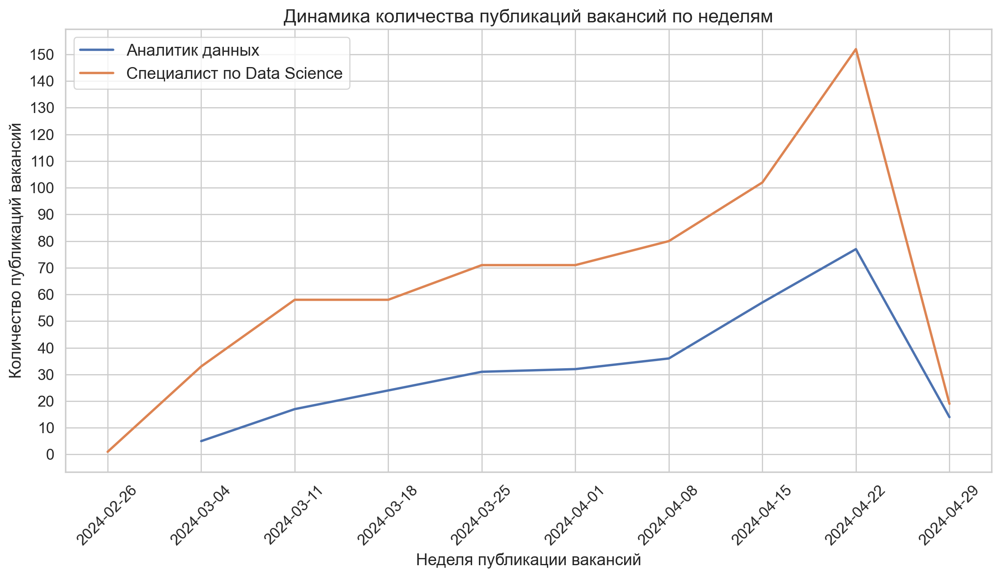

In [275]:
sns.set(style="whitegrid")
fig, ax = plt.subplots(figsize=(12, 7), dpi=200)

sns.lineplot(x='first_day_of_week', y='count_first_day_of_week', data=published_da_table, palette="Set1", ax=ax, \
             label='Аналитик данных', linewidth=2)
ax.set_xlabel('Неделя публикации вакансий', fontsize=14)
ax.set_ylabel('Количество публикаций вакансий', fontsize=14)
ax.set_title('Динамика количества публикаций вакансий по неделям', fontsize=16)
ax.set_xticks(ticks=published_da_table['first_day_of_week'])
ax.tick_params(axis='both', which='major', labelsize=13)
ax.tick_params(axis='x', rotation=45)

sns.lineplot(x='first_day_of_week', y='count_first_day_of_week', data=published_ds_table, palette="Set2", ax=ax, \
             label='Специалист по Data Science', linewidth=2)
ax.set_xticks(ticks=published_ds_table['first_day_of_week'])
plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(10))

ax.legend(fontsize=14)

plt.tight_layout()
plt.show()

#### Создадим функцию для построения графиков для аналитиков данных и специалистов по Data Science

In [276]:
def make_lineplot(dataset1, dataset2, step, title1):

    sns.set(style="whitegrid")
    fig, ax = plt.subplots(figsize=(12, 7), dpi=200)

    sns.lineplot(x='first_day_of_week', y='count_first_day_of_week', data=dataset1, palette="Set1", ax=ax, \
                 label='Аналитик данных', linewidth=2)
    ax.set_xlabel('Неделя публикации вакансий', fontsize=14)
    ax.set_ylabel('Количество публикаций вакансий', fontsize=14)
    ax.set_title(title1, fontsize=16)
    ax.set_xticks(ticks=dataset1['first_day_of_week'])
    ax.tick_params(axis='both', which='major', labelsize=13)
    ax.tick_params(axis='x', rotation=45)

    sns.lineplot(x='first_day_of_week', y='count_first_day_of_week', data=dataset2, palette="Set2", ax=ax, \
                 label='Специалист по Data Science', linewidth=2)
    ax.set_xticks(ticks=dataset2['first_day_of_week'])
    plt.gca().yaxis.set_major_locator(ticker.MultipleLocator(step))

    ax.legend(fontsize=14)

    return plt.tight_layout()

#### Построим график динамики количества публикаций вакансий по неделям для аналитиков данных и специалистов по Data Science для грейда "Junior (no experince)"

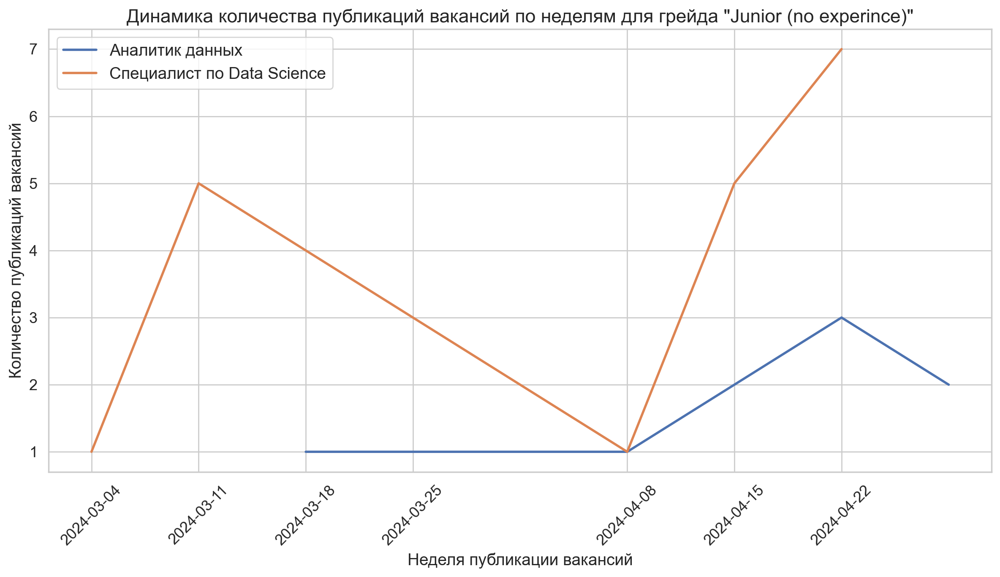

In [277]:
make_lineplot(published_da_junior_table, published_ds_junior_table, 1, \
              'Динамика количества публикаций вакансий по неделям для грейда "Junior (no experince)"')

#### Построим график динамики количества публикаций вакансий по неделям для аналитиков данных и специалистов по Data Science для грейда "Junior+ (1-3 years)"

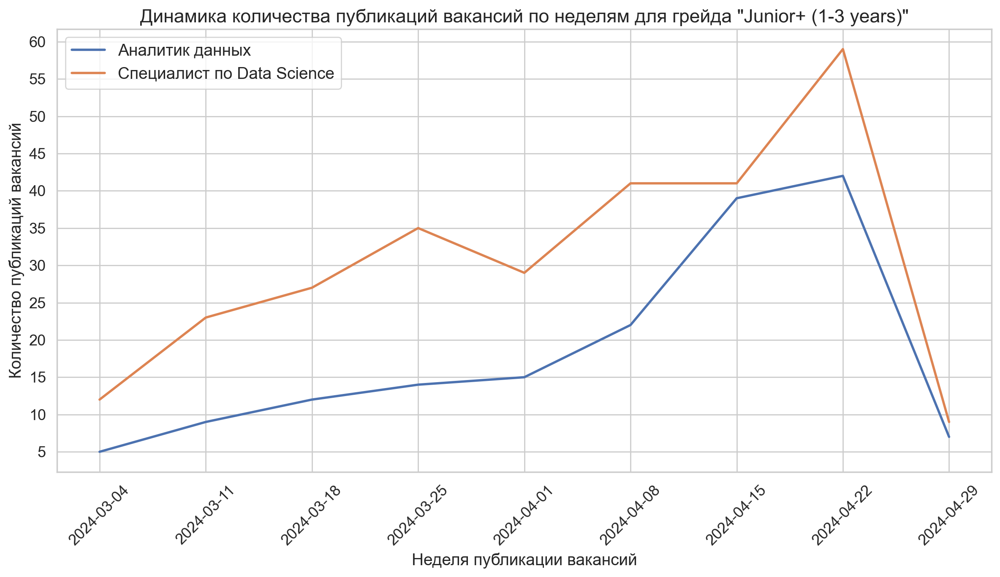

In [278]:
make_lineplot(published_da_junior_plus_table, published_ds_junior_plus_table, 5, \
              'Динамика количества публикаций вакансий по неделям для грейда "Junior+ (1-3 years)"')

#### Построим график динамики количества публикаций вакансий по неделям для аналитиков данных и специалистов по Data Science для грейда "Middle (3-6 years)"

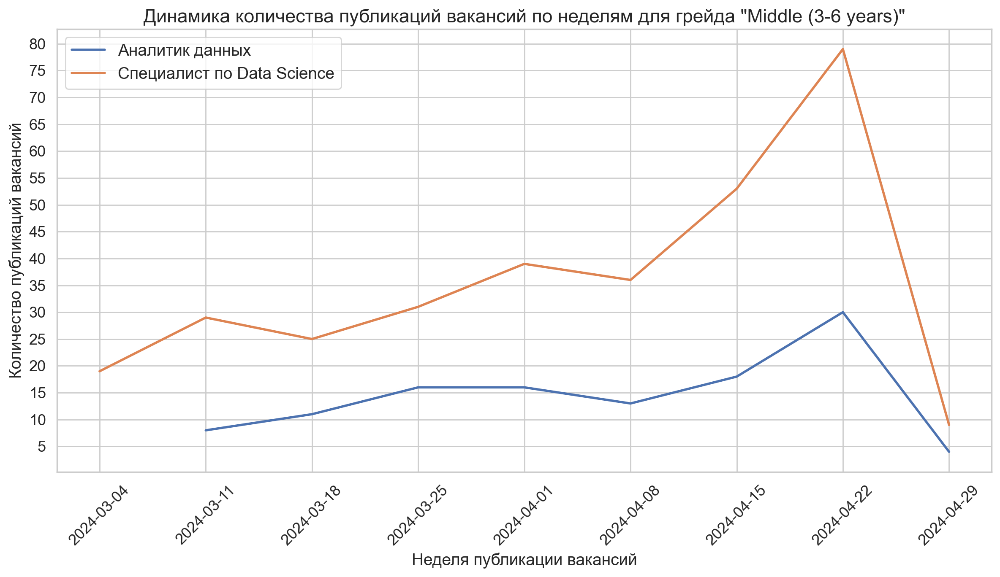

In [279]:
make_lineplot(published_da_middle_table, published_ds_middle_table, 5, \
              'Динамика количества публикаций вакансий по неделям для грейда "Middle (3-6 years)"')

#### Построим график динамики количества публикаций вакансий по неделям для аналитиков данных и специалистов по Data Science для грейда "Senior (6+ years)"

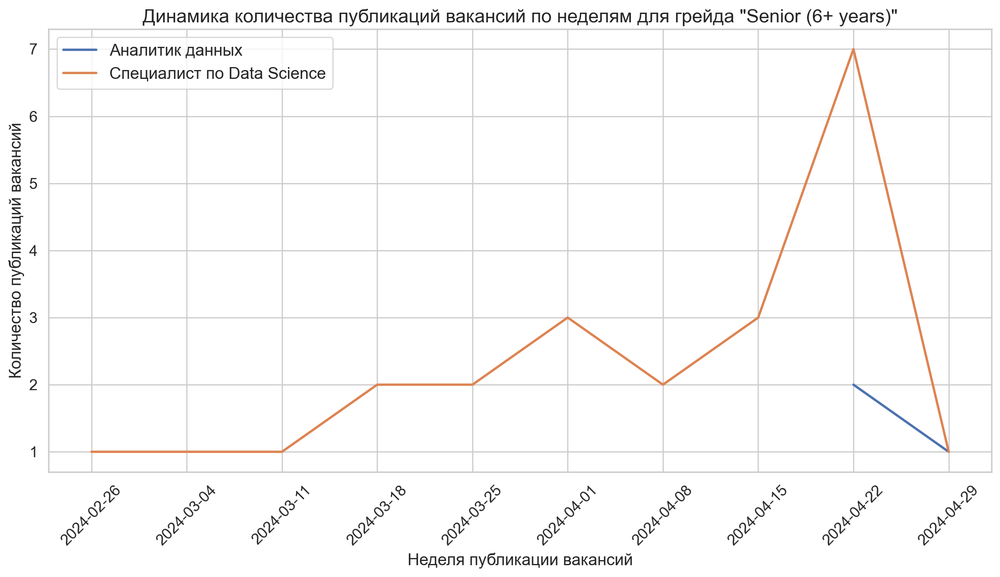

In [280]:
make_lineplot(published_da_senior_table, published_ds_senior_table, 1, \
              'Динамика количества публикаций вакансий по неделям для грейда "Senior (6+ years)"')

#### Выводы по динамике размещения количества вакансий для аналитиков данных и специалистов по Data Science

1. Вакансии аналитиков данных были опубликованы с 06.03.2024 по 30.04.2024. Вакансии специалистов по Data Science были опубликованы с 29.02.2024 по 30.04.2024.
2. Судя по динамике публикаций, количество опубликованных вакансий постоянно росло с начала марта 2024 для аналитиков данных и конца февраля 2024 для специалистов по Data Science и до конца апреля и достигло пика в 77 вакансий аналитиков и 152 вакансии Data Science в неделю с 22 по 28.04.2024. В последнюю неделю апреля с 29.04 по 05.05.2024 количество публикаций резко снизилось до 14 публикаций аналитиков и 19 публикаций Data Science. Это может быть связано с тем, что в выборке приведены вакансии до 30.04.2024, то есть всего за 2 дня данной недели. Также это может быть связано с тем, что 29 и 30.04.2024 – это официальные праздничные дни в России и активность HR, отвечающих за публикацию вакансий была явно снижена.
3. В разрезе грейда "Junior (no experince)" вакансии специалистов по Data Science начали публиковаться в начале марта 2024. Выделяются 2 пика. Неделя с 11.03.2024 – 5 вакансий, далее спад и пик в 7 вакансий на неделе с 22.04.2024. Вакансии аналитиков данных публиковались не каждую неделю начиная середины марта буквально по одной штуке с пиков во второй половине марта 2024 в 3 вакансии.
4. В разрезе грейда "Junior+ (1-3 years)" наблюдаем практически постоянный рост числа публикаций вакансий как у аналитиков данных, так и у специалистов Data Science с пиком в 42 вакансии аналитиков и 59 вакансий Data Science на неделе с 22 по 28.04.2024. Далее резкий спад в последней неделе до 7 и 9 вакансии соответственно.
5. В разрезе грейда "Middle (3-6 years)" вакансии специалистов по Data Science начали публиковаться в начале марта 2024. Вакансии аналитиков данных примерно с середины марта 2024 года. Также наблюдаем практически постоянный рост числа публикаций с пиком 30 вакансий аналитиков данных и 79 вакансий Data Science и последующий резкий спад.
6. В разрезе грейда "Senior (6+ years)" вакансии специалистов по Data Science начали публиковаться с конца февраля 2024 и до конца апреля в единичных экземплярах. Наблюдаем 2 явных пика на начало апреля в 3 вакансии и 7 вакансий во второй половине апреля с резким спадов в последней неделе апреля 2024 года. Вакансии аналитиков начали публиковаться только во второй половине апреля и до конца апреля 2024 года.

### Выводы по исследовательскому анализу данных

#### Определение доли грейдов аналитиков данных и специалистов по Data Science

1. Всего представлено 293 вакансии Аналитик данных и 645 вакансий Специалист по Data Science.
2. Вакансии разделены на грейды "Junior (no experince)", "Junior+ (1-3 years)", "Middle (3-6 years)" и "Senior (6+ years)".
3. Для аналитиков данных больше всего вакансий имеется для грейда "Junior+ (1-3 years)" - 165 вакансий или 56,31%, второй по количеству грейд - "Middle (3-6 years)" - 116 вакансий или 39,59%. Доля остальных грейдов не превышает 5%.
4. Для специалистов по Data Science больше всего вакансий имеется для грейда "Middle (3-6 years)" - 320 вакансий или 49,61%, второй по количеству грейд - "Junior+ (1-3 years)" - 276 вакансий или 42,79%. Доля остальных грейдов не превышает 5%.

#### Определение хард и софт скиллов аналитиков данных и специалистов по Data Science

##### Хард скиллы аналитиков данных

1. Самым распространенным хард скилами в топ 15 для аналитиков данных является SQL. Далее идут такие хард скилы как Python и его библиотеки как Pandas, знание BI систем, в частности Power BI и Tableau, работа с большим объемом информации, знание A/B тестирования, MS Excel, математическая статистика, Apache Airflow и умение проводить аналитические исследования и статистический анализ данных.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных такой хард скилл как Python находится выше чем SQL. Также появляются такие скиллы как Scikit-learn, финансовая аналитика, структуры данных, математическое моделирование и metabase. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)"  у аналитиков данных в топ 15 также выделяются такие хард скилы как английский язык и математический анализ. При этом роль такого хард скила как MS Excel становится немного выше.
4. В разрезе грейда "Middle (3-6 years)"  у аналитиков данных в топ 15 также выделяются такие хард скиллы как Apache Spark, Apache Airflow.
5. В разрезе грейда "Senior (6+ years)"  у аналитиков данных в топ 15 также выделяются такие хард скиллы как статистический анализ, статистика, прогнозирование, бизнес-анализ, исследовательский анализ данных, Data Warehousing, анализ рынка и прогнозирование. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Хард скиллы специалистов по Data Science

1. Самым распространенными хард скилами в топ 15 для специалистов по Data Science является Python и его библиотеки, такие как Pandas и Numpy, SQL, PyTorch, работа с большим объемом информации, обработка естественного языка или NLP, математическая статистика, Apache Spark, работа c Git, Hadoop, знание английского языка, математическое моделирование, компьютерное зрение и знание библиотеки scikit-learn для машинного обучения.
2. В разрезе грейда "Junior (no experince)" у специалистов по Data Science также выделяются такие хард скиллы как Data Mining, разработка поисковых технологий, прогнозирование и написание статей.
3. В разрезе грейда "Junior+ (1-3 years)"  у специалистов по Data Science топ 15 хард скиллов являются почти такими же как и в общем списке с небольшим изменение по ранжированию и отсутствию в топе такого скилла как Hadoop.
4. В разрезе грейда "Middle (3-6 years)"  у специалистов по Data Science в топ 15 также выделяются такие хард скиллы как Docker и Linux.
5. В разрезе грейда "Senior (6+ years)"  у специалистов по Data Science в топ 15 также выделяются такие хард скиллы как TensorFlow, A/B тестирование, Recommender Systems, Ulift modeling, Churn prediction и LTV prediction.

##### Софт скиллы аналитиков данных

1. Самым распространенными софт скилами в топ 10 для аналитиков является документация, аналитическое мышление, коммуникация, проактивность,  переговоры, работа в команде, принятие решений, решение проблем, презентация результатов и креативность.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных софт скиллы совпадают с основным списком. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)"  у аналитиков данных в топ 10 также выделяются такие софт скилы как работа в условиях многозадачности и грамотная речь и письмо.
4. В разрезе грейда "Middle (3-6 years)"  у аналитиков данных в топ 10 также выделяются такие софт скиллы как планирование, деловая коммуникация, организаторские навыки, лидерство и критическое мышление.
5. В разрезе грейда "Senior (6+ years)"  у аналитиков данных в топ 10 также выделяется такой софт скилл как внимание к деталям. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Софт скиллы специалистов по Data Science

1. Самым распространенными софт скилами в топ 10 для специалистов по Data Science является документация, коммуникация, аналитическое мышление, креативность, проактивность презентация результатов, планирование карьеры, умение планировать, управление командой и принятие решений.
2. В разрезе грейда "Junior (no experince)" для специалистов по Data Science также выделяется такой софт скилл как обучение и развитие.
3. В разрезе грейда "Junior+ (1-3 years)" для специалистов по Data Science в топ 10 также выделяются такие софт скилы как деловая коммуникация и грамотность.
4. В разрезе грейда "Middle (3-6 years)" для специалистов по Data Science в топ 10 также выделяются такие софт скиллы как работа в команде, принятие решений, лидерство, внимание к деталям и адаптивность.
5. В разрезе грейда "Senior (6+ years)" для специалистов по Data Science в топ 10 также выделяются такие софт скиллы как организаторские навыки, мотивация персонала и коммуникабельность.

#### Типичное место работы

##### Типичное место работы для вакансий аналитик данных

1. Типичным местом работы аналитиков данных является Сбербанк. Представлено 64 вакансии или 21,84%. Также выделяются такие работодатели как WILDBERRIES, МТС, МАГНИТ, Розничная сеть и Okko. Доля остальных работодателей составляет менее 2%.
2. В разрезе грейда "Junior (no experince)" типичным местом работы аналитиков данных является Ресо – Гарантия. При этом стоит отметить, что в датафрейме представлено всего 9 таких вакансий или 3,07 % и сделать выводы на основе этих данных достаточно сложно.
3. В разрезе грейда "Junior+ (1-3 years)" типичным местом для аналитиков данных также является Сбербанк – 40 вакансий или 24,24 % от вакансий этого грейда. Также выделяются такие работодатели как МТС, МАГНИТ - Розничная сеть, ПСБ (ПАО «Промсвязьбанк»), Okko и StudyWorld. Доля остальных работодателей составляет менее 2%.
4. В разрезе грейда "Middle (3-6 years)" типичным местом для аналитиков данных также является Сбербанк – 23 вакансии или 19,83% от вакансий этого грейда. Также выделяются такие работодатели как WILDBERRIES, «UZUM TECHNOLOGIES» и Maxim technology. Доля остальных работодателей составляет менее 2%.
5. В разрезе грейда "Senior (6+ years)" типичным местом работы аналитиков данных является Леруа Мерлен. При этом стоит отметить, что в датафрейме представлено всего 3 таких вакансий или 1,02 % и сделать выводы на основе этих данных достаточно сложно.

##### Типичное место работы для вакансий специалист по Data Science

1. Типичным местом работы специалистов по Data Science является Сбербанк. Представлено 129 вакансии или 20%. Также выделяются такие работодатели как Ozon, Газпромбанк и Samokat.tech. Доля остальных работодателей составляет менее 2%.
2. В разрезе грейда "Junior (no experince)" типичным местом работы для специалистов по Data Science является Сбербанк 9 вакансий или 34,62%. Также выделяются такие работодатели как Ozon, правительство Москвы и Lamoda Tech. Остальные работодатели представлены по одной вакансии.
3. В разрезе грейда "Junior+ (1-3 years)" типичным местом для специалистов по Data Science также является Сбербанк – 58 вакансий или 21,01 % от вакансий этого грейда. Также выделяются такие работодатели как Ростелеком и Банк ВТБ. Доля остальных работодателей составляет менее 3%.
4. В разрезе грейда "Middle (3-6 years)" типичным местом для специалистов по Data Science также является Сбербанк – 60 вакансии или 18,75% от вакансий этого грейда. Также выделяются такие работодатели как Ozon и Газпромбанк. Доля остальных работодателей составляет менее 3%.
5. В разрезе грейда "Senior (6+ years)" типичным местом работы для специалистов по Data Science является Сбербанк наравне с Aramco Innovations, Fundraise Up и Sape – 2 вакансии или 8,7%. Доля остальных вакансий составляет менее 5 % по одной вакансии.

#### Анализ зарплат в вакансиях аналитик данных и специалист по Data Science

1. Медианная зарплата аналитиков данных составляет от 150 до 200 тысяч рублей. Медианная зарплата специалистов по Data Science составляет от 150 до 300 тысяч рублей. При этом у нас имеется не более 10 % данных по нижним и верхним границам зарплат аналитиков данных и специалистов по Data Science. Исходя из этого выводы по зарплате данных специалистов делать достаточно сложно.
2. В разрезе грейда "Junior (no experince)" представлены единичные данные по зарплате или вовсе отсутствующие. Исходя из этого делать какие-либо выводы по зарплате специалистов данного грейда вообще не имеет смысла.
3. В разрезе грейда "Junior+ (1-3 years)" медианная зарплата аналитиков данных составляет от 150 до 200 тысяч рублей. Медианная  зарплата специалистов по Data Science составляет от 130 до 250 тысяч рублей.
4. В разрезе грейда "Middle (3-6 years)" медианная зарплата аналитиков данных составляет от 200 до 400 тысяч рублей. Медианная зарплата специалистов по Data Science составляет от 200 до 300 тысяч рублей.
5. В разрезе грейда "Senior (6+ years)" представлены единичные данные по зарплате или вовсе отсутствующие. Исходя из этого делать какие-либо выводы по зарплате специалистов данного грейда вообще не имеет смысла.

#### Определение типа занятости аналитиков данных и специалистов по Data Science

1. У аналитиков данных и специалистов по Data Science преобладает полная занятость. С таким типов представлено 292 вакансии у аналитиков данных или 99,66% и 630 вакансий специалистов по Data Science или 97,76%. Также у специалистов по Data Science выделяется такой тип занятости как стажировка – 12 вакансий или 1,86 %. Другие типы занятости представлены в единичных значениях.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных представлена только полная занятость – 9 вакансий или 100%. У специалистов по Data Science представлено 14 вакансий с полной занятостью или 53,85% и 12 вакансий в виде стажировки или 46,15%.
3. В разрезе грейда "Junior+ (1-3 years)" у аналитиков представлено 165 вакансий с полным типом занятости или 100%. У специалистов по Data Science представлено 274 вакансии с полной занятостью или 99,28% и 2 вакансии с проектной работой или 0,72%.
4. В разрезе грейда "Middle (3-6 years)" представлено 115 вакансий с полным типом занятости или 99,14 и 1 вакансия с частичной занятостью или 0,86%. У специалистов по Data Science представлено 319 вакансий с полным типом занятости или 99,69% и 1 вакансия с частичной занятостью или 0,31%.
5. В разрезе грейда "Senior (6+ years)" у аналитиков данных и специалистов по Data Science представлены только вакансии с полным типом занятости. 3 у аналитиков данных и 23 у специалистов по Data Science.

#### Определение графика работы аналитиков данных и специалистов по Data Science

1. По графику работы у аналитиков данных и специалистов по Data Science преобладает полный день 219 вакансий аналитиков данных или 74,74% и 491 вакансия Data Science или 76,12%. Вторым по количество является удаленная работа - 63 вакансии аналитиков или 21,5% и 119 вакансий Data Science или 18,45%. Доля остальных графиков работы составляет менее 5%.
2. В разрезе грейда "Junior (no experince)" у аналитиков данных представлено 8 вакансий на полный день или 88,89% и 1 вакансия на сменный график или 11,11%. У специалистов по Data Science представлено 19 вакансий на полный день или 73,08%, 5 вакансий на гибкий график или 19,23% и 2 вакансии на удаленную работу или 7,69%.
3. В разрезе грейда "Junior+ (1-3 years)" у аналитиков данных представлено 122 вакансии на полный день или 73,94% и 35 вакансий на удаленную работу или 21,21%. Доля остальных графиков работы составляет менее 5%. Аналогичная ситуация у специалистов по Data Science – 204 вакансии на полный день или 73,91% и 63 вакансии на удаленную работу или 22,83%.
4. В разрезе грейда"Middle (3-6 years)" у аналитиков данных представлено 87 вакансий на полный день или 75%, 27 вакансий на удаленную работу или 23,28% и 2 вакансии с гибким графиков или 1,72%. Аналогичная ситуация у специалистов по Data Science – 252 вакансии на полный день или 78,75%, 50 вакансий на удаленную работу или 15,62%, 17 вакансий на гибкий график или 5,31%. Также есть 1 вакансия на сменный график или 0,31%.
5. В разрезе грейда "Senior (6+ years)" у аналитиков данных представлено 2 вакансии на полный день или 66,67% и 1 вакансия на удаленную работу или 33,33%. У специалистов по Data Science представлено 16 вакансий на полный день или 69,57%, 4 вакансии на удаленную работу или 17,39 %, 2 вакансии на гибкий график или 8,7% и 1 вакансия на сменный график или 4,35%.

#### Динамика размещения количества вакансий для аналитиков данных и специалистов по Data Science

1. Вакансии аналитиков данных были опубликованы с 06.03.2024 по 30.04.2024. Вакансии специалистов по Data Science были опубликованы с 29.02.2024 по 30.04.2024.
2. Судя по динамике публикаций, количество опубликованных вакансий постоянно росло с начала марта 2024 для аналитиков данных и конца февраля 2024 для специалистов по Data Science и до конца апреля и достигло пика в 77 вакансий аналитиков и 152 вакансии Data Science в неделю с 22 по 28.04.2024. В последнюю неделю апреля с 29.04 по 05.05.2024 количество публикаций резко снизилось до 14 публикаций аналитиков и 19 публикаций Data Science. Это может быть связано с тем, что в выборке приведены вакансии до 30.04.2024, то есть всего за 2 дня данной недели. Также это может быть связано с тем, что 29 и 30.04.2024 – это официальные праздничные дни в России и активность HR, отвечающих за публикацию вакансий была явно снижена.
3. В разрезе грейда "Junior (no experince)" вакансии специалистов по Data Science начали публиковаться в начале марта 2024. Выделяются 2 пика. Неделя с 11.03.2024 – 5 вакансий, далее спад и пик в 7 вакансий на неделе с 22.04.2024. Вакансии аналитиков данных публиковались не каждую неделю начиная середины марта буквально по одной штуке с пиков во второй половине марта 2024 в 3 вакансии.
4. В разрезе грейда "Junior+ (1-3 years)" наблюдаем практически постоянный рост числа публикаций вакансий как у аналитиков данных, так и у специалистов Data Science с пиком в 42 вакансии аналитиков и 59 вакансий Data Science на неделе с 22 по 28.04.2024. Далее резкий спад в последней неделе до 7 и 9 вакансии соответственно.
5. В разрезе грейда "Middle (3-6 years)" вакансии специалистов по Data Science начали публиковаться в начале марта 2024. Вакансии аналитиков данных примерно с середины марта 2024 года. Также наблюдаем практически постоянный рост числа публикаций с пиком 30 вакансий аналитиков данных и 79 вакансий Data Science и последующий резкий спад.
6. В разрезе грейда "Senior (6+ years)" вакансии специалистов по Data Science начали публиковаться с конца февраля 2024 и до конца апреля в единичных экземплярах. Наблюдаем 2 явных пика на начало апреля в 3 вакансии и 7 вакансий во второй половине апреля с резким спадов в последней неделе апреля 2024 года. Вакансии аналитиков начали публиковаться только во второй половине апреля и до конца апреля 2024 года.

## Общие выводы

### Проведенная работа над данными

1. Изучена общая информация о представленных данных.
2. В данных были проанализированы пропуски, дубликаты и категориальные значения.
3. Для поиска хард и софт скиллов все значения в необходимых столбцах были приведены к единому виду.
4. Для последующего анализа были созданы дополнильнительные столбцы.
5. Для удобства расчетов, построения сводных таблиц и графиков было созданы 21 различных функции, которые позволили многократно использовать один и тот же код при выполнении типовых действий.

### Выводы по итогу анализа данных

1. Всего представлено 293 вакансии Аналитик данных и 645 вакансий Специалист по Data Science.
2. Вакансии разделены на грейды "Junior (no experince)", "Junior+ (1-3 years)", "Middle (3-6 years)" и "Senior (6+ years)".
3. Для аналитиков данных больше всего вакансий имеется для грейда "Junior+ (1-3 years)" и "Middle (3-6 years)".
4. Для специалиста по Data Science больше всего вакансий имеется для грейда "Middle (3-6 years)" и "Junior+ (1-3 years)".
5. Самыми распространенными хард скилами в топ 15 для аналитиков данных является SQL. Далее идут такие хард скилы как Python и его библиотеки как Pandas, знание BI систем, в частности Power BI и Tableau, работа с большим объемом информации, знание A/B тестирования, MS Excel, математическая статистика, Apache Airflow и умение проводить аналитические исследования и статистический анализ данных.
6. Самыми распространенными хард скилами в топ 15 для специалистов по Data Science является Python и его библиотеки, такие как Pandas и Numpy, SQL, PyTorch, работа с большим объемом информации, обработка естественного языка или NLP, математическая статистика, Apache Spark, работа c Git, Hadoop, знание английского языка, математическое моделирование, компьютерное зрение и знание библиотеки scikit-learn для машинного обучения.
7. Самым распространенными софт скилами в топ 10 для аналитиков является документация, аналитическое мышление, коммуникация, проактивность, переговоры, работа в команде, принятие решений, решение проблем, презентация результатов и креативность.
8. Самым распространенными софт скилами в топ 10 для специалистов по Data Science является документация, коммуникация, аналитическое мышление, креативность, проактивность презентация результатов, планирование карьеры, умение планировать, управление командой и принятие решений.
9. Типичным местом работы аналитиков данных является Сбербанк. Также выделяются такие работодатели как WILDBERRIES, МТС, МАГНИТ - Розничная сеть и Okko.
10. Типичным местом работы специалистов по Data Science является Сбербанк. Также выделяются такие работодатели как Ozon, Газпромбанк и Samokat.tech.
11. Медианная зарплата аналитиков данных составляет от 150 до 200 тысяч рублей. Медианная зарплата специалистов по Data Science составляет от 150 до 300 тысяч рублей. При этом у нас имеется не более 10 % данных по нижним и верхним границам зарплат аналитиков данных и специалистов по Data Science. Исходя из этого выводы по зарплате данных специалистов делать достаточно сложно.
12. У аналитиков данных и специалистов по Data Science преобладает полная занятость. Также у специалистов по Data Science выделяется такой тип занятости как стажировка. Другие типы занятости представлены в единичных значениях.
13. По графику работу у аналитиков данных и специалистов по Data Science преобладает полный день. Вторым по количеству является удаленная работа. Доля остальных графиков работы составляет менее 5%.
14. Вакансии аналитиков данных были опубликованы с 06.03.2024 по 30.04.2024. Вакансии специалистов по Data Science были опубликованы с 29.02.2024 по 30.04.2024.
15. Судя по динамике публикаций, количество опубликованных вакансий аналитиков данных и специалистов по Data Science постоянно росло и достигло пика в конце апреля 2024 года. В последнюю неделю апреля 2024 года количество публикаций резко снизилось. Это может быть связано с тем, что в выборке приведены вакансии до 30.04.2024, то есть всего за 2 дня последней недели. Также это может быть связано с тем, что 29 и 30.04.2024 – это официальные праздничные дни в России и активность HR, отвечающих за публикацию вакансий, была явно снижена.

### Рекомендации кандидатам, претендующим на вакансии аналитик данных и специалист по Data Science

1. Для поиска работы аналитиком данных требуется в первую очередь знание языка запросов SQL. Также необходимо знать Python и его основные библиотеки для анализа Pandas, знание BI систем, в частности Power BI и Tableau, знание A/B тестирования и умение работать в MS Excel. Это будет необходимый минимум, чтобы претендовать на должности аналтиков данных. Также в своем резюме стоит указывать такие софт скиллы как документация, аналитическое мышление, коммуникация, проактивность, переговоры, работа в команде, принятие решений, решение проблем, презентация результатов и креативность.
2. Для поиска работы специалистом по Data Science требуется в первую очередь знание Python и его библиотеки, такие как Pandas и Numpy, SQL, PyTorch, обработка естественного языка или NLP, математическая статистика, Apache Spark и навык работы c Git. Это будет необходимый минимум, чтобы претендовать на должности специалистов по Data Science. Также в своем резюме стоит указывать такие софт скиллы как документация, коммуникация, аналитическое мышление, креативность, проактивность презентация результатов, планирование карьеры, умение планировать, управление командой и принятие решений.